In [4]:
#@title
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/MyDrive/YTP 5th"
!pip install -q transformers
!pip install -q keras-bert==0.81.1
import json
import transformers
import numpy as np
import keras
import os
import re
import tensorflow as tf
from tqdm import tqdm
from keras.utils import plot_model
import matplotlib.pyplot as plt

DATA_PATH = '/content/drive/MyDrive/YTP 5th/data/clean.json'
record=dict()

Mounted at /content/drive
/content/drive/MyDrive/YTP 5th
     |████████████████████████████████| 2.0MB 8.7MB/s 
     |████████████████████████████████| 890kB 1.3MB/s 
     |████████████████████████████████| 3.2MB 57.2MB/s 


# `DataGen`

In [5]:
BATCH_SIZE=32
rank = '2330 3037 2303 6488 8046 2603 3481 2458 2327 2454 2609 3006 2409 2317 2344 3443 2492 3260 2337 6533 3034 4976 3008 5483 4743 2408 2308 6116 3189 2354 2357 6531 3711 2014 4142 2377 3105 3228 5269 2375 8070 3661 4968 3545 3078 3406 5471 8299 1301 6271 2331 1305 2338 2881 3540 2882 3019 6202 4967 3042 4128 4938 2610 2618 0050 2328 2379 3413 2376 2368 3374 2371 2002 2891 8086 3293 2356 6138 2615 4966 2027 6150 2353 3707 6121 1590 2886 6415 6203 3576 2049 1326 4958 4162 8358 5223 6237 8936 2412 2383 6525 6269 2382 2449 2201 3680 3178 3014 8069 5347 3714 8081 2481 1101 1513 6213 2472 6443 6477 6182 5425 2345 2009 1314 2301 5371 3691 1303 4915 5274 2312 1909 3141 3529 8383 2884 6188 6669 6541 3552 2467 6679 3015 2038 6505 8454 2108 5871 3533 2342 3665 3264 5243 3317 6510 1216 1476 2401 6224 3231 6104 1309 8016 8464 2888 6278 2456 0056 1477 5386 2474 3419 4576 2912 2436 6223 2883 6239 1312 6274 3483 5299 6414 8255 9958 6285 5469 8171 2352 2885 2476 1785 2441 6147 2406'.split(' ')

In [6]:
#@title `DataGen`
class DataGen(keras.utils.Sequence):
    def __init__(self, stock_id, batch_size=32, shuffle=True, context='title', concat=False, max_length=40, to01=True, encoder=None, idx_type=0):
        if type(stock_id) in [np.ndarray,list]:
            self.stock_id = list(map(str, stock_id))
        else:
            self.stock_id = [stock_id]
        self.shuffle = shuffle
        self.batch_size = batch_size
        assert context in ['title', 'content']
        self.context = context
        self.concat = concat
        self.max_length = max_length
        self.to01 = bool(to01)
        self.encoder = encoder
        self.tokenizer = transformers.BertTokenizer.from_pretrained("bert-base-chinese",)
        with open(DATA_PATH, 'r', encoding='utf-8') as f:
            tmp = json.load(f)
        self.data = dict()
        for i in tmp:
            if i['stock_id'] in self.stock_id:
                self.data[i['stock_id']] = i
        if len(self.data) != len(self.stock_id):
            raise ValueError(f'stock id ({set(self.stock_id) - set(self.data.keys())}) out of data collection')
        self.x=[]
        self.y=[]
        for [id,d] in self.data.items():
            for i in d['news']:
                if i['index'][idx_type] is None:
                    continue
                if concat:
                    self.x.append(' [SEP] '.join(map(lambda x: x[self.context], i['news'])))
                    self.y.append(i['index'][idx_type])
                else:
                    for j in i['news']:
                        self.x.append(j[self.context])
                        self.y.append(i['index'][idx_type])
        self.x = np.array(self.x)
        self.y = np.array(self.y, dtype="float32")
        self.y = (100 + self.y) / 200
        if self.to01:
            self.y = np.where(self.y > 0.5, 1, 0)
        self.n = len(self.x)
        self.indices = np.arange(self.n)
        self.on_epoch_end()

    def __len__(self):
        return self.n // self.batch_size

    def get_data(self, indices):
        encoded = self.tokenizer(
            self.x[indices].tolist(),
            add_special_tokens=True,
            max_length=self.max_length,
            return_attention_mask=True,
            return_token_type_ids=True,
            padding='max_length',
            truncation=True,
            return_tensors="tf",
        )

        input_ids = np.array(encoded["input_ids"], dtype="int32")
        attention_masks = np.array(encoded["attention_mask"], dtype="int32")
        token_type_ids = np.array(encoded["token_type_ids"], dtype="int32")
        if self.encoder is None:
            return ([input_ids, attention_masks], self.y[indices])
        else:
            return (self.encoder.predict([input_ids, attention_masks]), self.y[indices])

    def __getitem__(self, idx):
        indices = self.indices[idx*self.batch_size : (idx+1)*self.batch_size]
        return self.get_data(indices)

    def all(self):
        return self.get_data(self.indices)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

In [7]:
#@title DataGenRNN
separator = ['。','！','!','？','?',';','；', '...看原文','more...','...more','■']
brackets = ['「」']# + ['()','（）','[]','【】','〈〉','『』']
def non_empty(a):
    return list(filter(lambda x: len(x)!=0, a))
def split_all(string, sep=separator, bra=brackets):
    bra = ''.join(map(lambda x: f'(?![^{re.escape(x[0])}]*{re.escape(x[1])})', bra))
    sep = '('+'|'.join(map(lambda x: re.escape(x), sep))+')'
    res = non_empty(map(lambda x: x.strip(), re.split(sep + bra, string)))
    # return res
    ans = []
    for i in res:
        if re.fullmatch(sep,i) is not None:
            if len(ans) != 0:
                ans[-1] += i
        else:
            ans.append(i)
    return ans
def art2sent(art):
    return split_all(''.join(art.strip().split('\n')))
class DataGenRNN(keras.utils.Sequence):
    def __init__(self, stock_id, encoder, batch_size=32, shuffle=True, concat=False, max_length=200, max_sentences=30, to01=True, idx_type=0):
        if type(stock_id) in [np.ndarray, list]:
            self.stock_id = list(map(str, stock_id))
        else:
            self.stock_id = [stock_id]
        self.shuffle = shuffle
        self.batch_size = batch_size
        self.concat = concat
        self.max_length = max_length
        self.max_sentences = max_sentences
        self.to01 = bool(to01)
        self.encoder = encoder
        self.tokenizer = transformers.BertTokenizer.from_pretrained("bert-base-chinese",)
        with open(DATA_PATH, 'r', encoding='utf-8') as f:
            tmp = json.load(f)
        self.data = dict()
        for i in tmp:
            if i['stock_id'] in self.stock_id:
                self.data[i['stock_id']] = i
        if len(self.data) != len(self.stock_id):
            raise ValueError(f'stock id ({set(self.stock_id) - set(self.data.keys())}) out of data collection')
        self.x = []
        self.y = []
        for [id,d] in self.data.items():
            for i in d['news']:
                if i['index'][idx_type] is None:
                    continue
                if concat:
                    self.x.append([])
                    self.y.append(i['index'][idx_type])
                    for j in i['news']:
                        self.x[-1] += art2sent(j['content'])
                else:
                    for j in i['news']:
                        self.x.append(art2sent(j['content']))
                        self.y.append(i['index'][idx_type])
        self.x = np.array(self.x, dtype=object)
        self.y = np.array(self.y, dtype="float32")
        self.y = (100 + self.y) / 200
        if self.to01:
            self.y = np.where(self.y > 0.5, 1, 0)
        self.n = len(self.x)
        self.indices = np.arange(self.n)
        self.on_epoch_end()

    def __len__(self):
        return self.n // self.batch_size

    def get_data(self, indices):
        def process(x):
            encoded = self.tokenizer(
                x if type(x) == list else x.tolist(),
                add_special_tokens=True,
                max_length=self.max_length,
                return_attention_mask=True,
                return_token_type_ids=True,
                padding='max_length',
                truncation=True,
                return_tensors="tf",
            )
            input_ids = np.array(encoded["input_ids"], dtype="int32")
            attention_masks = np.array(encoded["attention_mask"], dtype="int32")
            token_type_ids = np.array(encoded["token_type_ids"], dtype="int32")
            x = self.encoder.predict([input_ids, attention_masks])
            if len(x) > self.max_sentences:
                x = x[:self.max_sentences]
            elif len(x) < self.max_sentences:
                x = np.append(x, np.zeros((self.max_sentences - len(x),) + x.shape[1:]), axis=0)
            return x
        return (np.array(list(map(process, tqdm(self.x[indices])))), self.y[indices])

    def __getitem__(self, idx):
        indices = self.indices[idx*self.batch_size : (idx+1)*self.batch_size]
        return self.get_data(indices)

    def all(self):
        return self.get_data(self.indices)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)

# `split`

In [8]:
def split(data,ratio=[1]):
    n=len(data[0])
    ret=[]
    for i in range(1,len(ratio)):
        ratio[i]+=ratio[i-1]
    if ratio[-1]!=1:
        ratio.append(1)
    for i in range(len(ratio)):
        ratio[i]=int(ratio[i]*n)
    ratio=[0]+ratio
    for d in data:
        ret.append([])
        for i in range(len(ratio)-1):
            ret[-1].append(d[ratio[i]:ratio[i+1]])
    return ret

# `getBERT`

In [9]:
from keras_bert import load_trained_model_from_checkpoint
pretrained_path = 'chinese_L-12_H-768_A-12'
config_path = os.path.join(pretrained_path, 'bert_config.json')
checkpoint_path = os.path.join(pretrained_path, 'bert_model.ckpt')

def getBERT(SEQ_LEN):
    layer_num = 12
    bert = load_trained_model_from_checkpoint(
        config_path,
        checkpoint_path,
        training=True,
        use_adapter=True,
        trainable=['Encoder-{}-MultiHeadSelfAttention-Adapter'.format(i + 1) for i in range(layer_num)] +
        ['Encoder-{}-FeedForward-Adapter'.format(i + 1) for i in range(layer_num)] +
        ['Encoder-{}-MultiHeadSelfAttention-Norm'.format(i + 1) for i in range(layer_num)] +
        ['Encoder-{}-FeedForward-Norm'.format(i + 1) for i in range(layer_num)],
        seq_len=SEQ_LEN
    )
    inputs = bert.inputs[:2]
    outputs = bert.get_layer('NSP-Dense').output
    return keras.models.Model(inputs, outputs, name='bert_w2v')

# `Record`

In [10]:
class Record(keras.callbacks.Callback):
    def __init__(self):
        self.history=dict()
    
    def plot(self):
        title=['loss', 'acc', 'mae']
        title=[[s, 'val_' + s] for s in title]
        fig, ax = plt.subplots(3, figsize=(10, 15))
        for i, [a, b] in enumerate(title):
            ha, hb = self.history[a], self.history[b]
            ax[i].plot(ha, label=a)
            ax[i].plot(hb, label=b)
            ax[i].set_xlabel('epochs')
            ax[i].set_ylabel(a)
            ax[i].legend()
            ax[i].grid()
        plt.show()

    def on_epoch_end(self, epoch, logs=None):
        for i in logs:
            if i not in self.history:
                self.history[i]=[]
            self.history[i].append(logs[i])
        self.plot()

# sol.1 BERT + Dense (title)


In [11]:
#@title preinstallation
# 安裝keras-bert函式庫
# !pip install -q keras-bert==0.81.1
# 下載對應需要使用的bert預訓練模型
# wget參數: -q(安靜模式)
# !wget -q https://storage.googleapis.com/bert_models/2018_11_03/chinese_L-12_H-768_A-12.zip
# unzip參數: -o(overwrite 直接覆蓋不詢問)
# !unzip -o chinese_L-12_H-768_A-12.zip

In [12]:
SEQ_LEN = 100
BATCH_SIZE = 32

In [ ]:
import keras

dor = 0.15

bert_w2v = getBERT(SEQ_LEN)

inputs = keras.layers.Input(bert_w2v.output_shape[1:])
outputs = inputs
outputs = keras.layers.Dropout(dor)(outputs)
outputs = keras.layers.Dense(units=128, activation='relu')(outputs)
outputs = keras.layers.Dropout(dor)(outputs)
outputs = keras.layers.Dense(units=16, activation='relu')(outputs)
outputs = keras.layers.Dropout(dor)(outputs)
outputs = keras.layers.Dense(units=1, activation='sigmoid')(outputs)
decision = keras.models.Model(inputs, outputs, name='decision')

inputs = [keras.layers.Input((SEQ_LEN,)), keras.layers.Input((SEQ_LEN,))]
outputs = decision(bert_w2v(inputs))
model = keras.models.Model(inputs, outputs)

In [ ]:
# model.load_weights('./models/weight-sol1--bert-128-128-1--0%do--150epochs-mae')

In [ ]:
decision.summary()
model.summary()

In [ ]:
plot_model(model, show_shapes=True)

In [ ]:
def custom_loss(y_true, y_pred):
    bc = keras.losses.binary_crossentropy(y_true, y_pred)
    mae = keras.losses.mean_absolute_error(y_true, y_pred)
    mse = keras.losses.mean_squared_error(y_true, y_pred)
    return bc
    return (bc + mae) / 2
bert_w2v.trainable=True
model.compile(
    loss=custom_loss,
    optimizer=keras.optimizers.Adam(0.0001),
    metrics=[keras.metrics.BinaryAccuracy(name='acc'),keras.metrics.MeanAbsoluteError(name='mae')]
)
decision.compile(
    loss=custom_loss,
    optimizer=keras.optimizers.Adam(0.001),
    metrics=[keras.metrics.BinaryAccuracy(name='acc'),keras.metrics.MeanAbsoluteError(name='mae')]
)

In [ ]:
data = DataGen(rank[:], context='title', concat=False, max_length=SEQ_LEN, to01=True, encoder=bert_w2v, idx_type=2)

In [ ]:
# data.encoder = bert_w2v
# x, y = data.all()
# np.savez('./data/training-sol1-rkALL-idx2.npz', x=x, y=y)

In [ ]:
t=np.load('./data/training-sol1-rkALL.npz')
x, y = t['x'], t['y']

In [ ]:
[[training_x, val_x, testing_x], [training_y, val_y, testing_y]] = split([x, y], [0.75, 0.15])

Epoch 1/150
938/938 [==============================] - 6s 3ms/step - loss: 0.6973 - acc: 0.5151 - mae: 0.4982 - val_loss: 0.6865 - val_acc: 0.5570 - val_mae: 0.4952


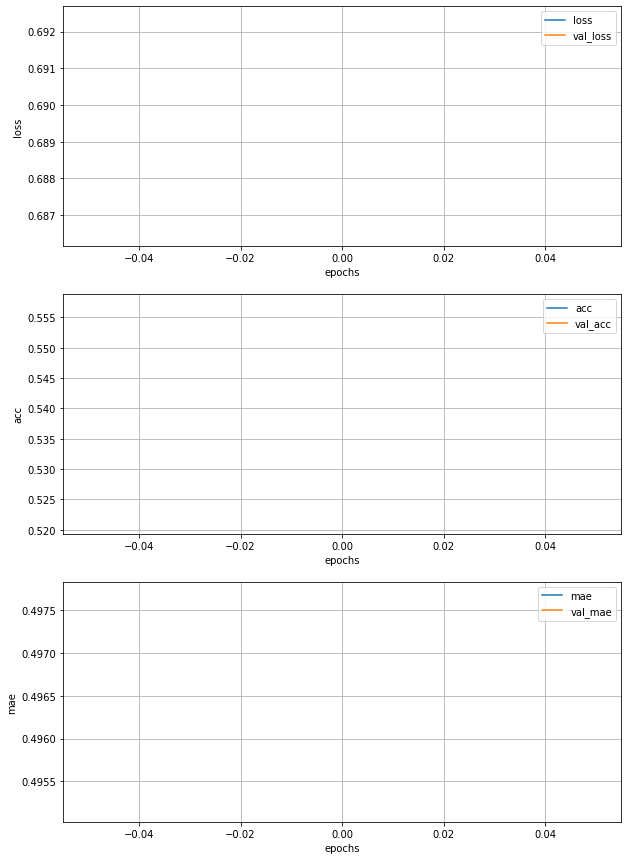

Epoch 2/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6872 - acc: 0.5498 - mae: 0.4939 - val_loss: 0.6808 - val_acc: 0.5702 - val_mae: 0.4897


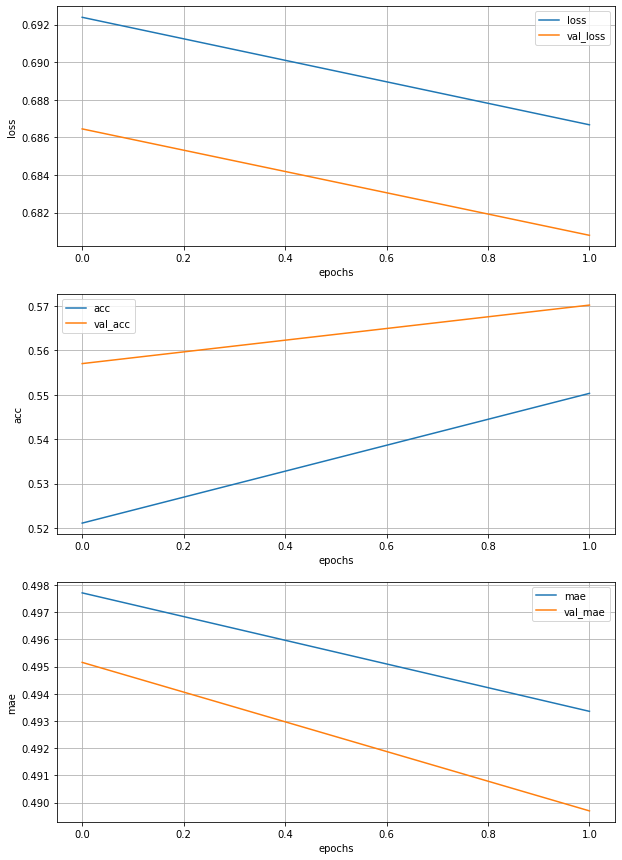

Epoch 3/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6858 - acc: 0.5565 - mae: 0.4916 - val_loss: 0.6815 - val_acc: 0.5645 - val_mae: 0.4877


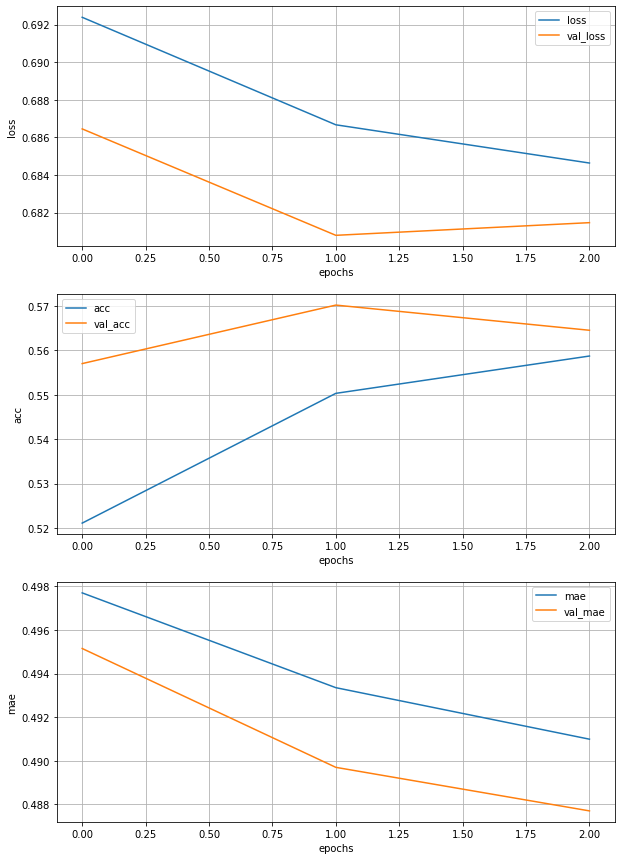

Epoch 4/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6843 - acc: 0.5567 - mae: 0.4904 - val_loss: 0.6780 - val_acc: 0.5742 - val_mae: 0.4858


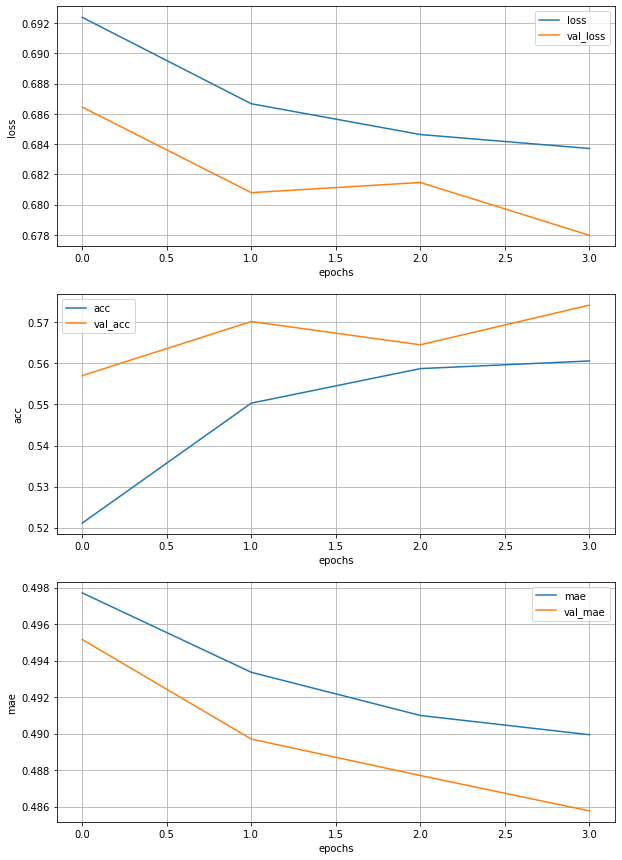

Epoch 5/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6853 - acc: 0.5569 - mae: 0.4913 - val_loss: 0.6806 - val_acc: 0.5737 - val_mae: 0.4910


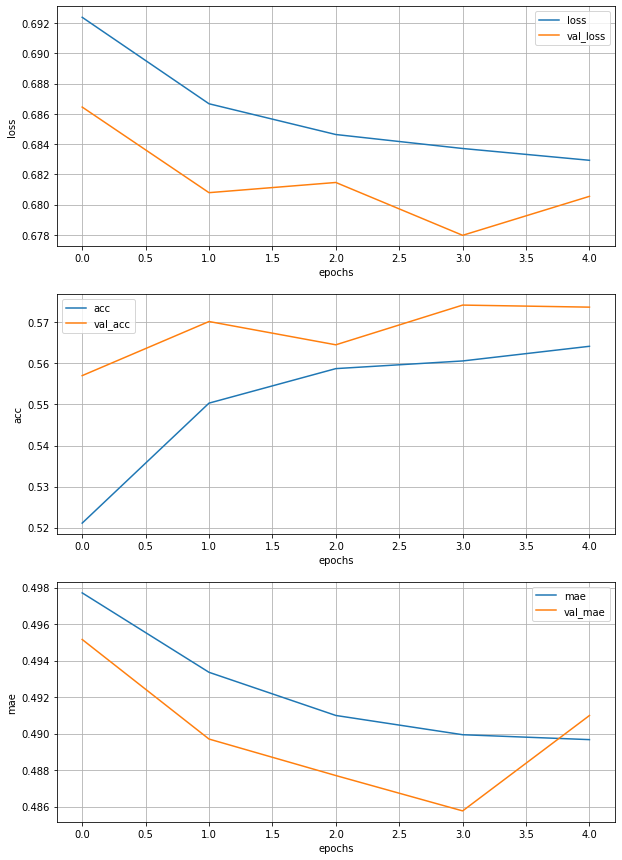

Epoch 6/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6815 - acc: 0.5666 - mae: 0.4885 - val_loss: 0.6774 - val_acc: 0.5735 - val_mae: 0.4835


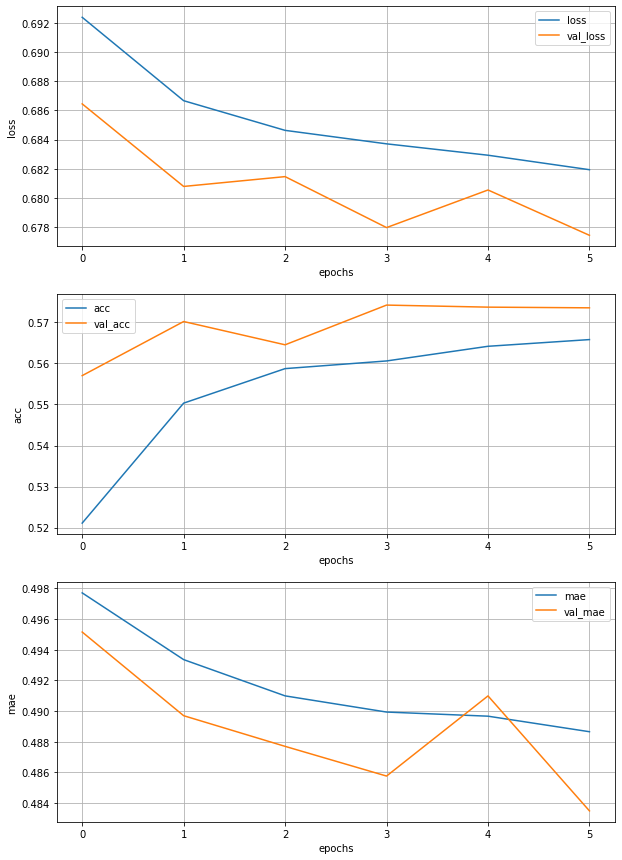

Epoch 7/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6809 - acc: 0.5683 - mae: 0.4880 - val_loss: 0.6834 - val_acc: 0.5534 - val_mae: 0.4933


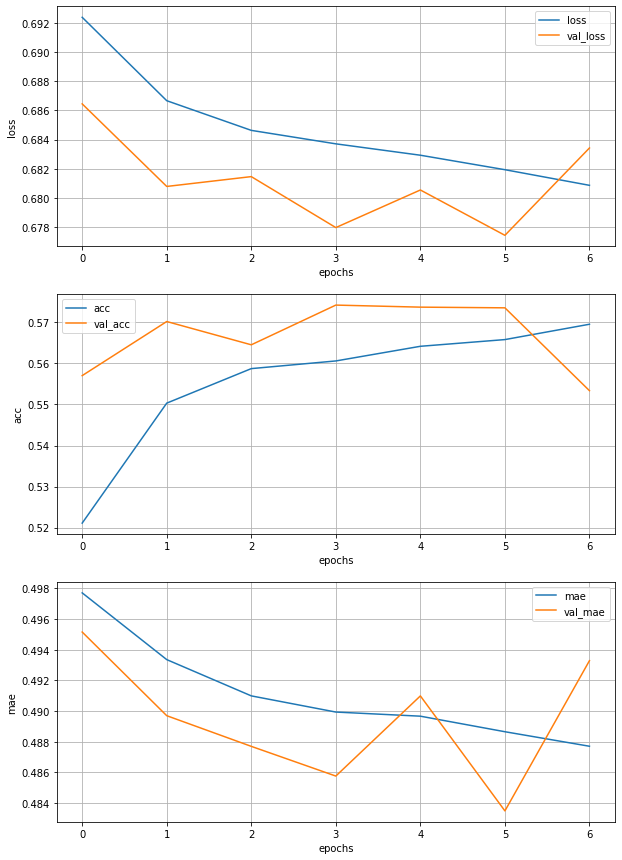

Epoch 8/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6817 - acc: 0.5650 - mae: 0.4884 - val_loss: 0.6845 - val_acc: 0.5525 - val_mae: 0.4887


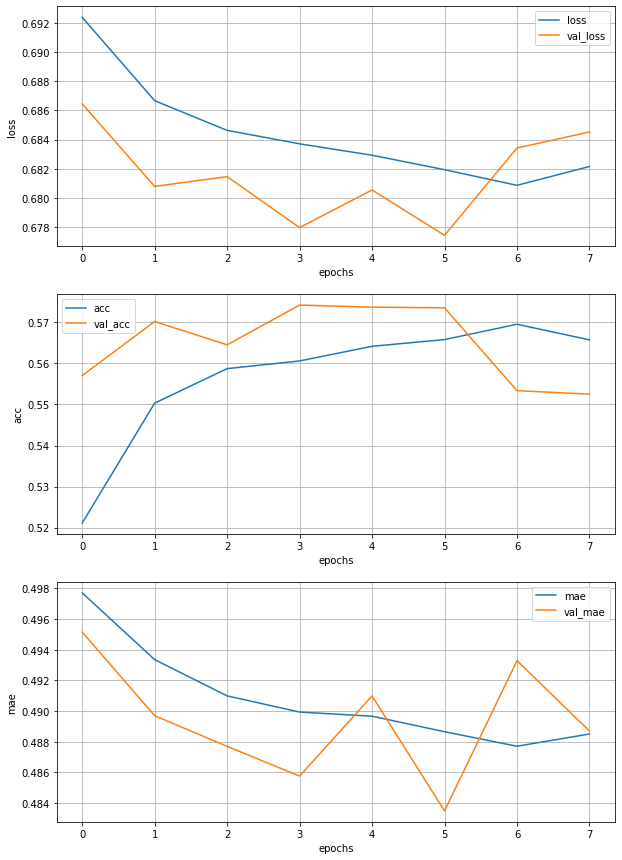

Epoch 9/150
938/938 [==============================] - 3s 4ms/step - loss: 0.6815 - acc: 0.5653 - mae: 0.4880 - val_loss: 0.6759 - val_acc: 0.5794 - val_mae: 0.4847


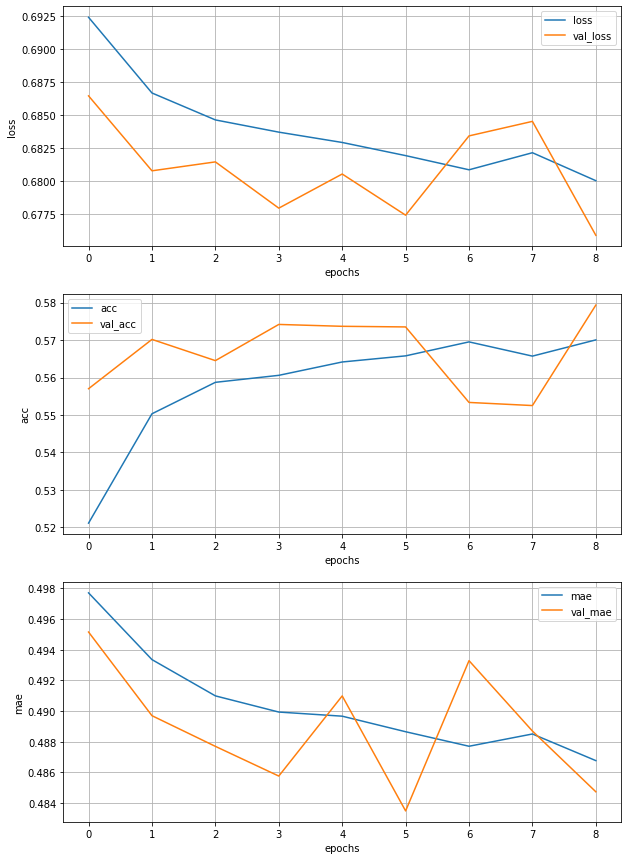

Epoch 10/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6824 - acc: 0.5651 - mae: 0.4884 - val_loss: 0.6776 - val_acc: 0.5727 - val_mae: 0.4874


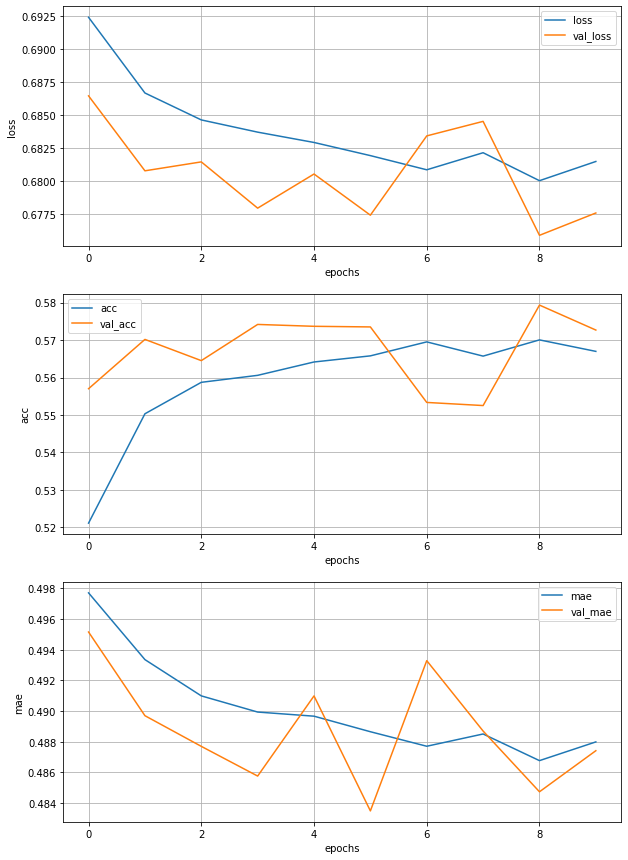

Epoch 11/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6804 - acc: 0.5708 - mae: 0.4873 - val_loss: 0.6777 - val_acc: 0.5755 - val_mae: 0.4862


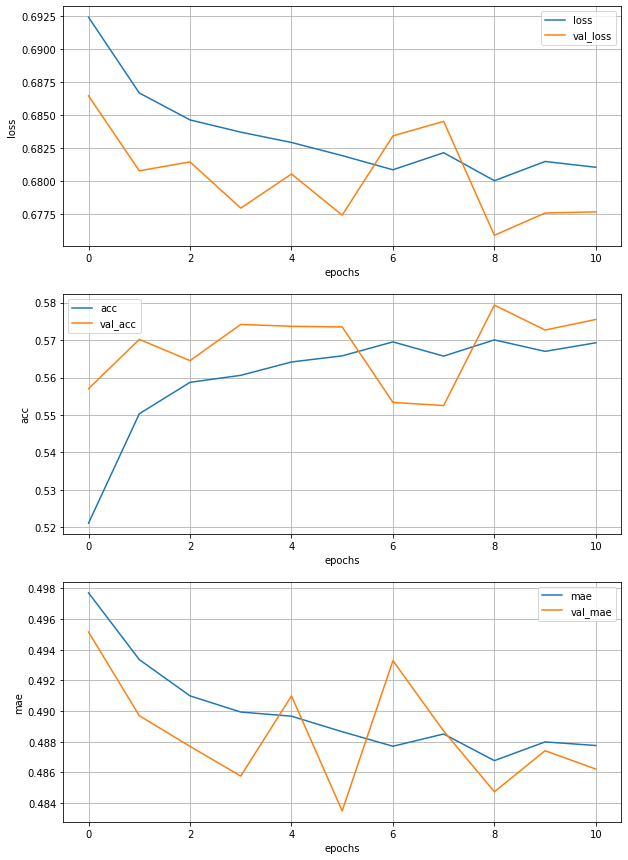

Epoch 12/150
938/938 [==============================] - 3s 4ms/step - loss: 0.6785 - acc: 0.5740 - mae: 0.4856 - val_loss: 0.6760 - val_acc: 0.5812 - val_mae: 0.4862


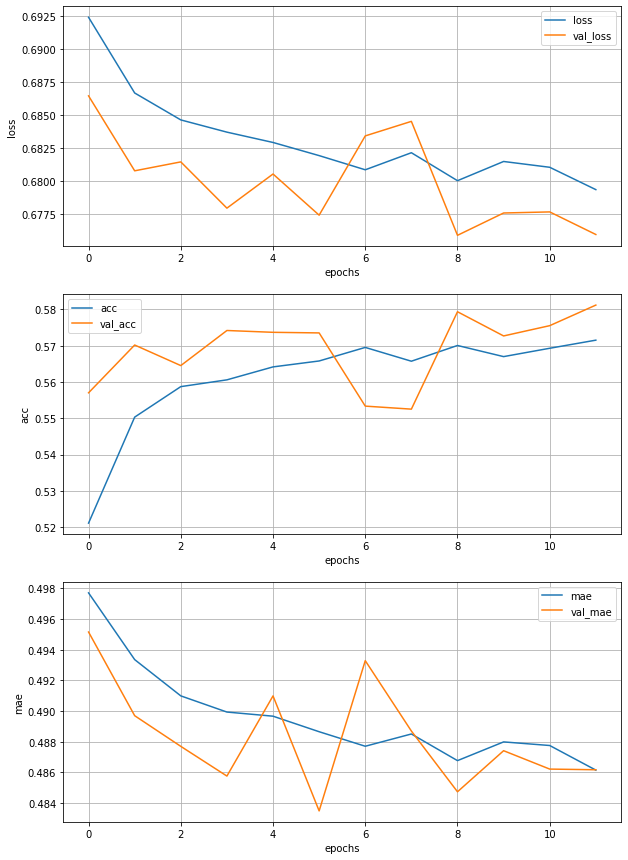

Epoch 13/150
938/938 [==============================] - 3s 4ms/step - loss: 0.6798 - acc: 0.5704 - mae: 0.4862 - val_loss: 0.6778 - val_acc: 0.5697 - val_mae: 0.4854


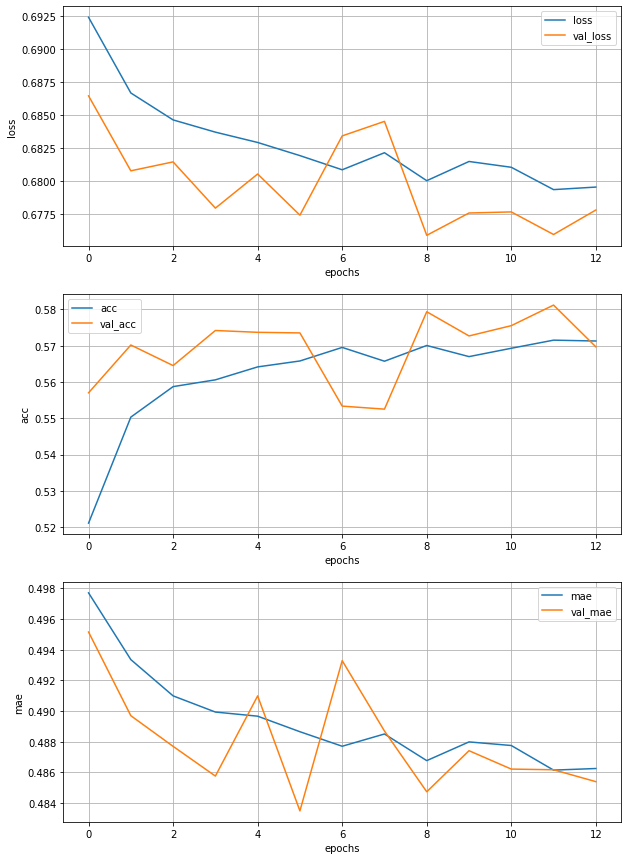

Epoch 14/150
938/938 [==============================] - 3s 3ms/step - loss: 0.6784 - acc: 0.5769 - mae: 0.4849 - val_loss: 0.6771 - val_acc: 0.5745 - val_mae: 0.4864


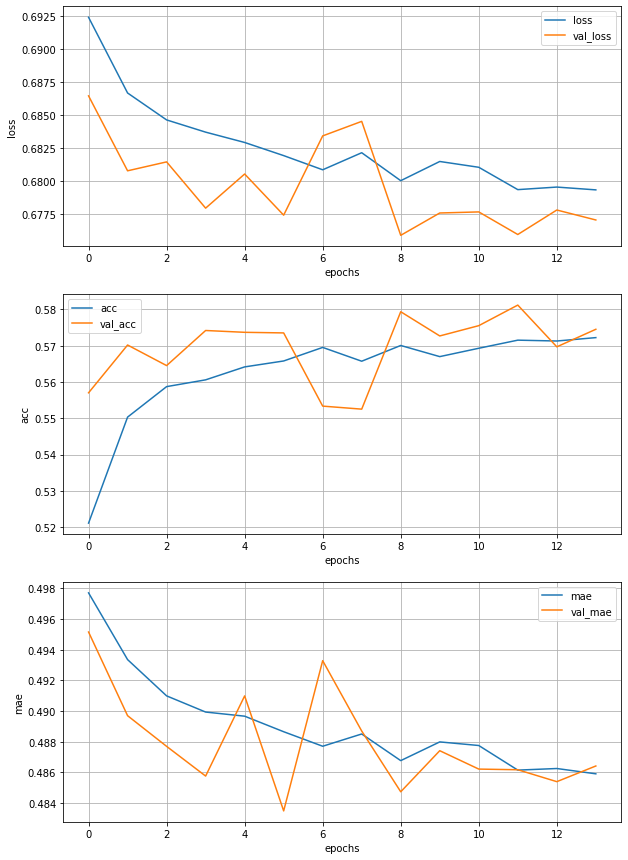

Epoch 15/150
938/938 [==============================] - 3s 4ms/step - loss: 0.6778 - acc: 0.5722 - mae: 0.4848 - val_loss: 0.6755 - val_acc: 0.5792 - val_mae: 0.4859


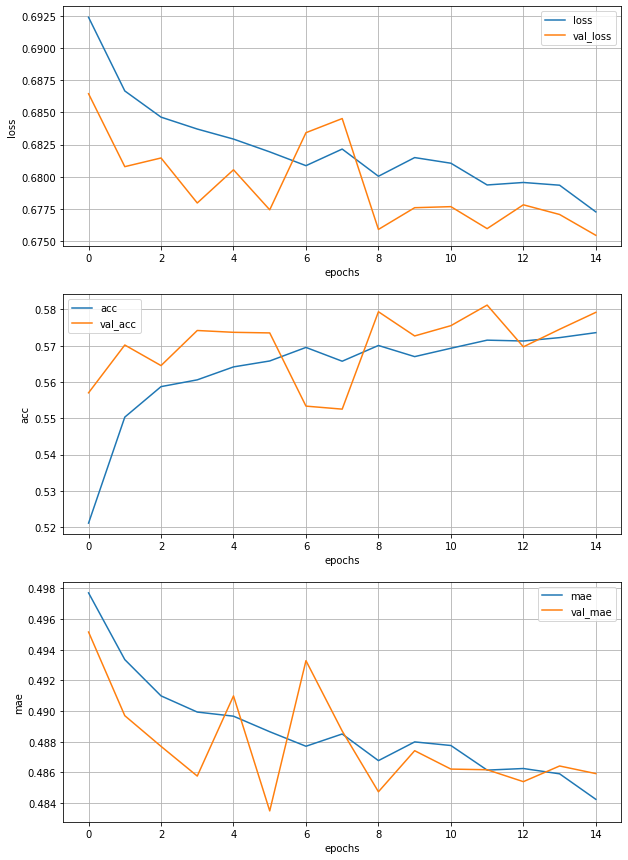

Epoch 16/150
938/938 [==============================] - 3s 4ms/step - loss: 0.6785 - acc: 0.5699 - mae: 0.4850 - val_loss: 0.6736 - val_acc: 0.5774 - val_mae: 0.4818


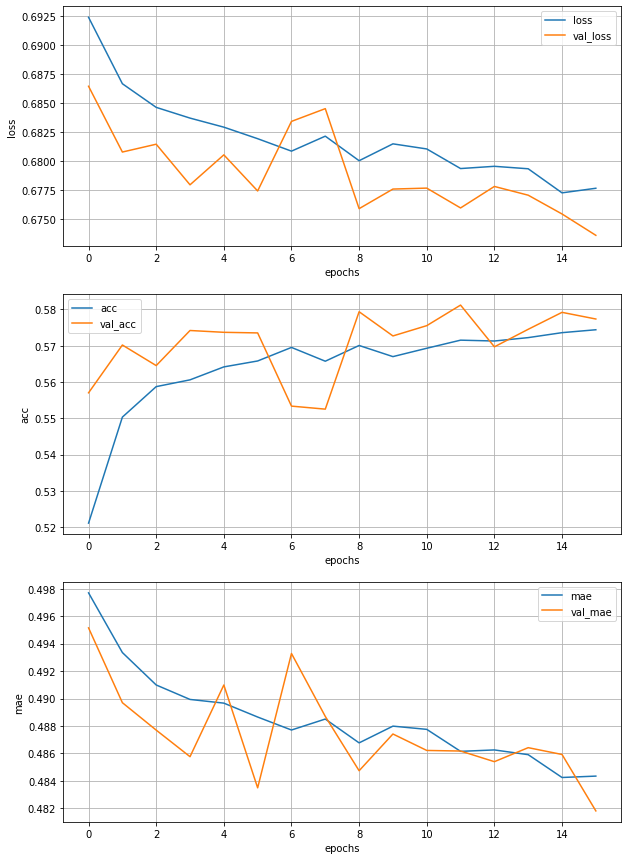

Epoch 17/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6776 - acc: 0.5738 - mae: 0.4841 - val_loss: 0.6741 - val_acc: 0.5805 - val_mae: 0.4833


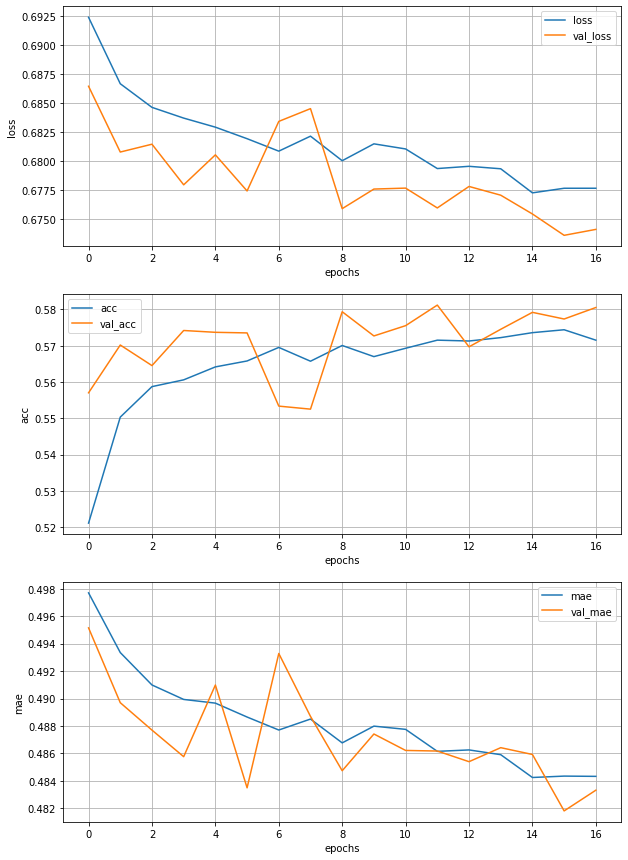

Epoch 18/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6772 - acc: 0.5784 - mae: 0.4839 - val_loss: 0.6755 - val_acc: 0.5794 - val_mae: 0.4831


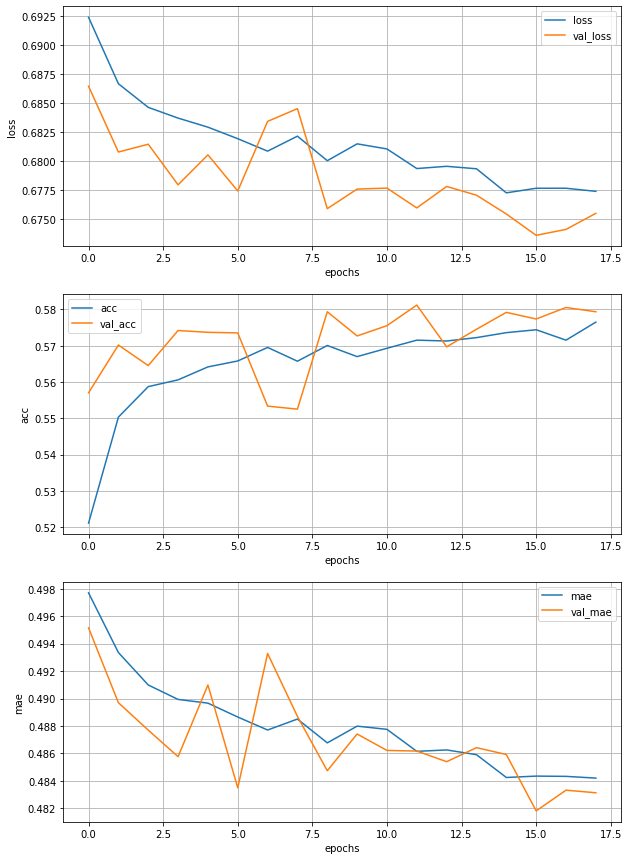

Epoch 19/150
938/938 [==============================] - 3s 4ms/step - loss: 0.6779 - acc: 0.5715 - mae: 0.4841 - val_loss: 0.6741 - val_acc: 0.5795 - val_mae: 0.4816


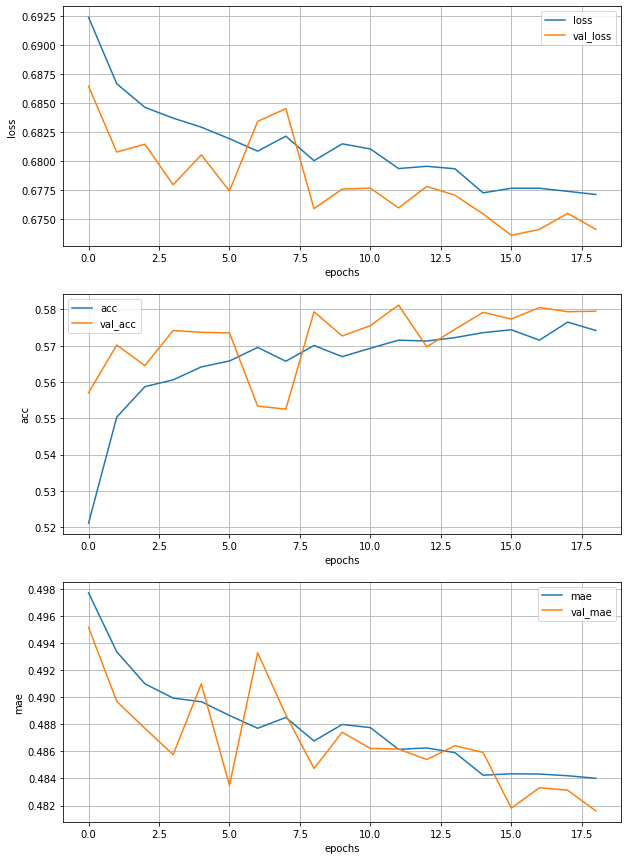

Epoch 20/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6775 - acc: 0.5766 - mae: 0.4839 - val_loss: 0.6747 - val_acc: 0.5765 - val_mae: 0.4843


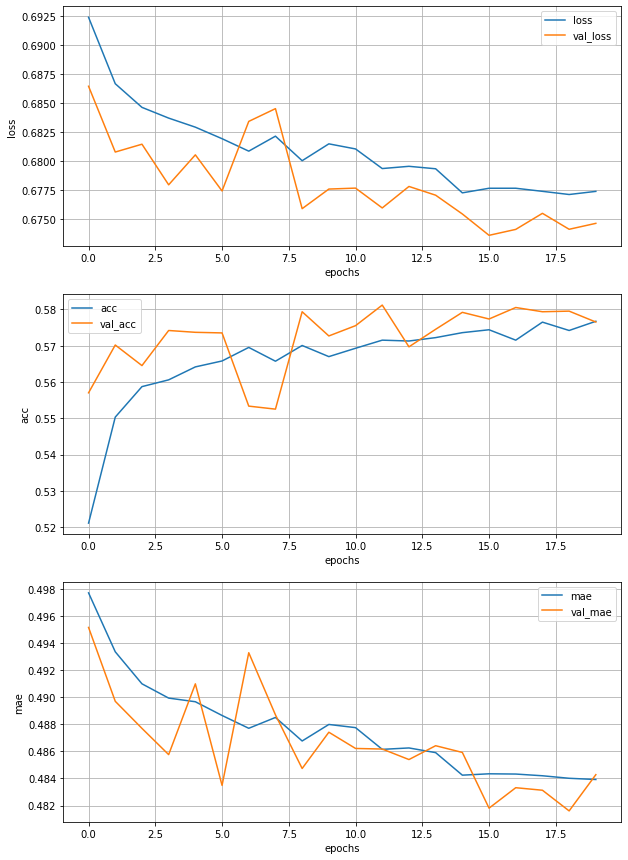

Epoch 21/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6785 - acc: 0.5689 - mae: 0.4854 - val_loss: 0.6733 - val_acc: 0.5822 - val_mae: 0.4836


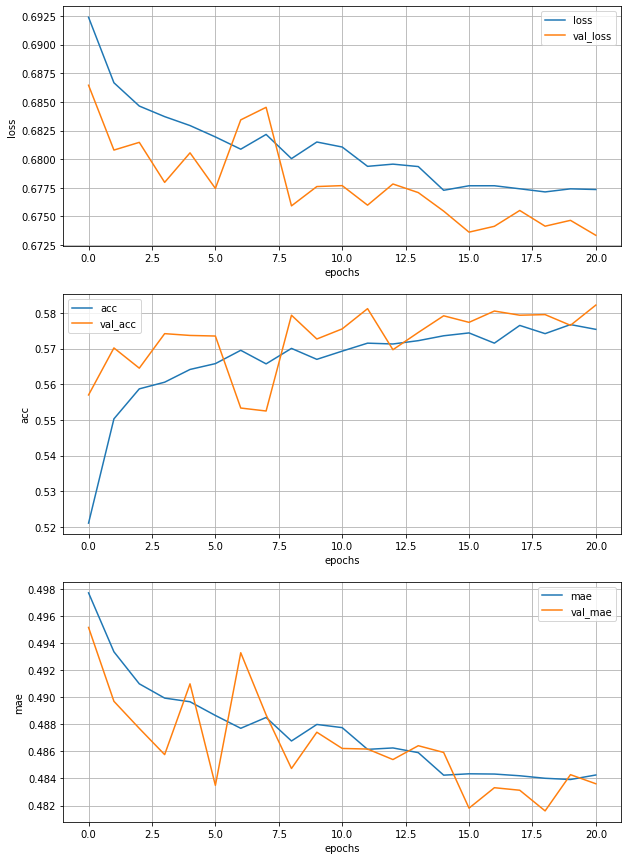

Epoch 22/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6784 - acc: 0.5762 - mae: 0.4852 - val_loss: 0.6745 - val_acc: 0.5827 - val_mae: 0.4853


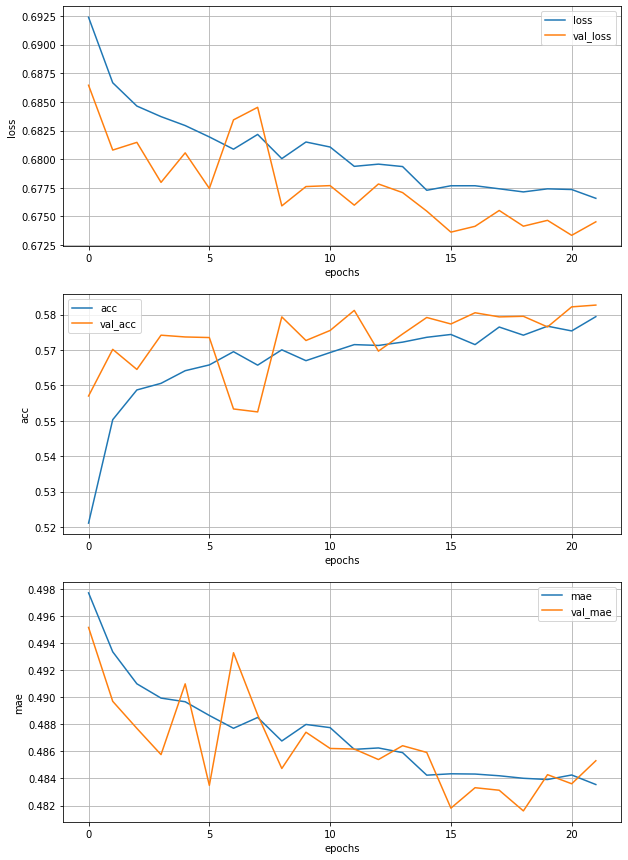

Epoch 23/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6747 - acc: 0.5853 - mae: 0.4818 - val_loss: 0.6742 - val_acc: 0.5792 - val_mae: 0.4829


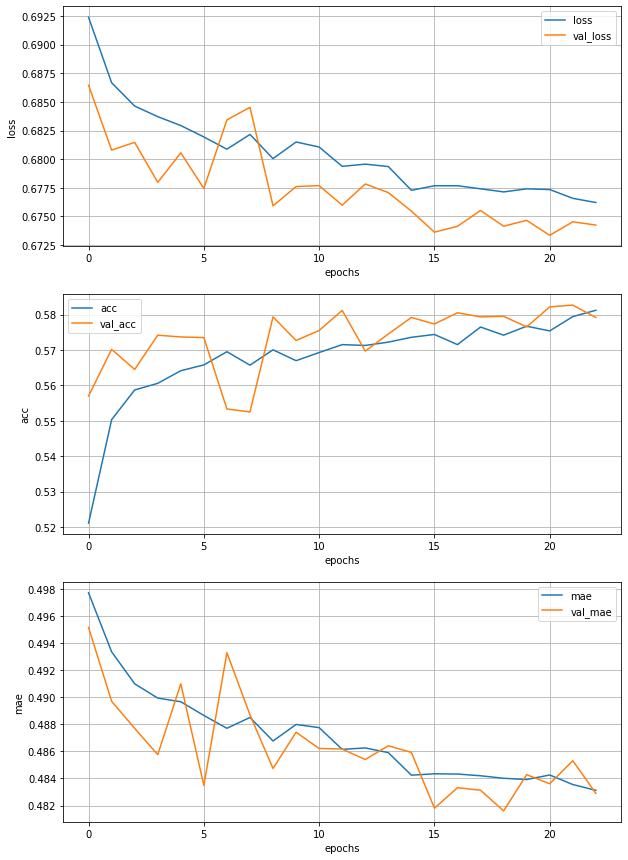

Epoch 24/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6766 - acc: 0.5774 - mae: 0.4827 - val_loss: 0.6746 - val_acc: 0.5749 - val_mae: 0.4818


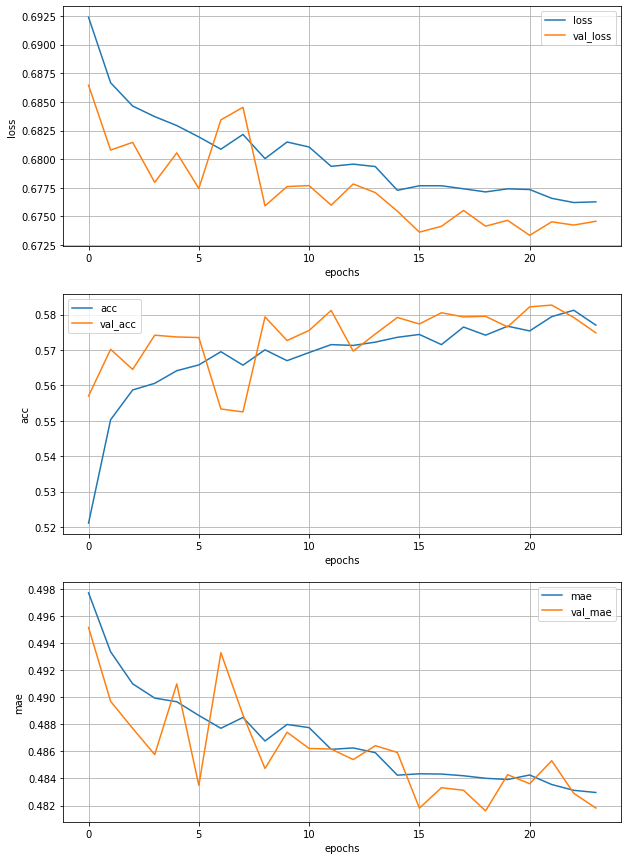

Epoch 25/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6770 - acc: 0.5764 - mae: 0.4837 - val_loss: 0.6727 - val_acc: 0.5852 - val_mae: 0.4815


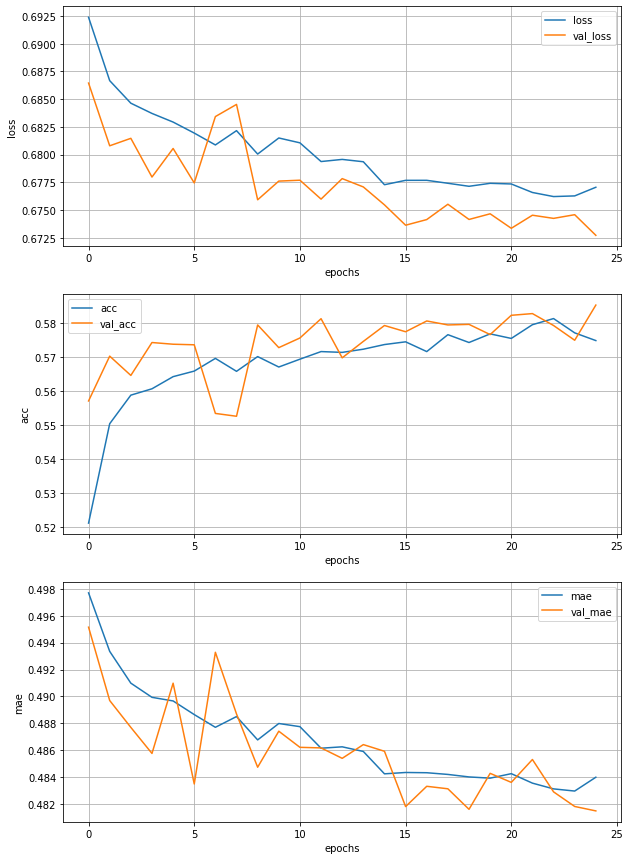

Epoch 26/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6776 - acc: 0.5748 - mae: 0.4838 - val_loss: 0.6795 - val_acc: 0.5694 - val_mae: 0.4879


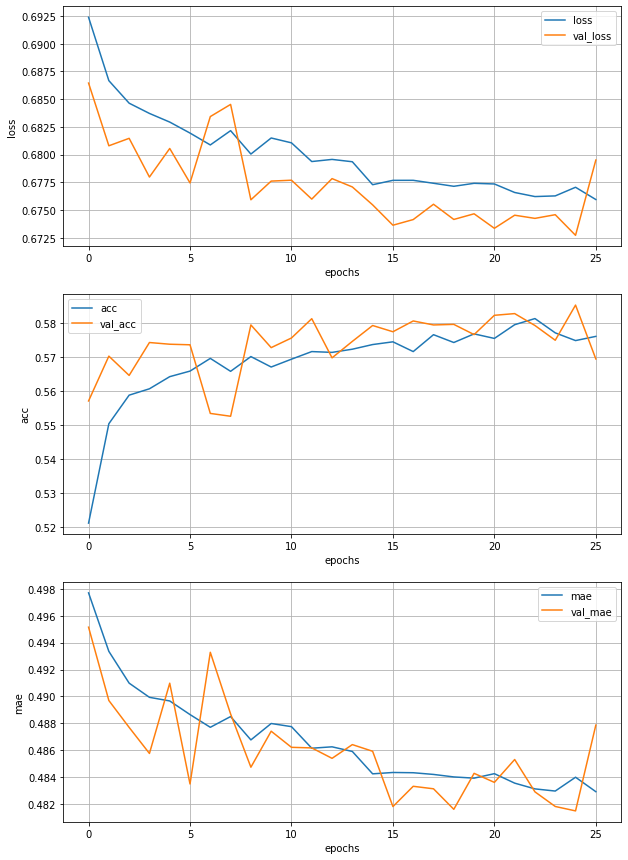

Epoch 27/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6766 - acc: 0.5742 - mae: 0.4830 - val_loss: 0.6746 - val_acc: 0.5777 - val_mae: 0.4834


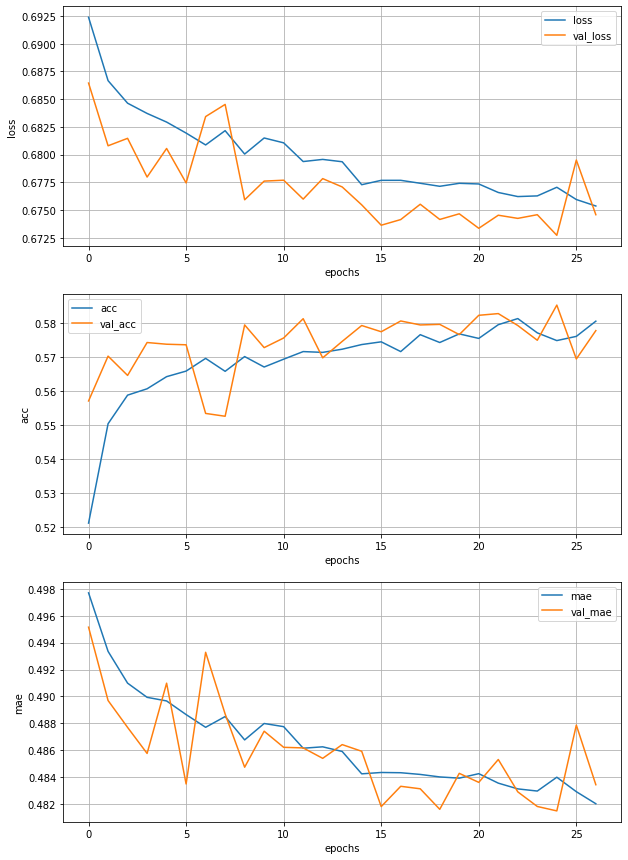

Epoch 28/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6741 - acc: 0.5805 - mae: 0.4815 - val_loss: 0.6718 - val_acc: 0.5879 - val_mae: 0.4819


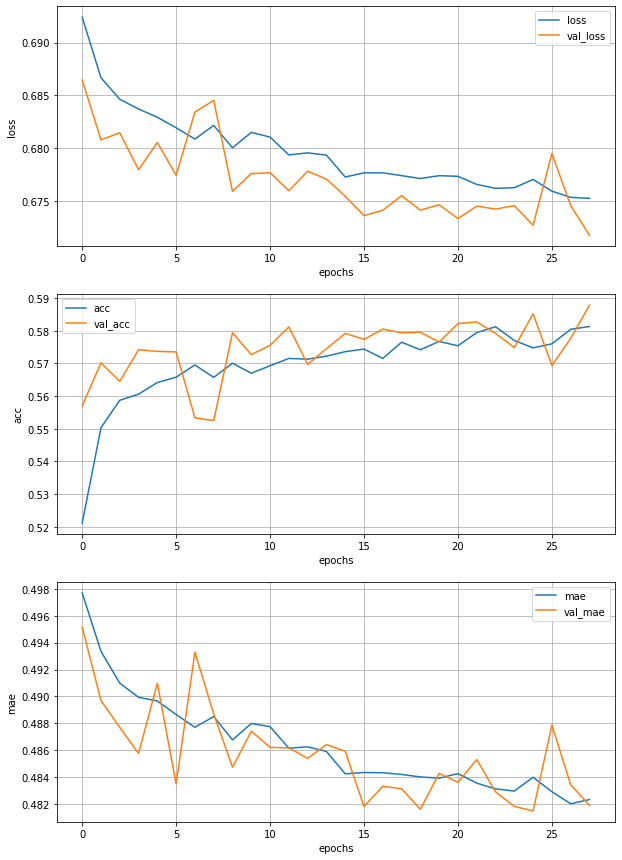

Epoch 29/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6744 - acc: 0.5843 - mae: 0.4813 - val_loss: 0.6765 - val_acc: 0.5780 - val_mae: 0.4882


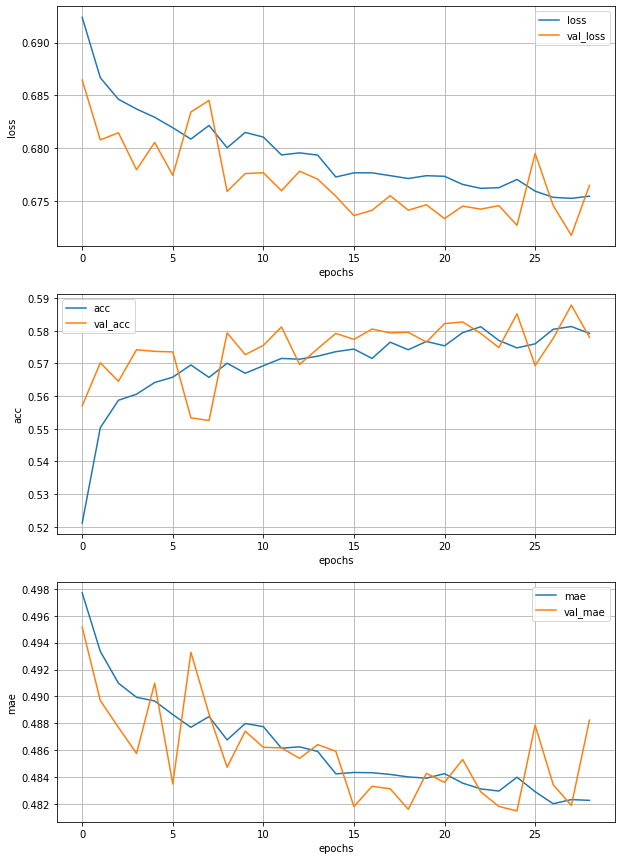

Epoch 30/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6748 - acc: 0.5748 - mae: 0.4820 - val_loss: 0.6732 - val_acc: 0.5770 - val_mae: 0.4809


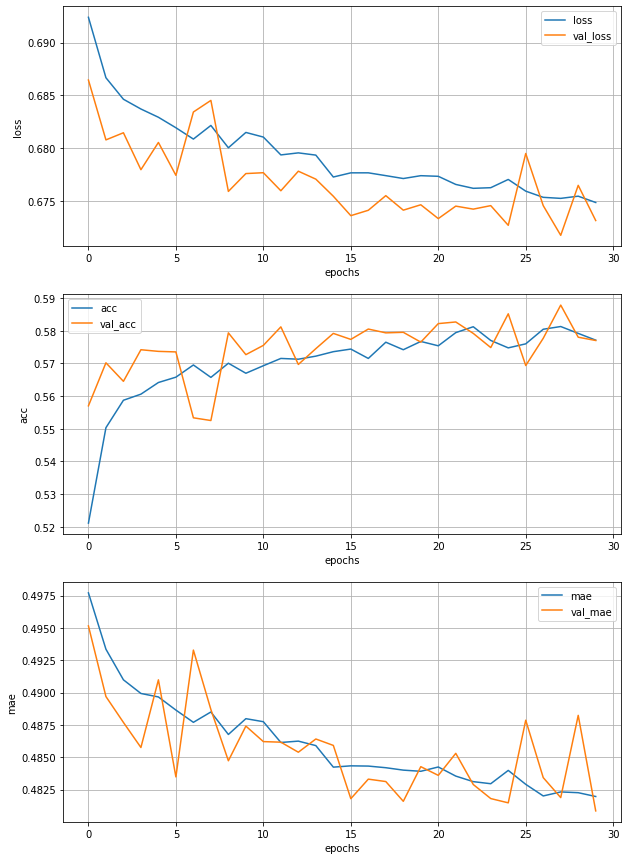

Epoch 31/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6775 - acc: 0.5791 - mae: 0.4833 - val_loss: 0.6735 - val_acc: 0.5859 - val_mae: 0.4787


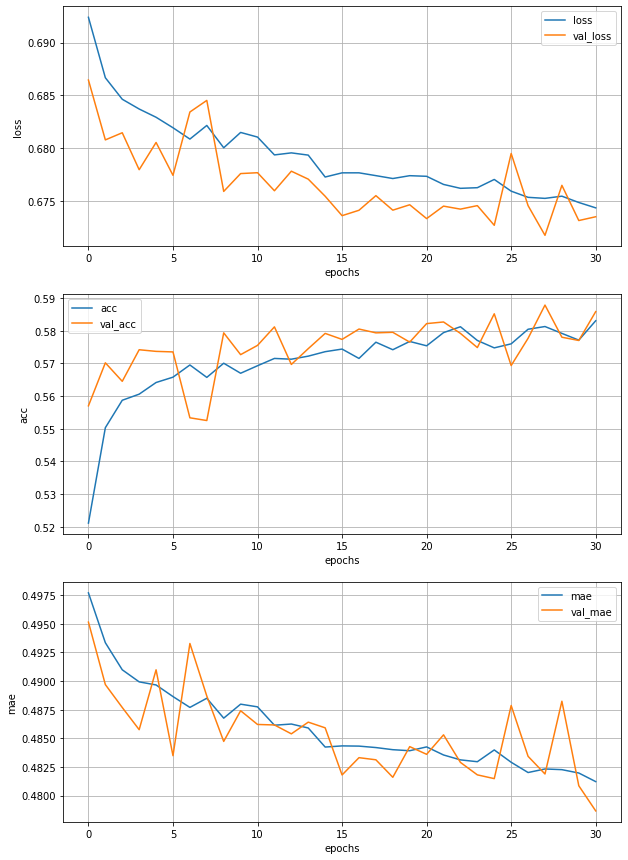

Epoch 32/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6734 - acc: 0.5818 - mae: 0.4802 - val_loss: 0.6725 - val_acc: 0.5874 - val_mae: 0.4830


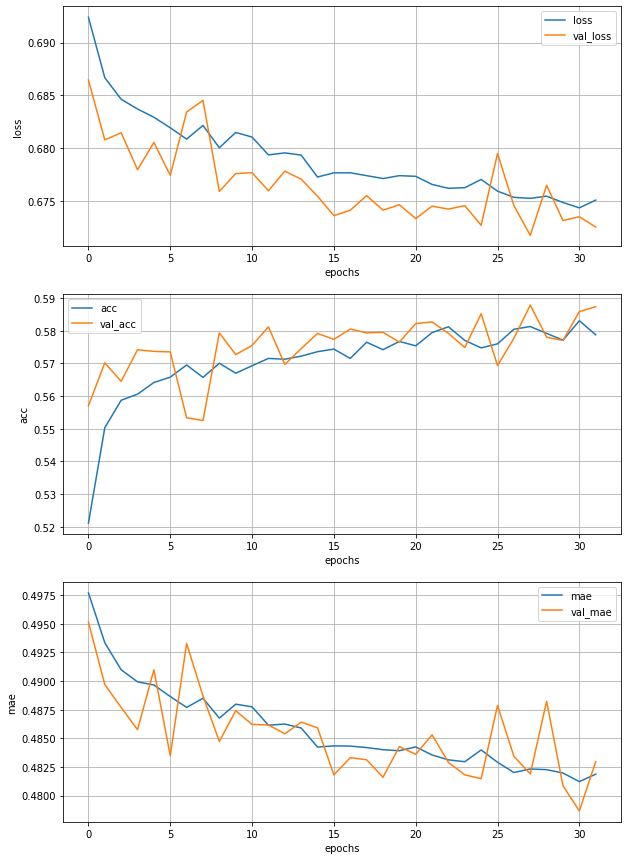

Epoch 33/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6724 - acc: 0.5814 - mae: 0.4801 - val_loss: 0.6725 - val_acc: 0.5845 - val_mae: 0.4831


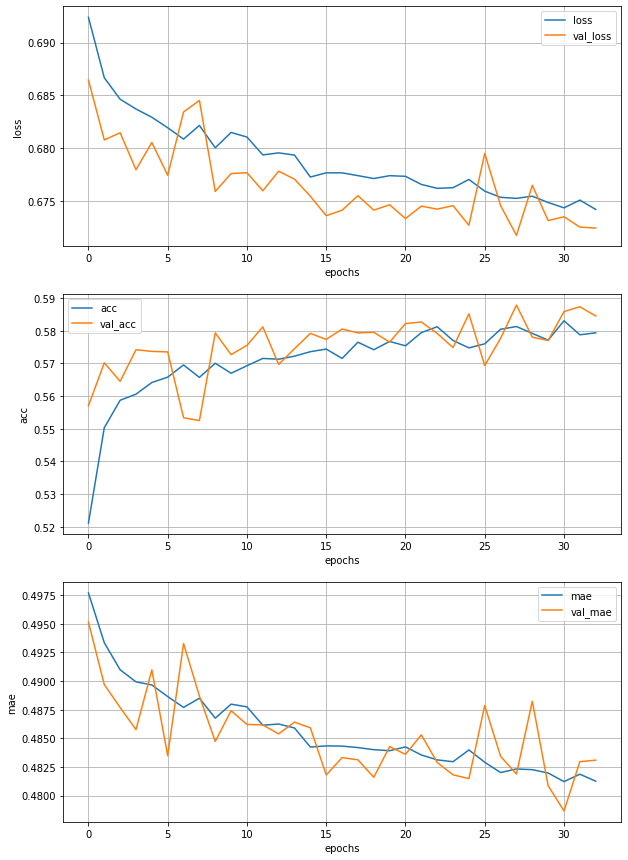

Epoch 34/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6766 - acc: 0.5757 - mae: 0.4834 - val_loss: 0.6717 - val_acc: 0.5882 - val_mae: 0.4819


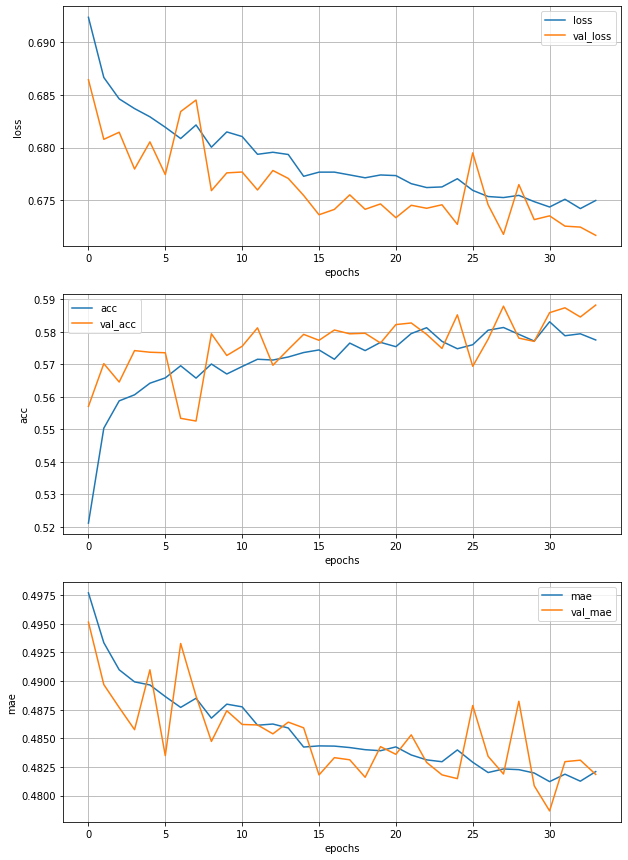

Epoch 35/150
938/938 [==============================] - 4s 4ms/step - loss: 0.6745 - acc: 0.5749 - mae: 0.4813 - val_loss: 0.6748 - val_acc: 0.5782 - val_mae: 0.4861


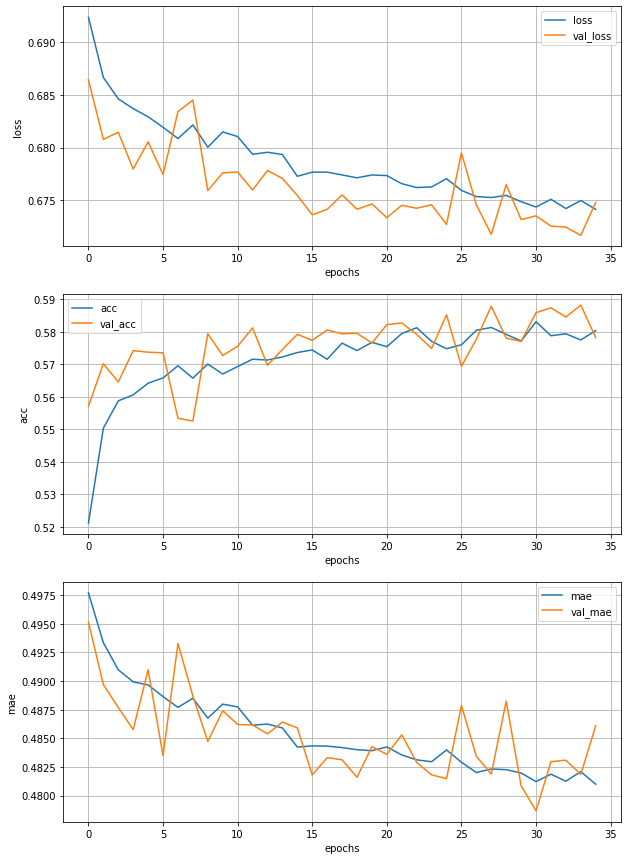

Epoch 36/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6743 - acc: 0.5793 - mae: 0.4816 - val_loss: 0.6728 - val_acc: 0.5845 - val_mae: 0.4826


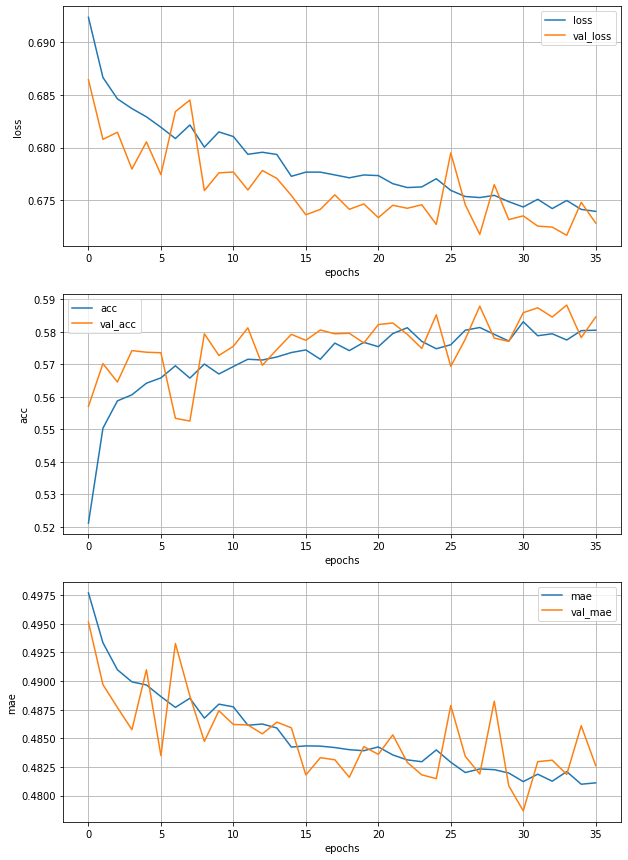

Epoch 37/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6736 - acc: 0.5828 - mae: 0.4802 - val_loss: 0.6747 - val_acc: 0.5870 - val_mae: 0.4867


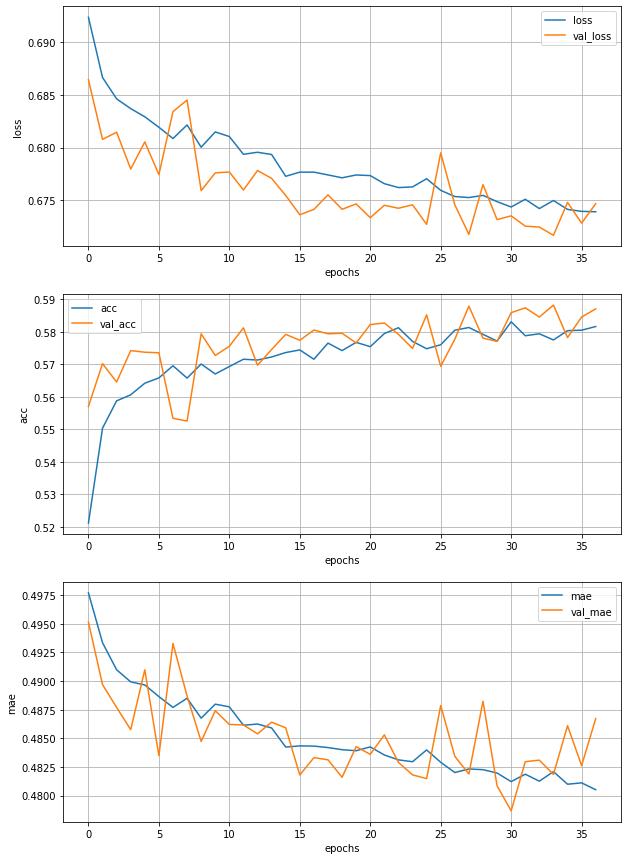

Epoch 38/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6736 - acc: 0.5821 - mae: 0.4814 - val_loss: 0.6726 - val_acc: 0.5879 - val_mae: 0.4811


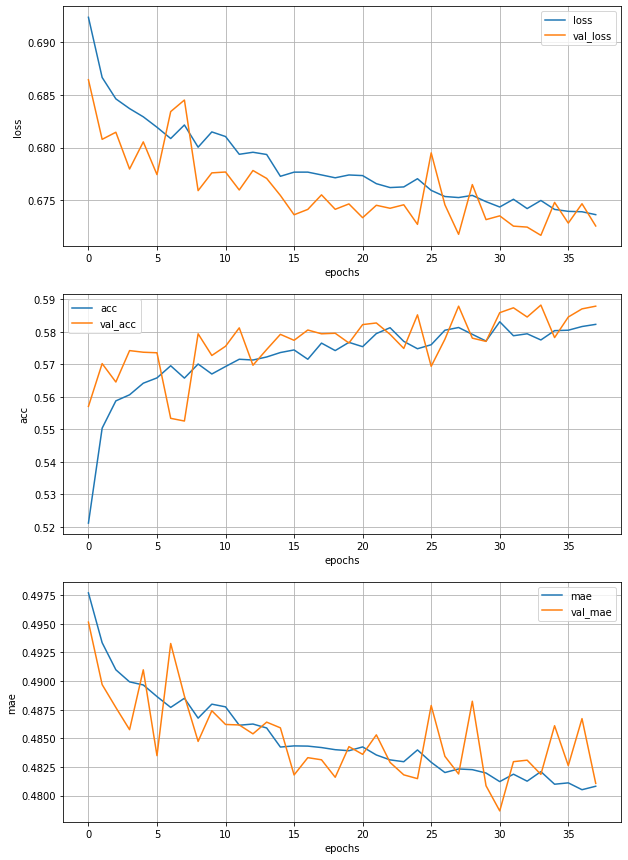

Epoch 39/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6737 - acc: 0.5801 - mae: 0.4804 - val_loss: 0.6726 - val_acc: 0.5847 - val_mae: 0.4820


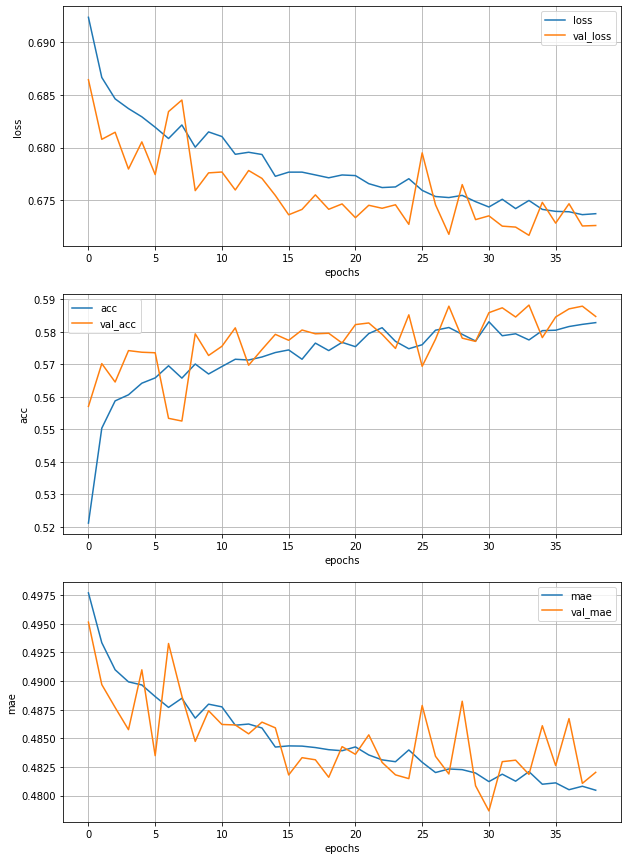

Epoch 40/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6738 - acc: 0.5802 - mae: 0.4809 - val_loss: 0.6752 - val_acc: 0.5769 - val_mae: 0.4866


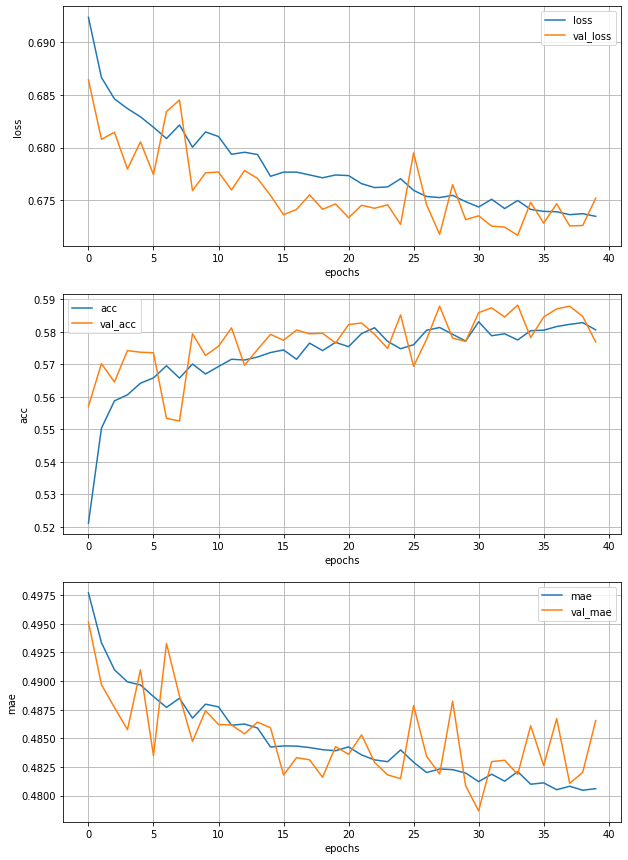

Epoch 41/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6737 - acc: 0.5823 - mae: 0.4808 - val_loss: 0.6729 - val_acc: 0.5832 - val_mae: 0.4816


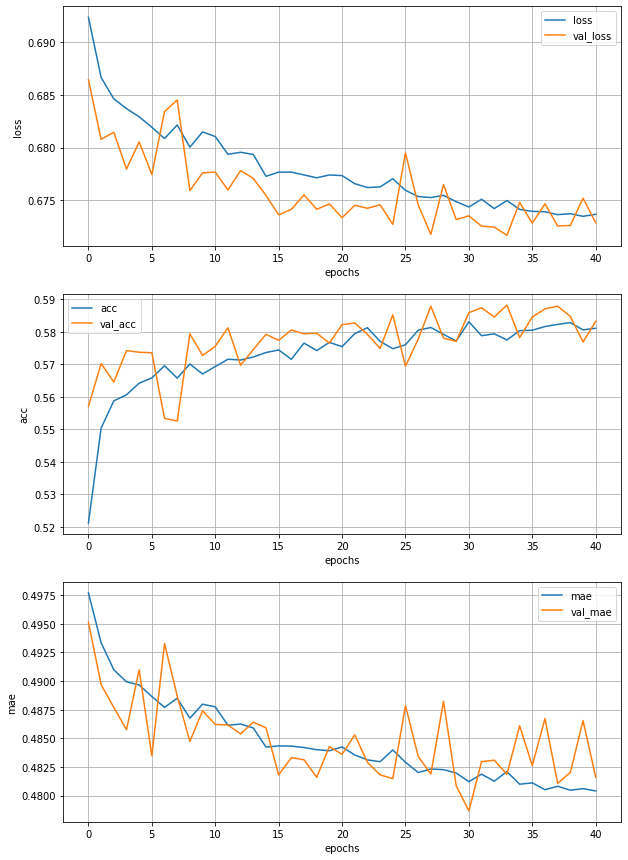

Epoch 42/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6726 - acc: 0.5862 - mae: 0.4796 - val_loss: 0.6721 - val_acc: 0.5870 - val_mae: 0.4817


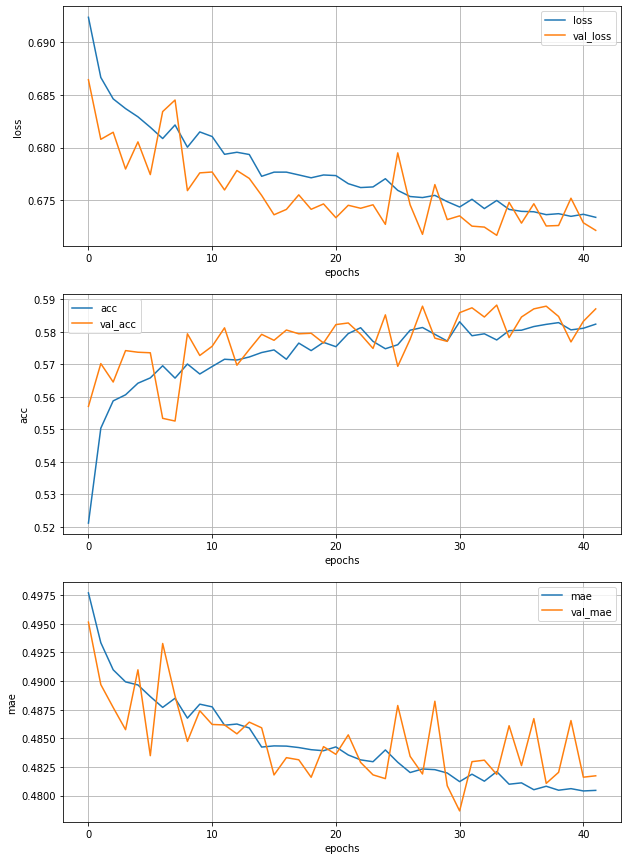

Epoch 43/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6717 - acc: 0.5828 - mae: 0.4785 - val_loss: 0.6715 - val_acc: 0.5880 - val_mae: 0.4806


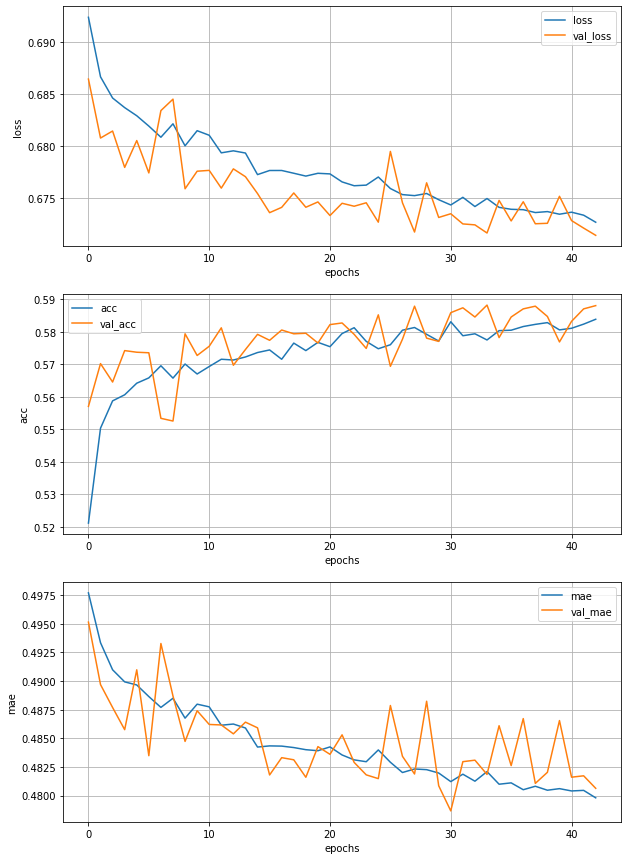

Epoch 44/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6739 - acc: 0.5790 - mae: 0.4807 - val_loss: 0.6723 - val_acc: 0.5852 - val_mae: 0.4819


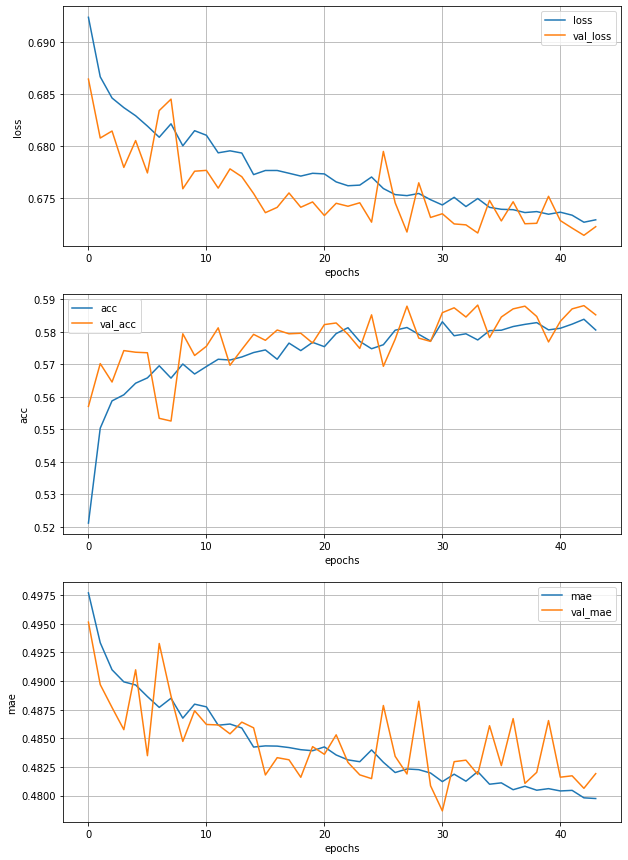

Epoch 45/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6723 - acc: 0.5836 - mae: 0.4798 - val_loss: 0.6737 - val_acc: 0.5799 - val_mae: 0.4821


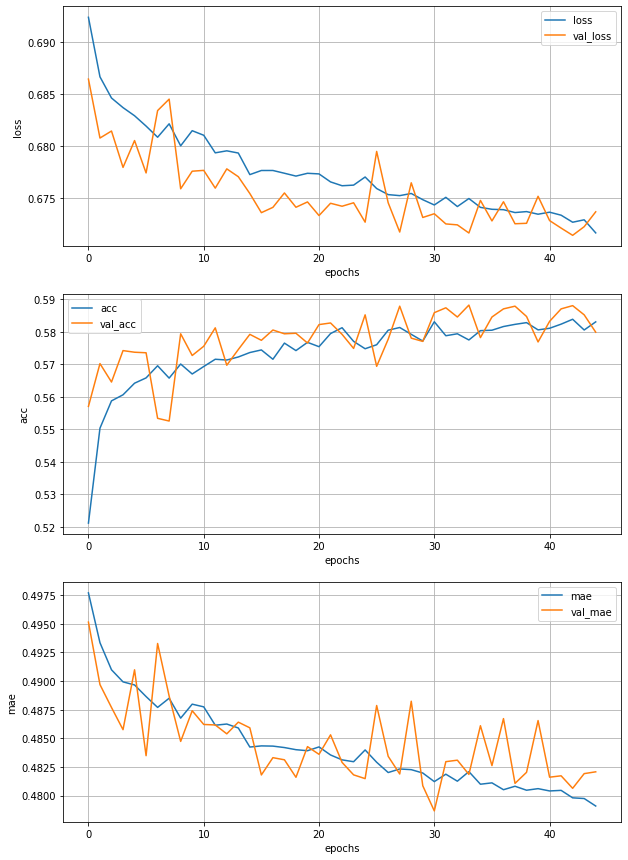

Epoch 46/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6733 - acc: 0.5820 - mae: 0.4801 - val_loss: 0.6708 - val_acc: 0.5895 - val_mae: 0.4808


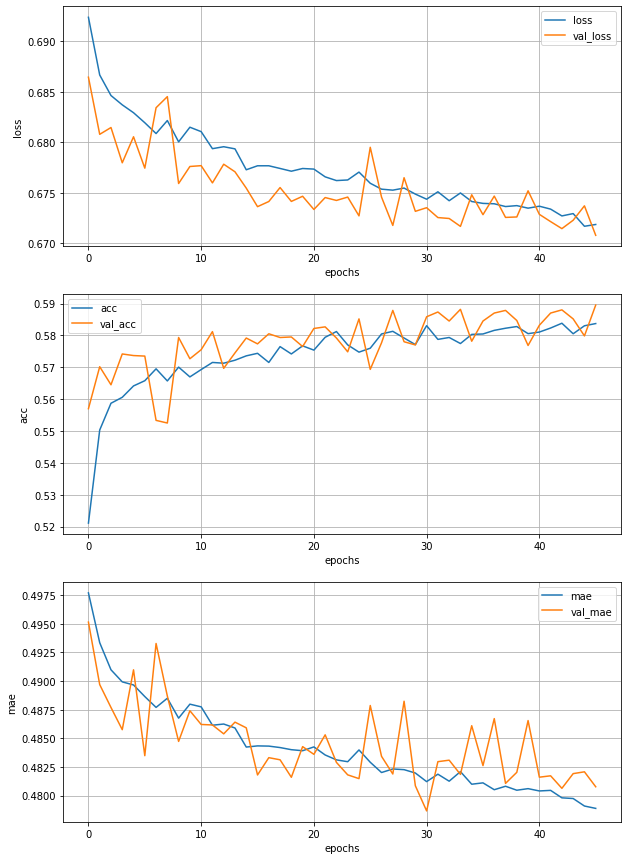

Epoch 47/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6717 - acc: 0.5849 - mae: 0.4784 - val_loss: 0.6731 - val_acc: 0.5804 - val_mae: 0.4825


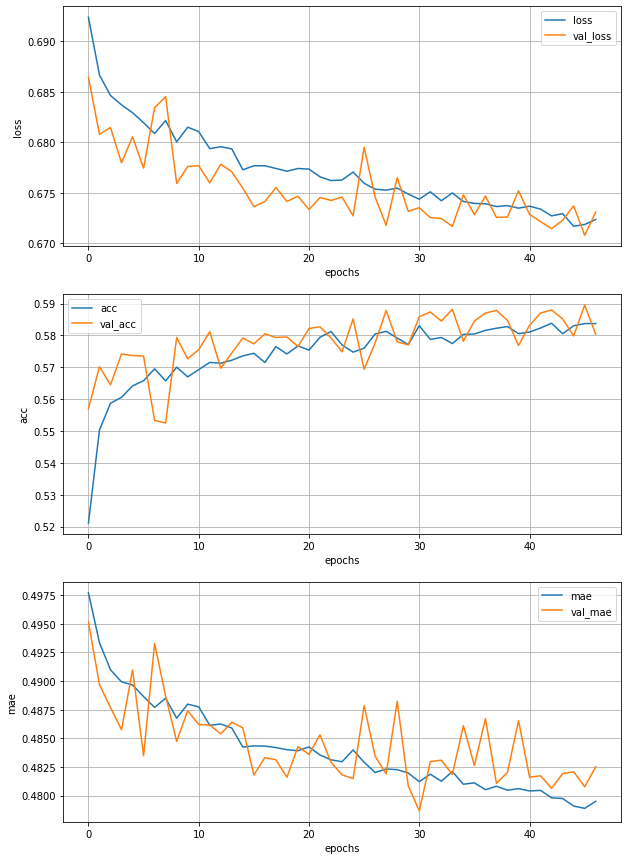

Epoch 48/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6731 - acc: 0.5815 - mae: 0.4801 - val_loss: 0.6733 - val_acc: 0.5810 - val_mae: 0.4803


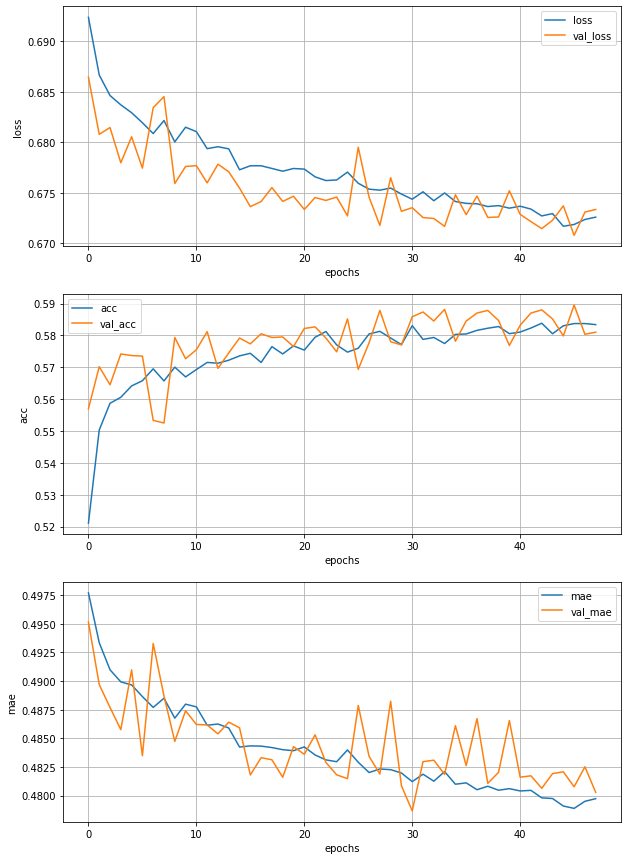

Epoch 49/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6725 - acc: 0.5844 - mae: 0.4794 - val_loss: 0.6721 - val_acc: 0.5852 - val_mae: 0.4818


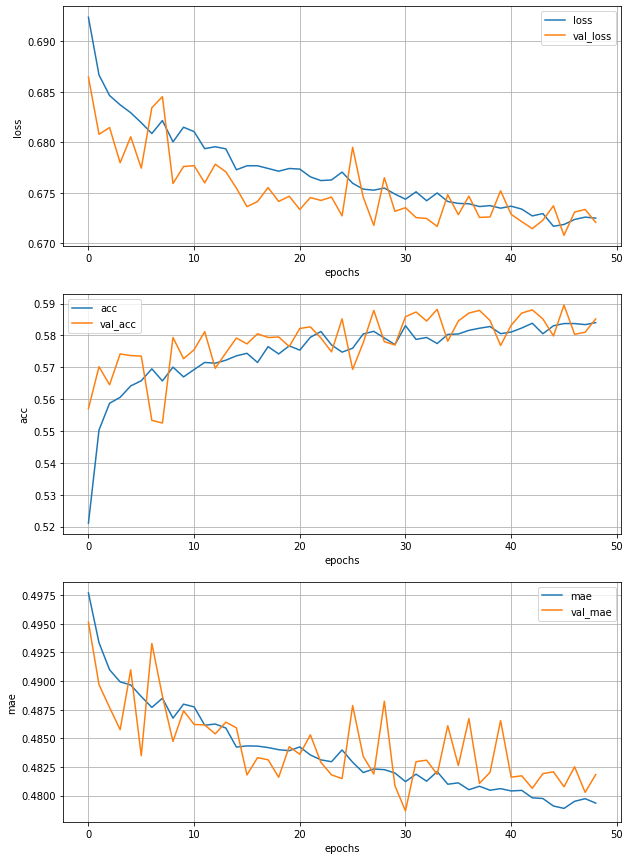

Epoch 50/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6733 - acc: 0.5823 - mae: 0.4804 - val_loss: 0.6721 - val_acc: 0.5844 - val_mae: 0.4815


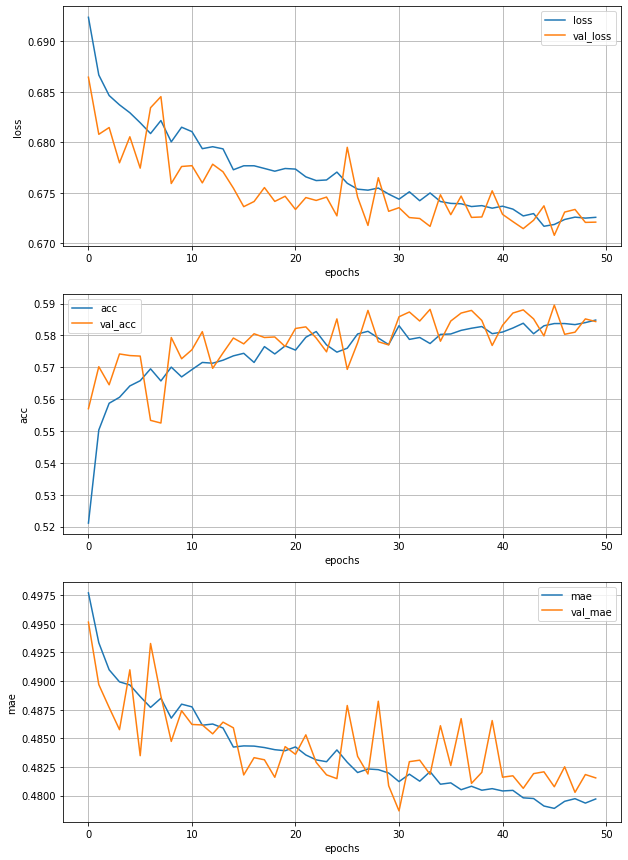

Epoch 51/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6716 - acc: 0.5878 - mae: 0.4788 - val_loss: 0.6739 - val_acc: 0.5792 - val_mae: 0.4830


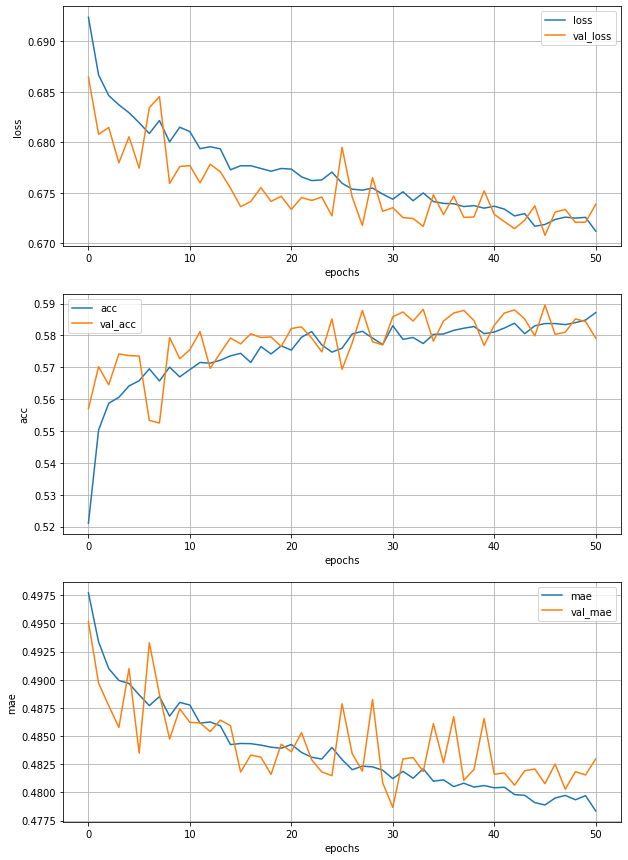

Epoch 52/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6720 - acc: 0.5791 - mae: 0.4789 - val_loss: 0.6730 - val_acc: 0.5817 - val_mae: 0.4813


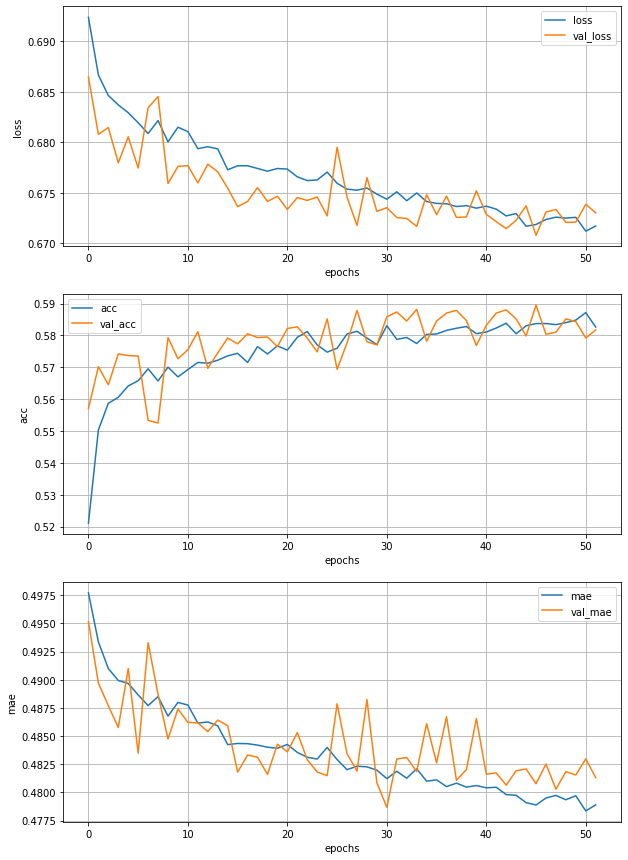

Epoch 53/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6682 - acc: 0.5898 - mae: 0.4762 - val_loss: 0.6732 - val_acc: 0.5815 - val_mae: 0.4837


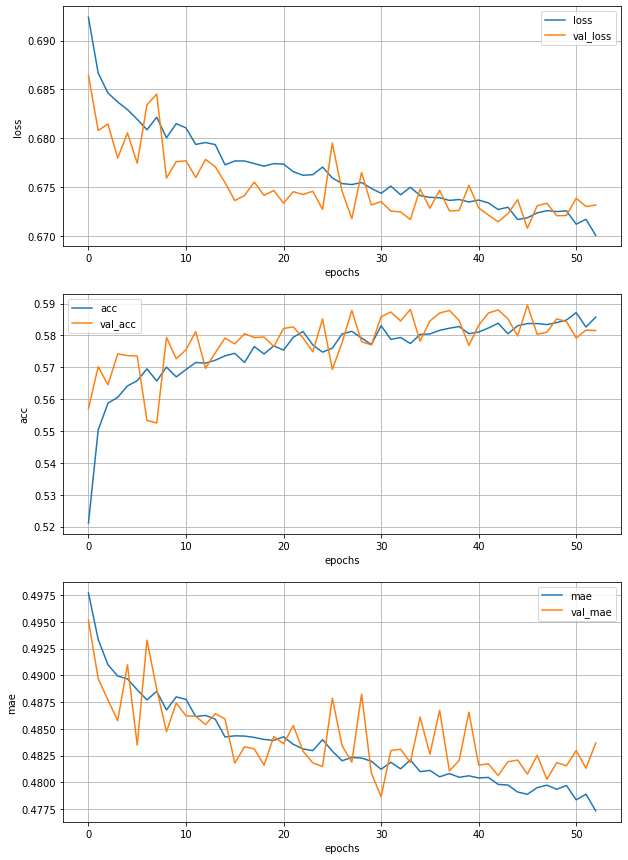

Epoch 54/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6712 - acc: 0.5836 - mae: 0.4784 - val_loss: 0.6737 - val_acc: 0.5867 - val_mae: 0.4848


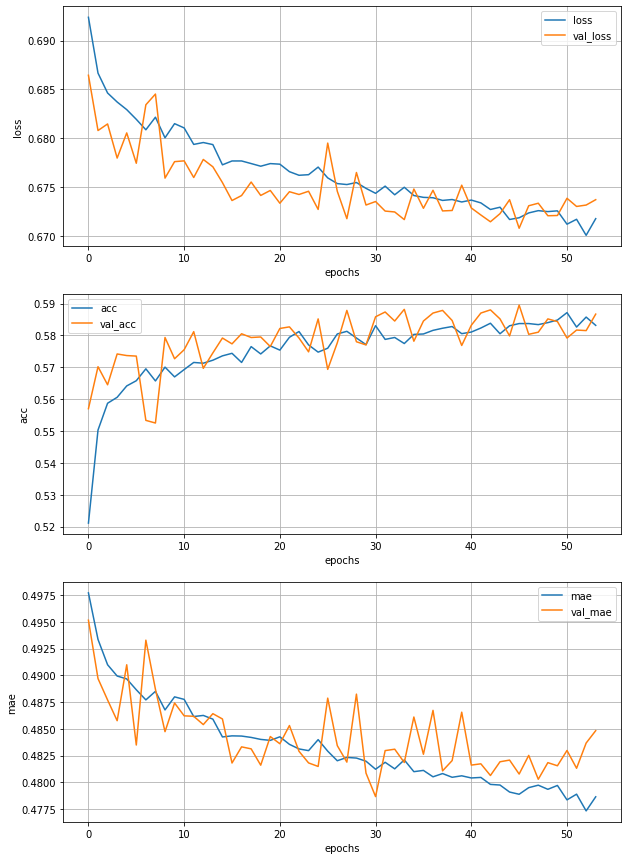

Epoch 55/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6693 - acc: 0.5899 - mae: 0.4774 - val_loss: 0.6722 - val_acc: 0.5887 - val_mae: 0.4806


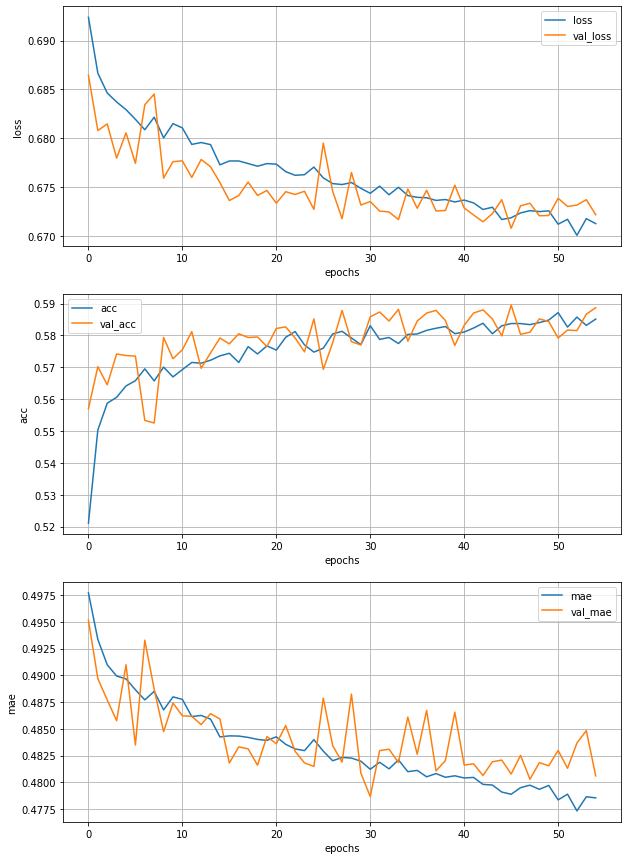

Epoch 56/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6709 - acc: 0.5832 - mae: 0.4782 - val_loss: 0.6738 - val_acc: 0.5830 - val_mae: 0.4843


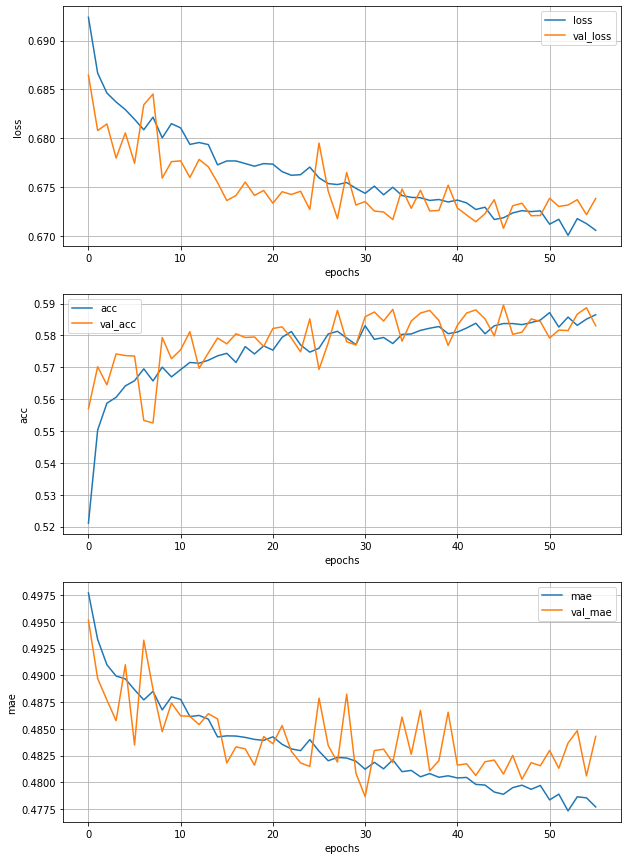

Epoch 57/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6706 - acc: 0.5873 - mae: 0.4782 - val_loss: 0.6704 - val_acc: 0.5872 - val_mae: 0.4788


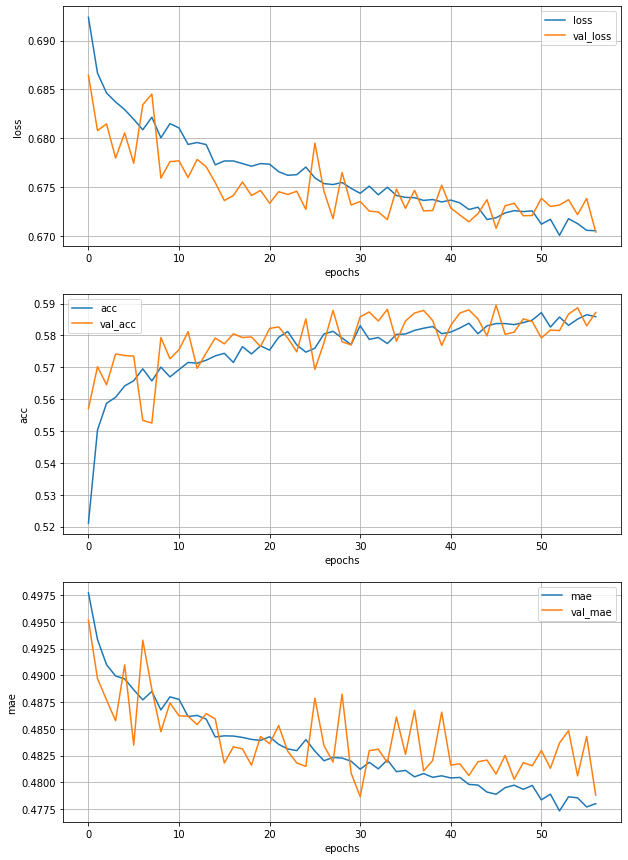

Epoch 58/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6681 - acc: 0.5926 - mae: 0.4756 - val_loss: 0.6704 - val_acc: 0.5885 - val_mae: 0.4794


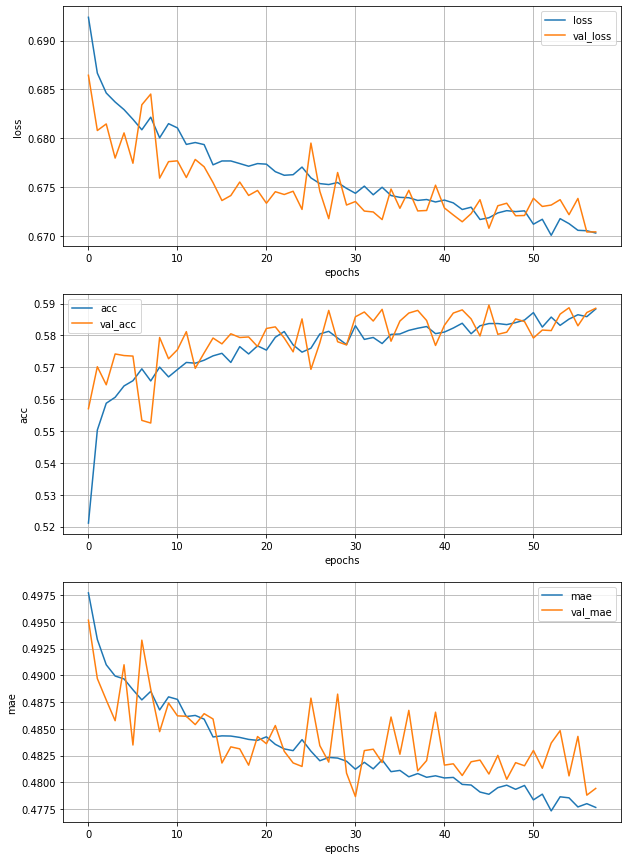

Epoch 59/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6687 - acc: 0.5863 - mae: 0.4761 - val_loss: 0.6734 - val_acc: 0.5867 - val_mae: 0.4841


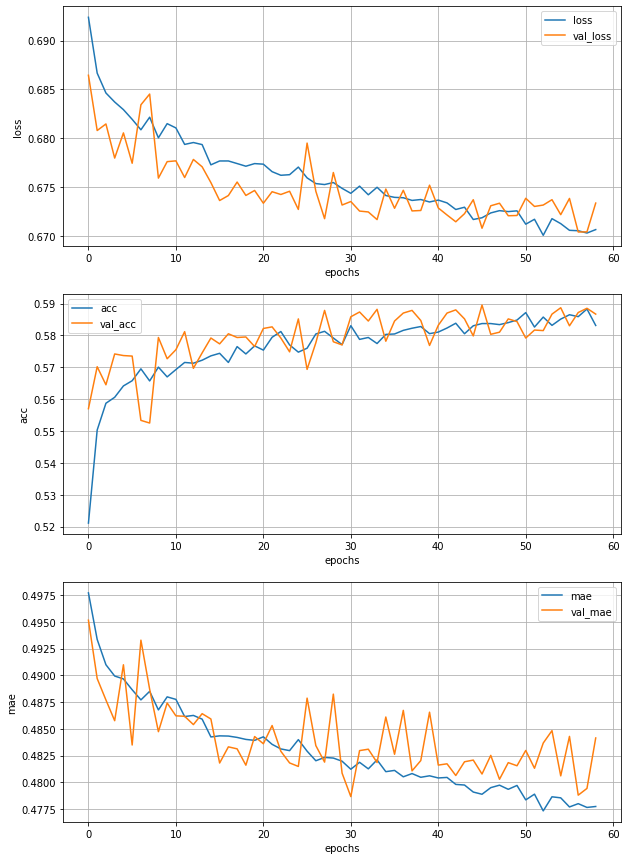

Epoch 60/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6684 - acc: 0.5867 - mae: 0.4764 - val_loss: 0.6719 - val_acc: 0.5839 - val_mae: 0.4801


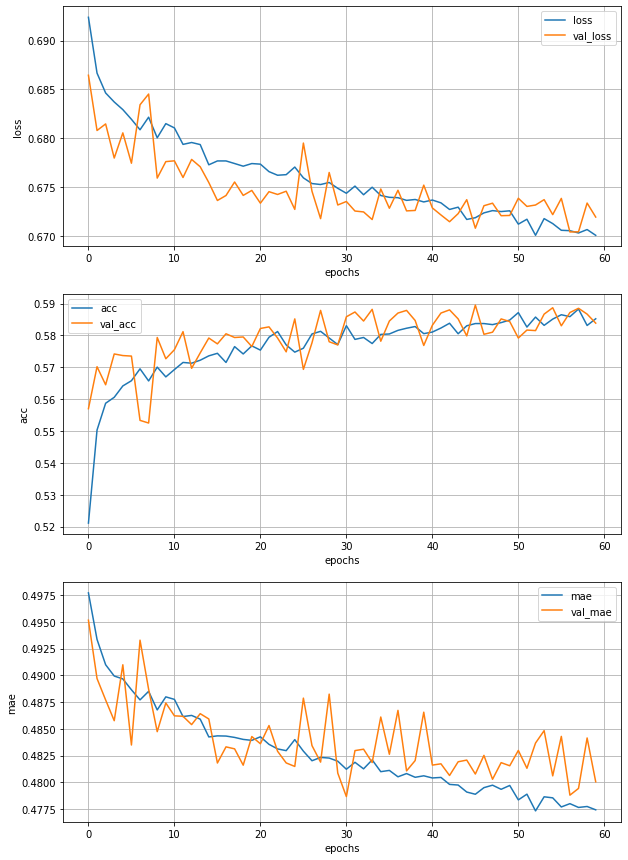

Epoch 61/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6693 - acc: 0.5875 - mae: 0.4763 - val_loss: 0.6744 - val_acc: 0.5849 - val_mae: 0.4842


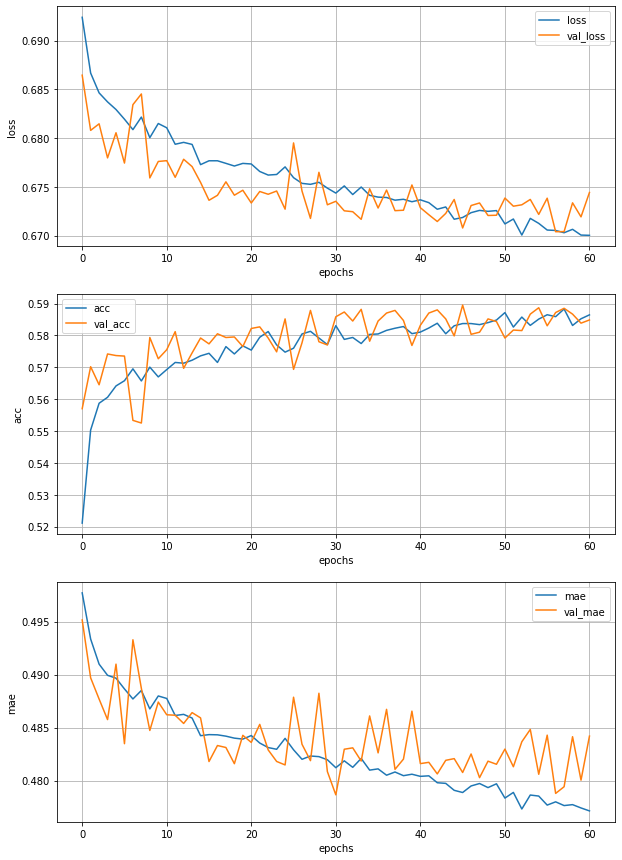

Epoch 62/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6690 - acc: 0.5883 - mae: 0.4769 - val_loss: 0.6755 - val_acc: 0.5725 - val_mae: 0.4832


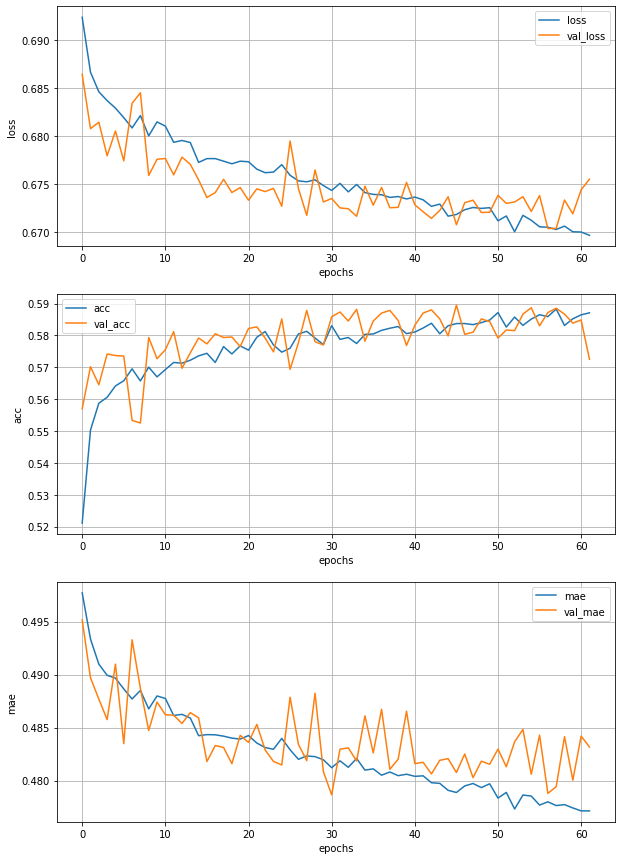

Epoch 63/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6699 - acc: 0.5847 - mae: 0.4772 - val_loss: 0.6727 - val_acc: 0.5820 - val_mae: 0.4817


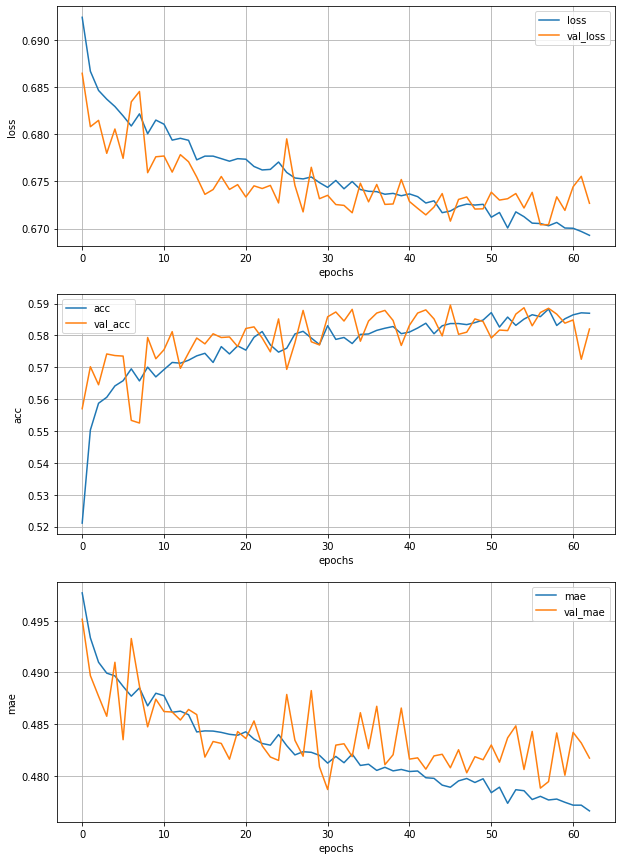

Epoch 64/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6694 - acc: 0.5845 - mae: 0.4771 - val_loss: 0.6737 - val_acc: 0.5789 - val_mae: 0.4817


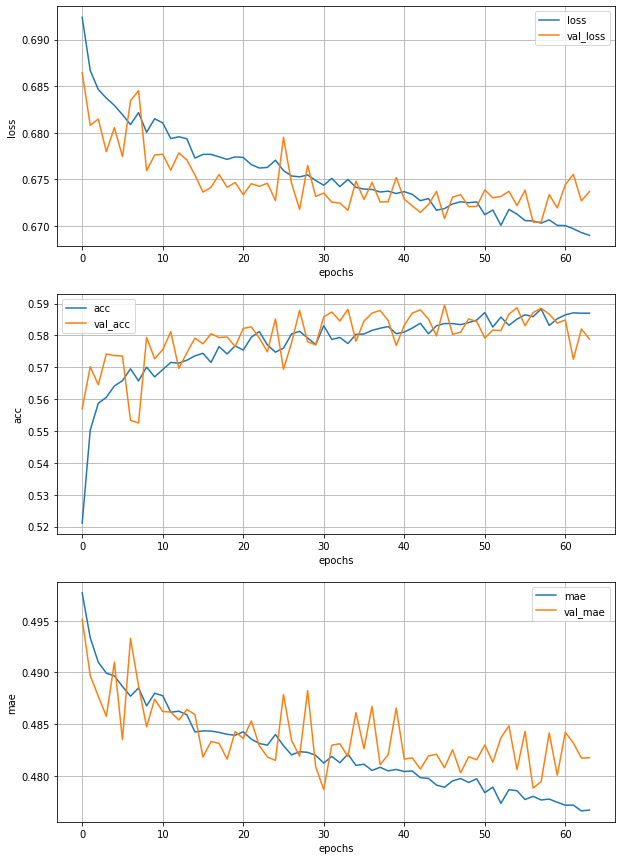

Epoch 65/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6693 - acc: 0.5875 - mae: 0.4764 - val_loss: 0.6742 - val_acc: 0.5834 - val_mae: 0.4823


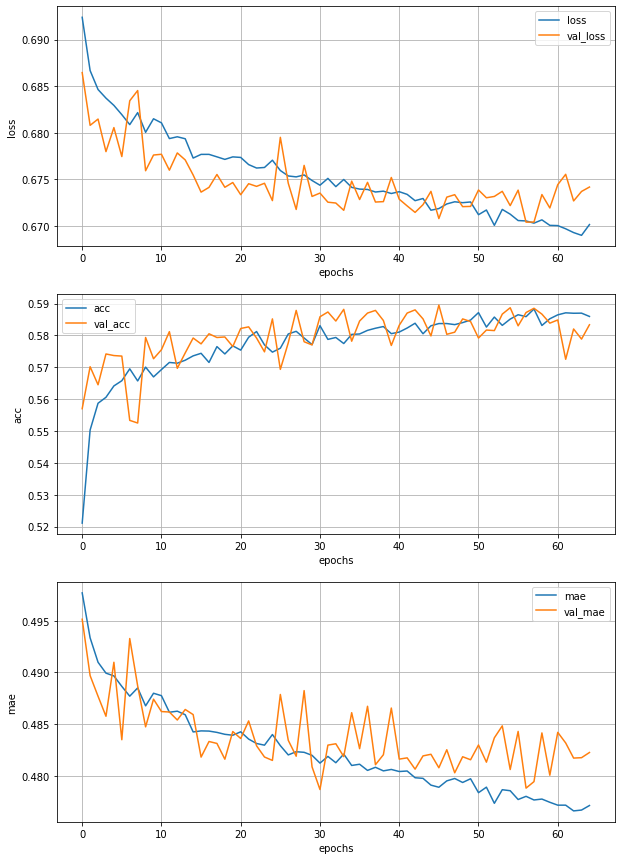

Epoch 66/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6670 - acc: 0.5935 - mae: 0.4749 - val_loss: 0.6729 - val_acc: 0.5835 - val_mae: 0.4830


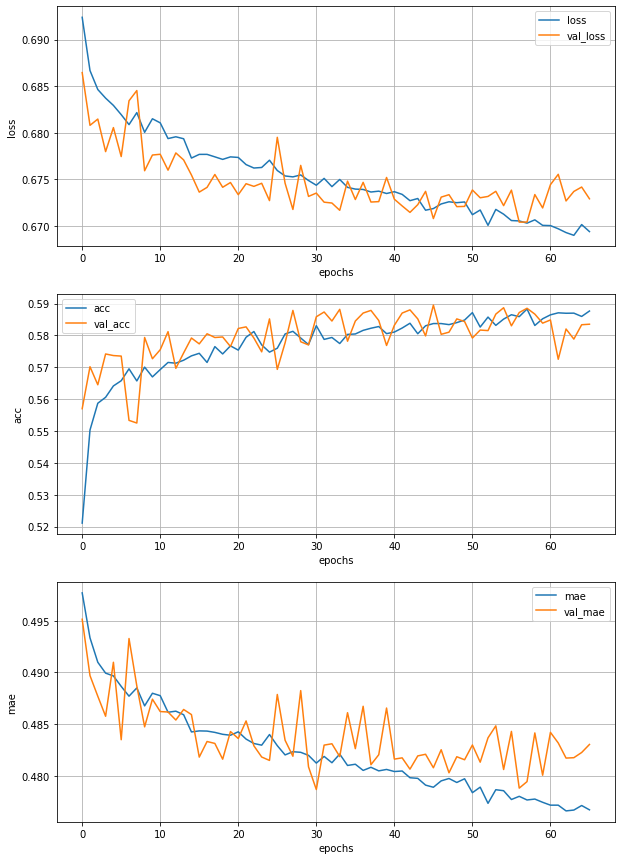

Epoch 67/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6666 - acc: 0.5907 - mae: 0.4748 - val_loss: 0.6746 - val_acc: 0.5815 - val_mae: 0.4852


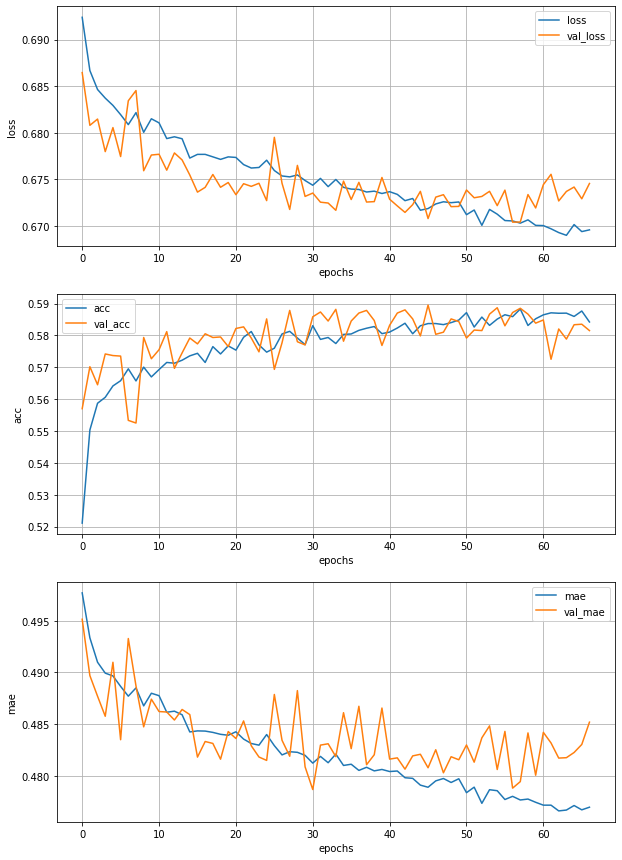

Epoch 68/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6710 - acc: 0.5826 - mae: 0.4789 - val_loss: 0.6709 - val_acc: 0.5865 - val_mae: 0.4774


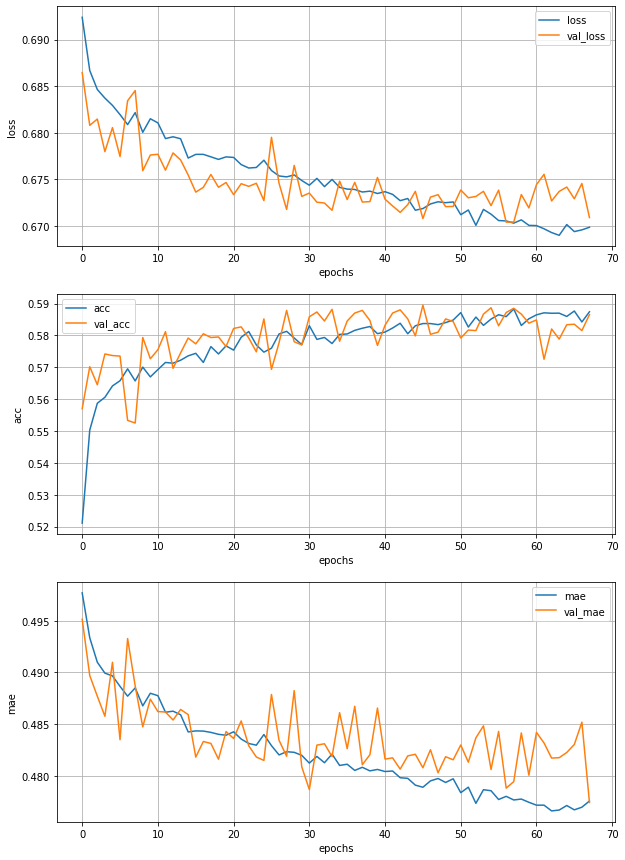

Epoch 69/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6693 - acc: 0.5864 - mae: 0.4763 - val_loss: 0.6733 - val_acc: 0.5825 - val_mae: 0.4834


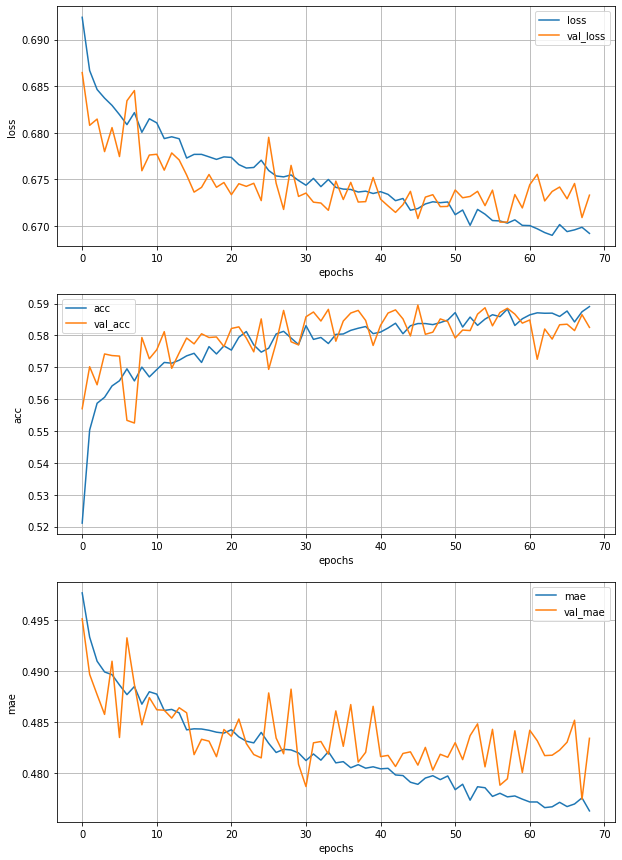

Epoch 70/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6682 - acc: 0.5853 - mae: 0.4764 - val_loss: 0.6731 - val_acc: 0.5850 - val_mae: 0.4844


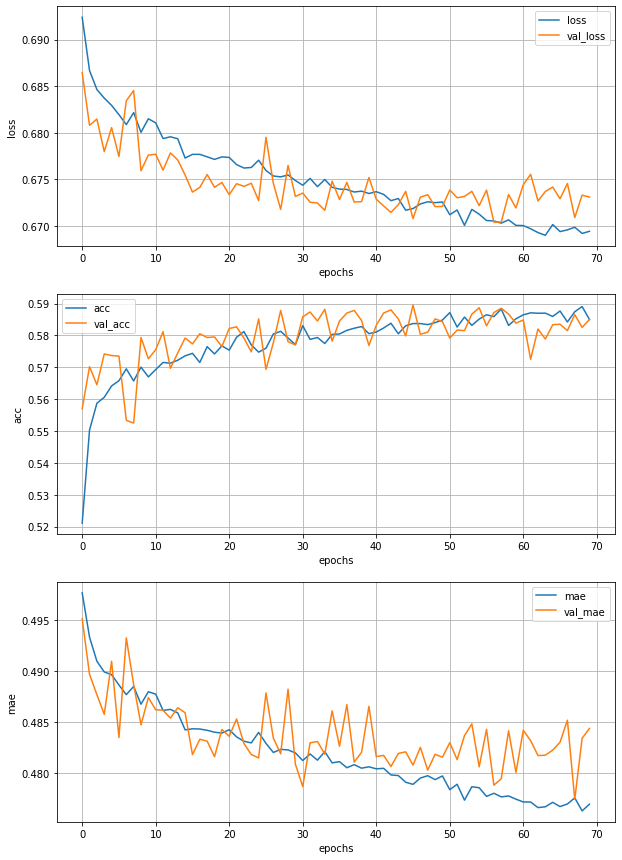

Epoch 71/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6702 - acc: 0.5835 - mae: 0.4785 - val_loss: 0.6744 - val_acc: 0.5834 - val_mae: 0.4770


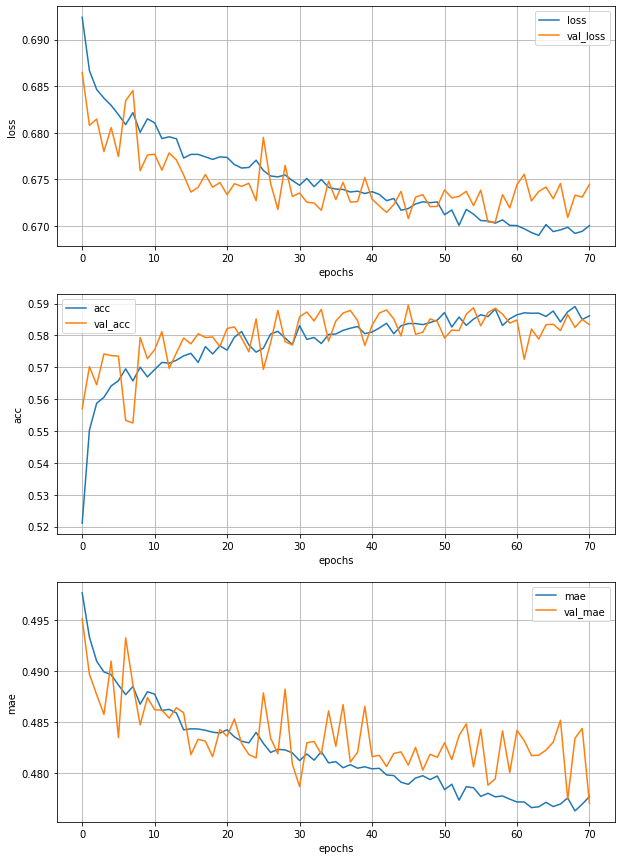

Epoch 72/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6674 - acc: 0.5901 - mae: 0.4744 - val_loss: 0.6732 - val_acc: 0.5814 - val_mae: 0.4795


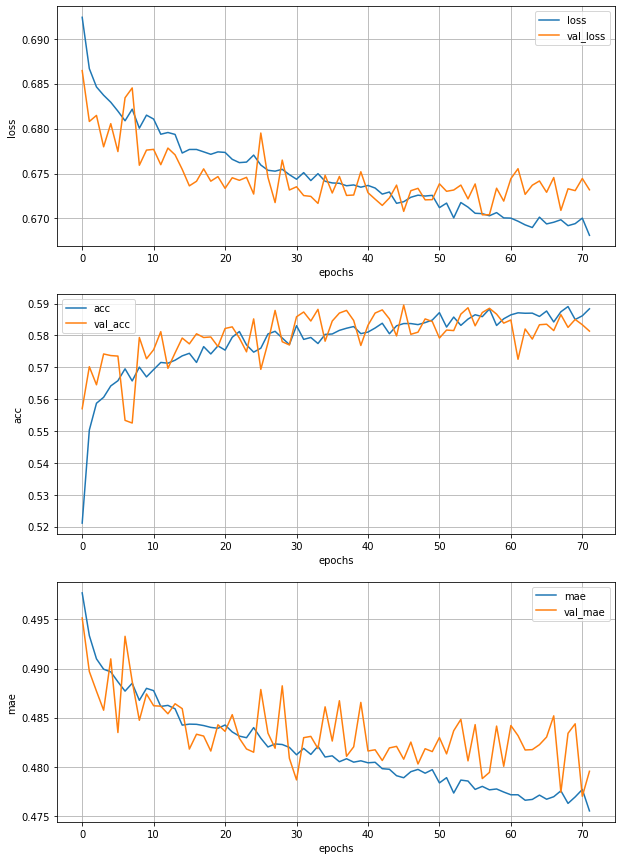

Epoch 73/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6702 - acc: 0.5839 - mae: 0.4780 - val_loss: 0.6733 - val_acc: 0.5847 - val_mae: 0.4813


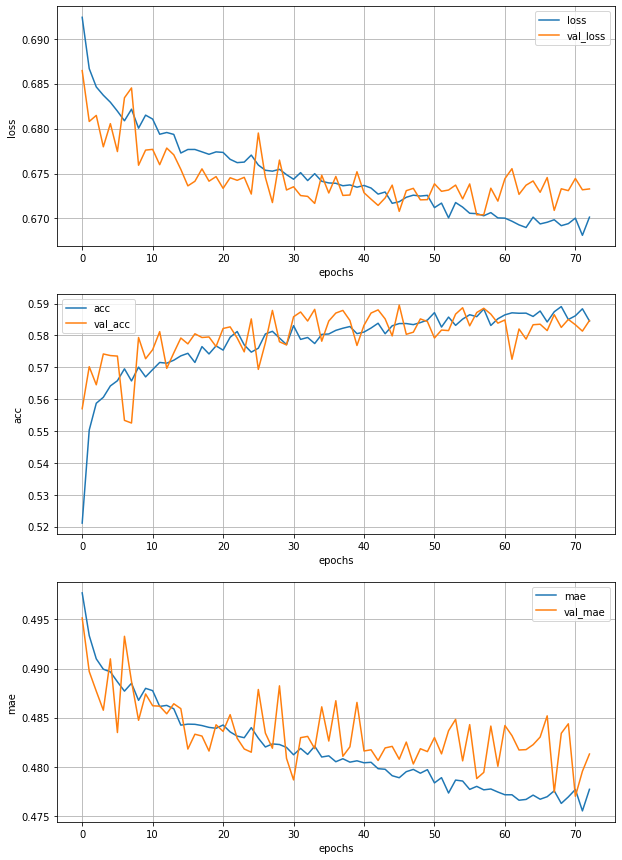

Epoch 74/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6693 - acc: 0.5872 - mae: 0.4768 - val_loss: 0.6733 - val_acc: 0.5857 - val_mae: 0.4826


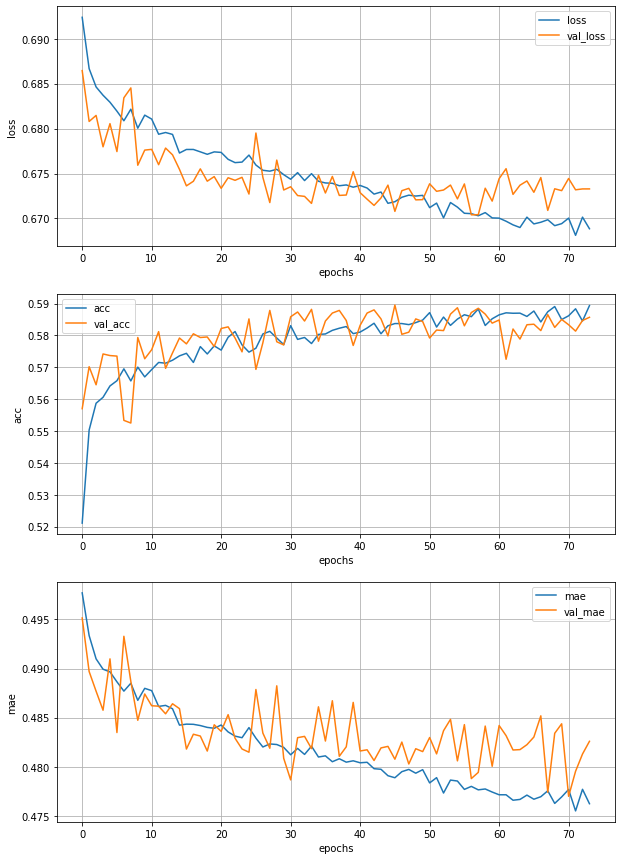

Epoch 75/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6671 - acc: 0.5902 - mae: 0.4754 - val_loss: 0.6751 - val_acc: 0.5739 - val_mae: 0.4817


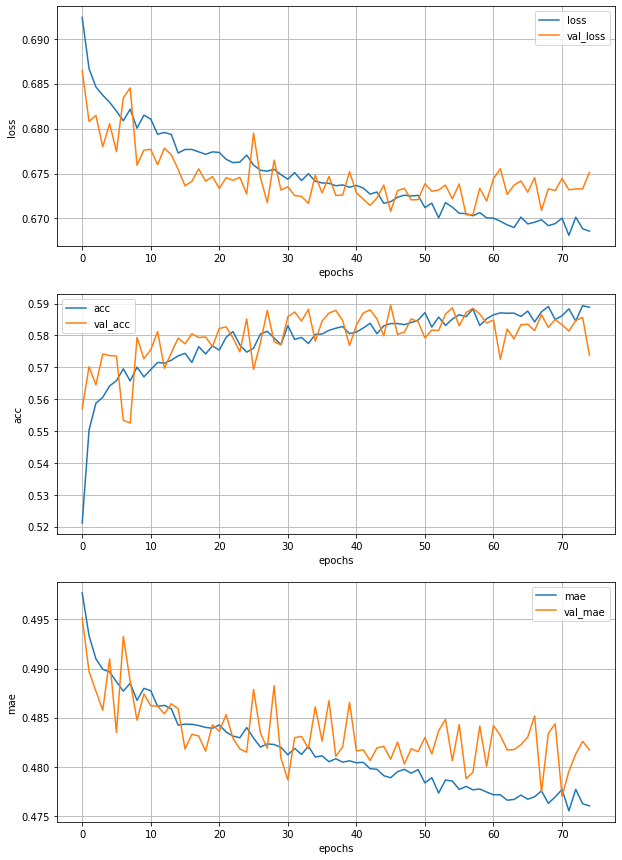

Epoch 76/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6689 - acc: 0.5853 - mae: 0.4765 - val_loss: 0.6710 - val_acc: 0.5842 - val_mae: 0.4803


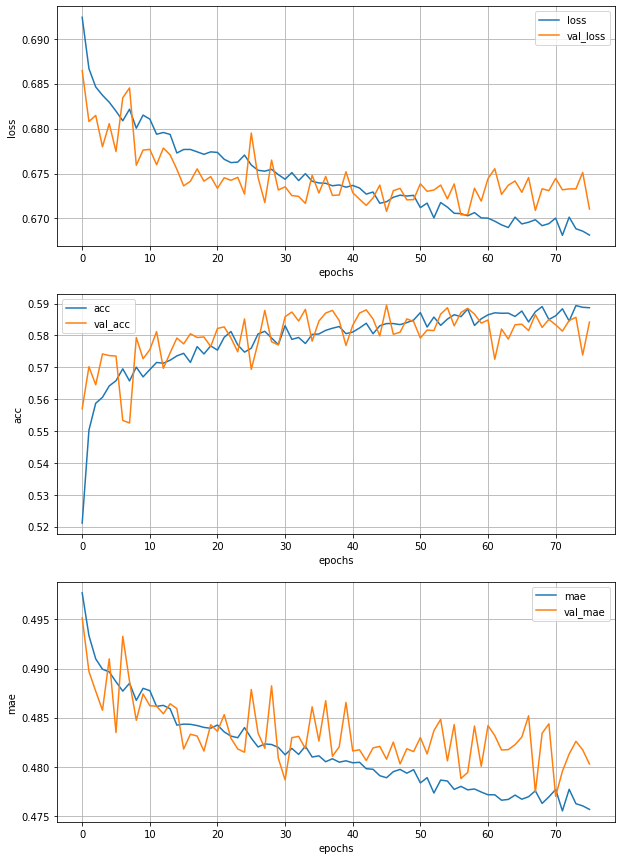

Epoch 77/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6673 - acc: 0.5897 - mae: 0.4749 - val_loss: 0.6738 - val_acc: 0.5804 - val_mae: 0.4811


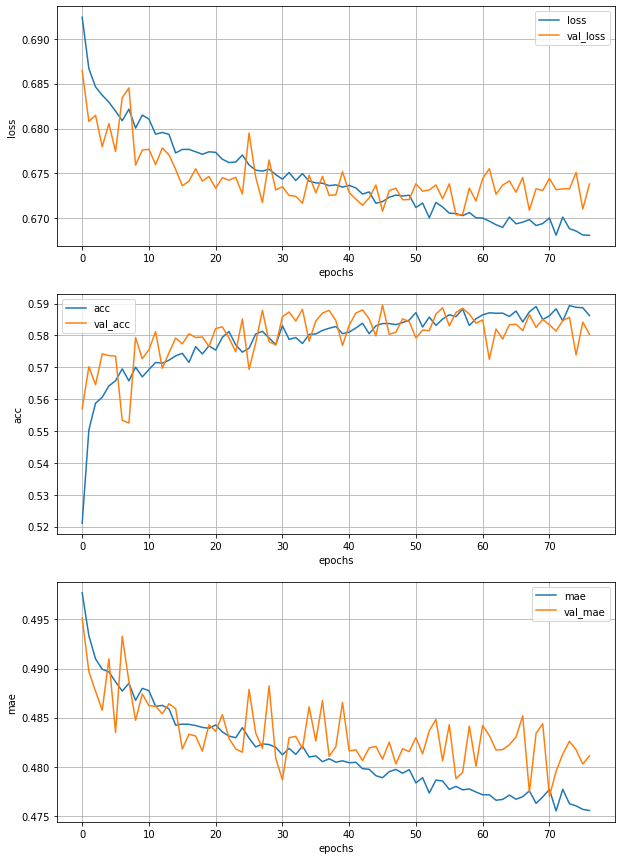

Epoch 78/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6702 - acc: 0.5865 - mae: 0.4771 - val_loss: 0.6723 - val_acc: 0.5817 - val_mae: 0.4806


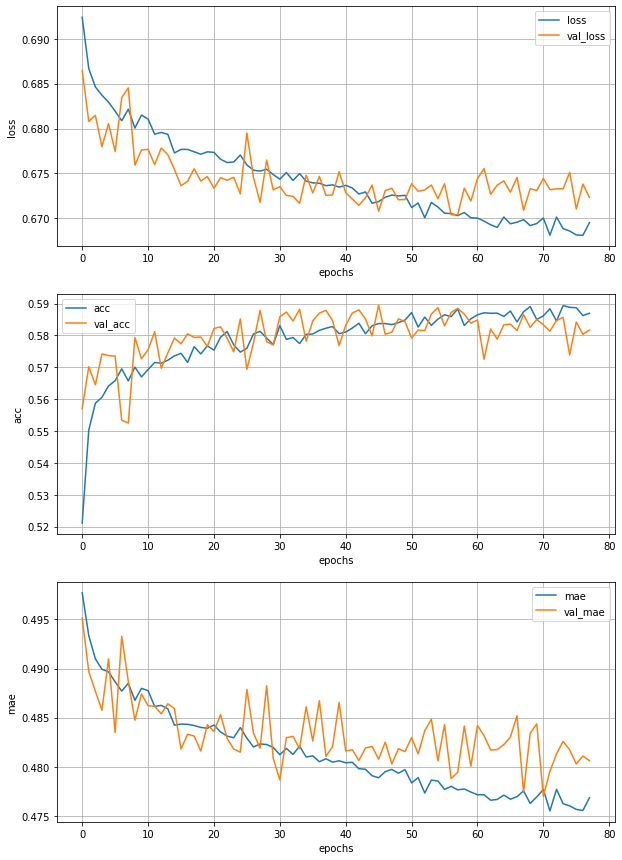

Epoch 79/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6677 - acc: 0.5867 - mae: 0.4761 - val_loss: 0.6723 - val_acc: 0.5859 - val_mae: 0.4810


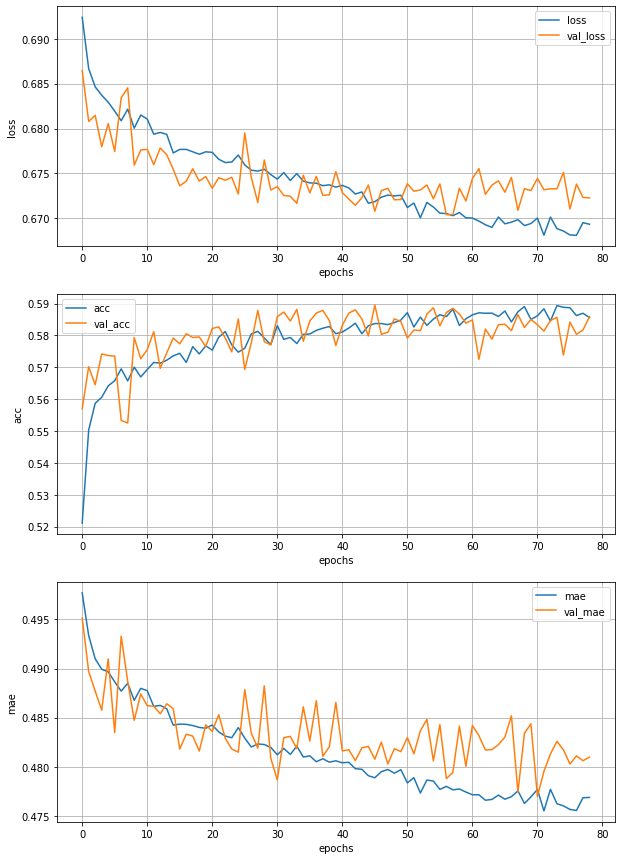

Epoch 80/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6668 - acc: 0.5870 - mae: 0.4747 - val_loss: 0.6736 - val_acc: 0.5825 - val_mae: 0.4828


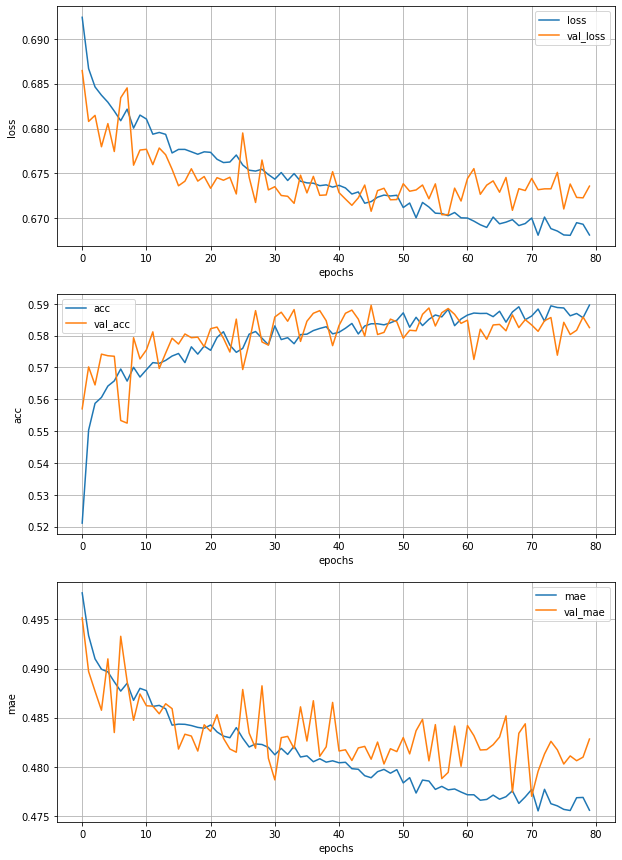

Epoch 81/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6696 - acc: 0.5876 - mae: 0.4777 - val_loss: 0.6719 - val_acc: 0.5840 - val_mae: 0.4795


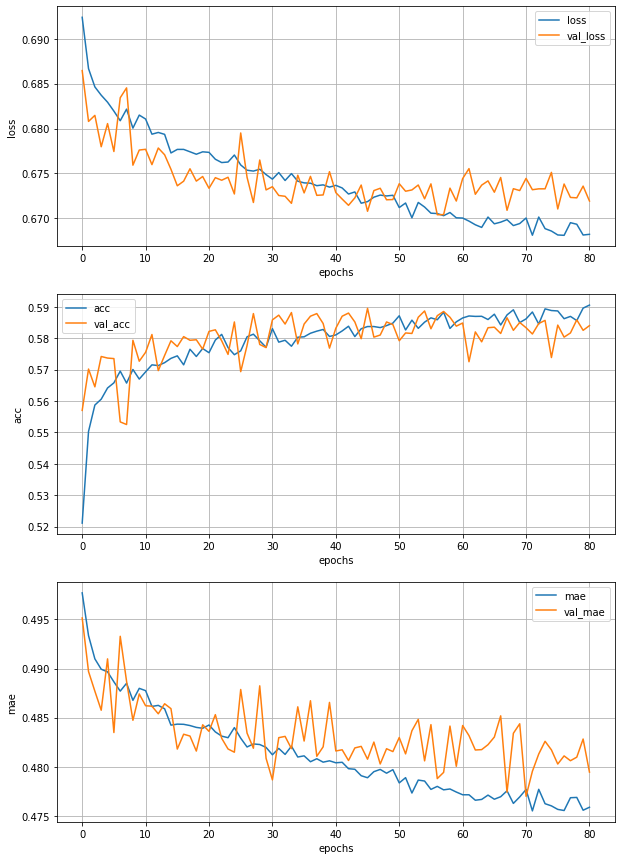

Epoch 82/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6677 - acc: 0.5847 - mae: 0.4753 - val_loss: 0.6720 - val_acc: 0.5840 - val_mae: 0.4821


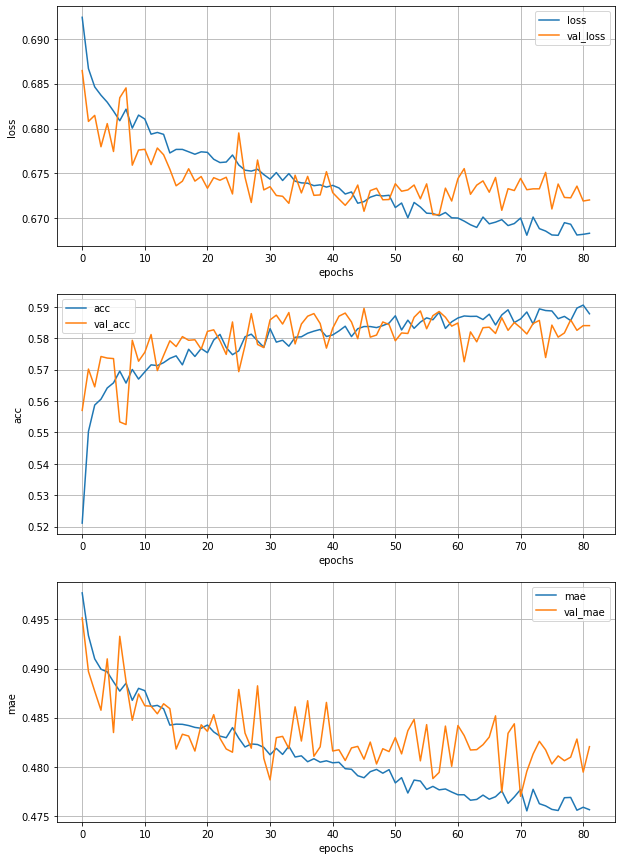

Epoch 83/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6674 - acc: 0.5920 - mae: 0.4756 - val_loss: 0.6750 - val_acc: 0.5839 - val_mae: 0.4821


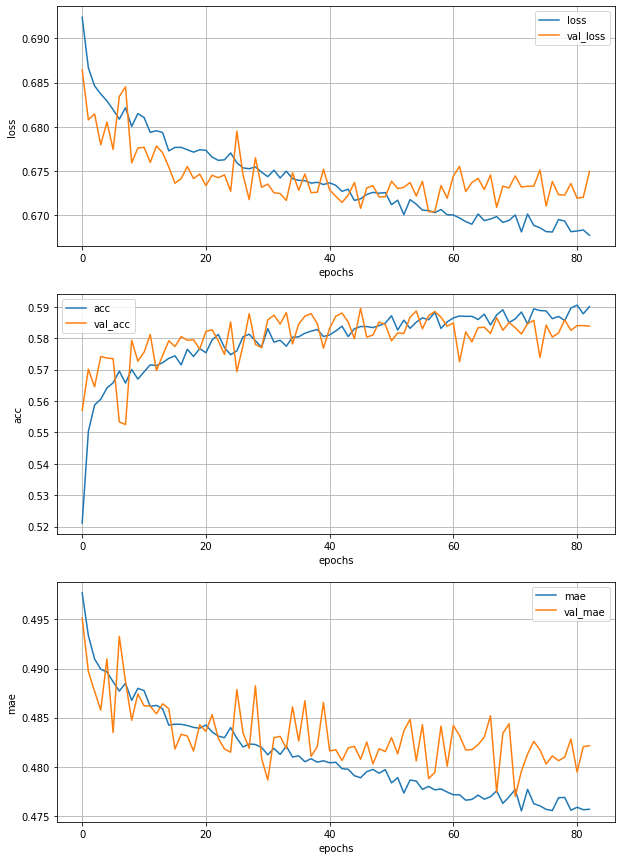

Epoch 84/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6682 - acc: 0.5829 - mae: 0.4755 - val_loss: 0.6741 - val_acc: 0.5820 - val_mae: 0.4829


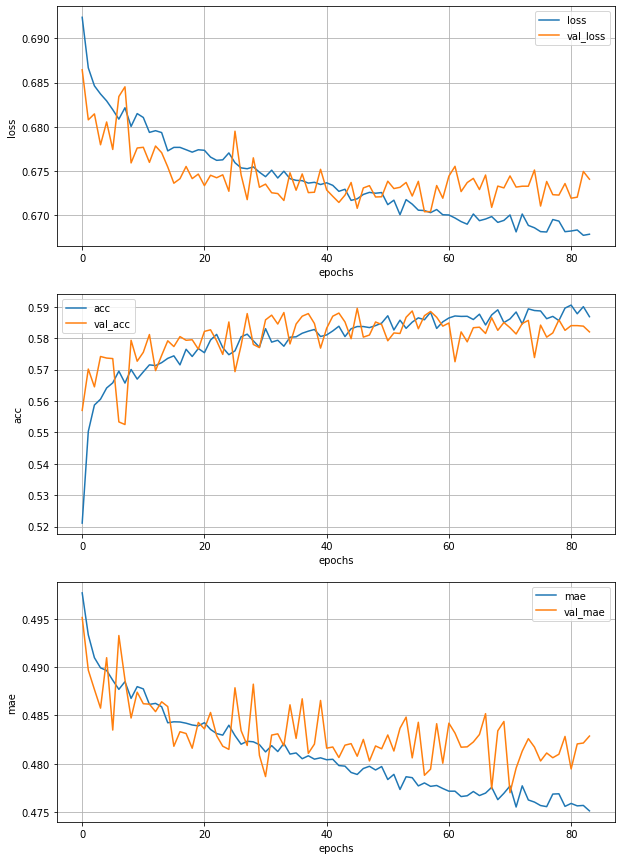

Epoch 85/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6688 - acc: 0.5887 - mae: 0.4764 - val_loss: 0.6742 - val_acc: 0.5755 - val_mae: 0.4810


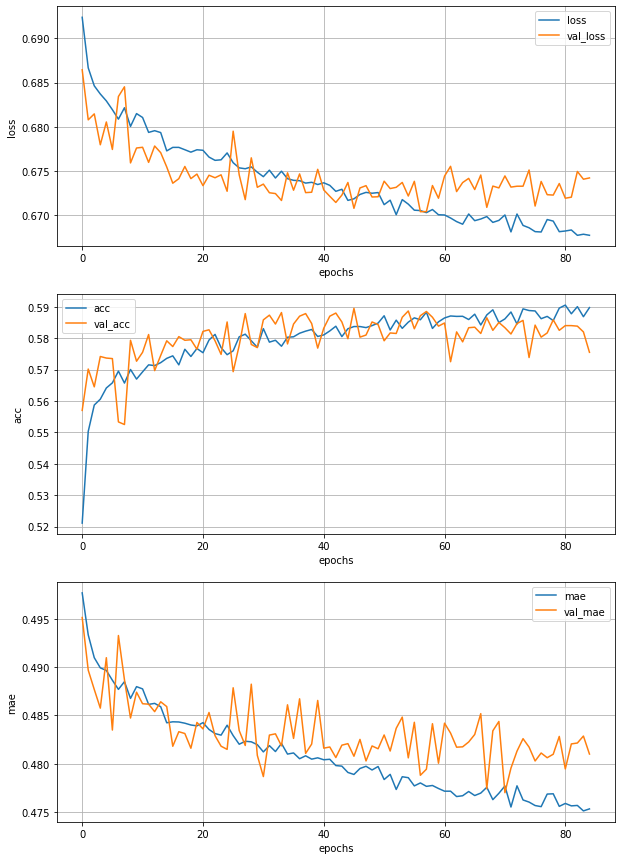

Epoch 86/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6666 - acc: 0.5907 - mae: 0.4741 - val_loss: 0.6767 - val_acc: 0.5810 - val_mae: 0.4798


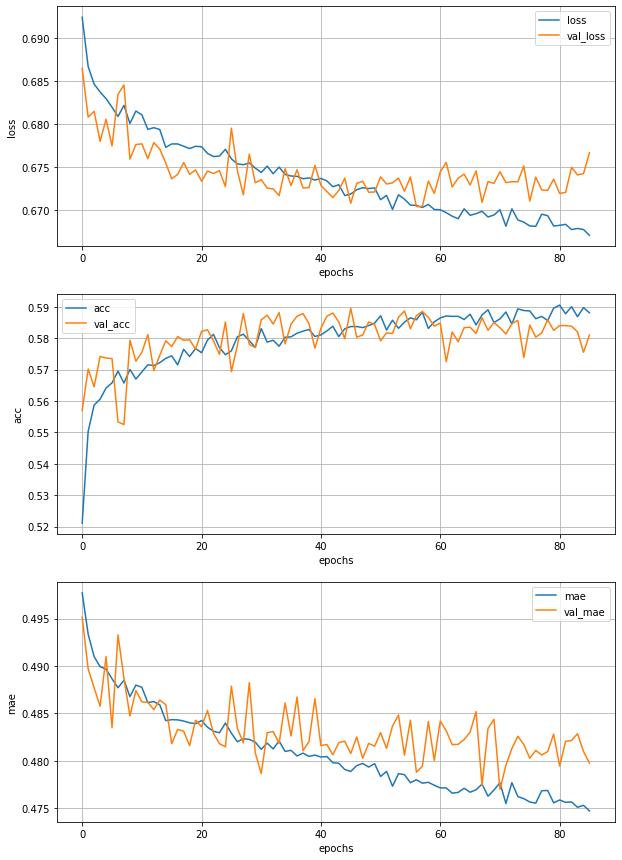

Epoch 87/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6672 - acc: 0.5941 - mae: 0.4739 - val_loss: 0.6744 - val_acc: 0.5859 - val_mae: 0.4808


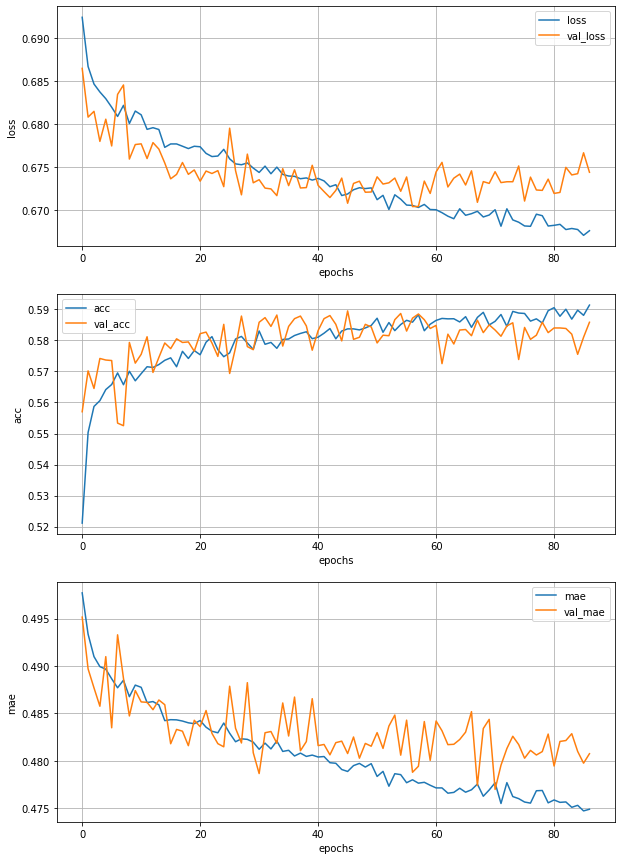

Epoch 88/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6662 - acc: 0.5870 - mae: 0.4741 - val_loss: 0.6777 - val_acc: 0.5752 - val_mae: 0.4815


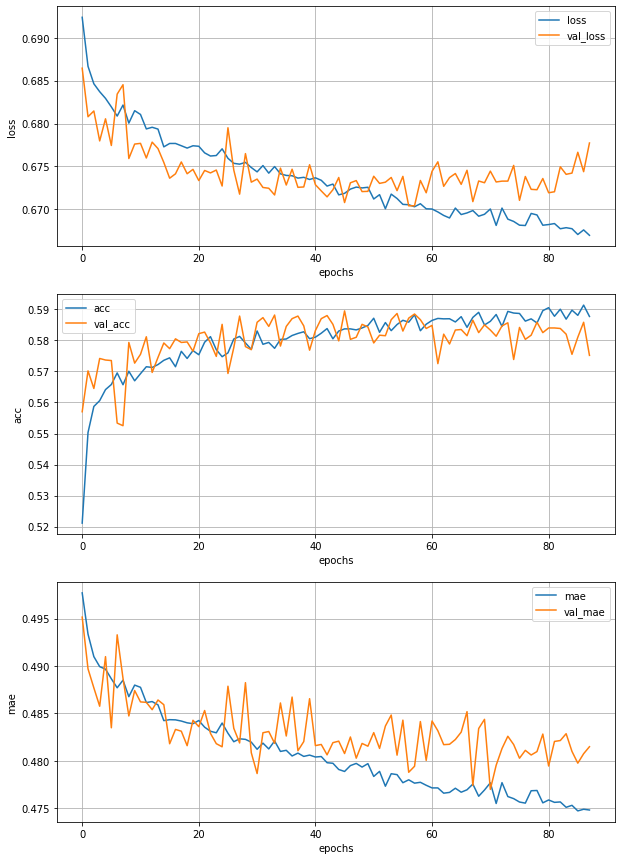

Epoch 89/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6679 - acc: 0.5876 - mae: 0.4753 - val_loss: 0.6744 - val_acc: 0.5750 - val_mae: 0.4827


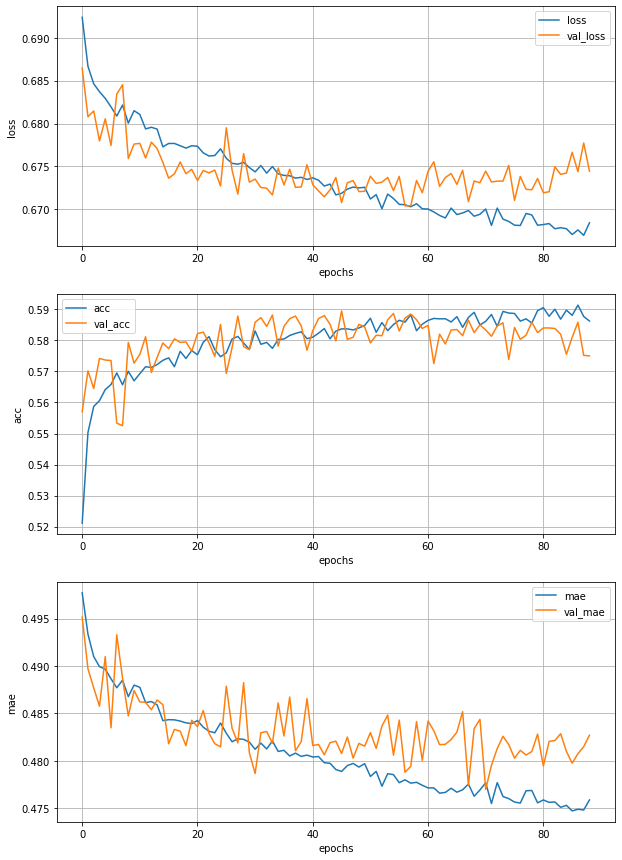

Epoch 90/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6677 - acc: 0.5888 - mae: 0.4758 - val_loss: 0.6733 - val_acc: 0.5860 - val_mae: 0.4804


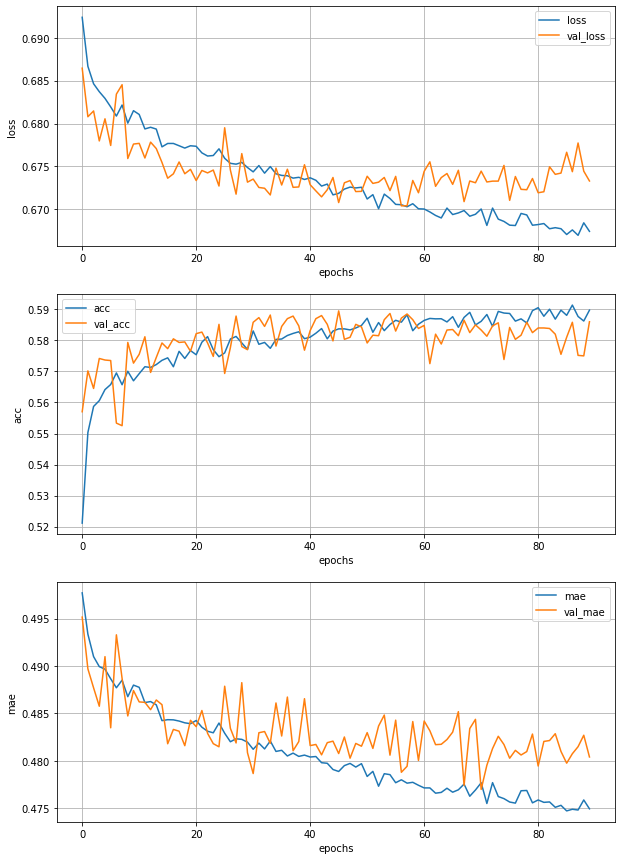

Epoch 91/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6674 - acc: 0.5920 - mae: 0.4751 - val_loss: 0.6730 - val_acc: 0.5864 - val_mae: 0.4801


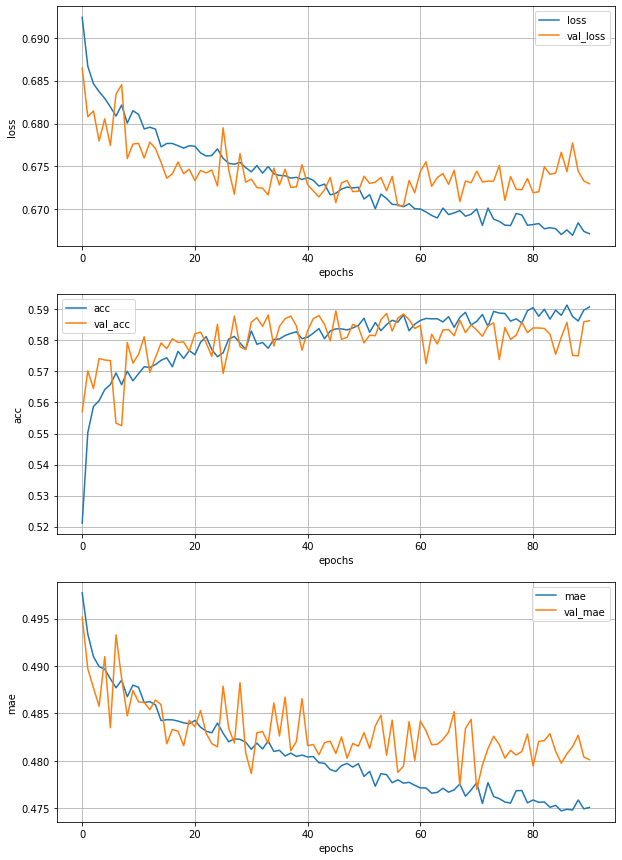

Epoch 92/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6672 - acc: 0.5921 - mae: 0.4748 - val_loss: 0.6723 - val_acc: 0.5867 - val_mae: 0.4770


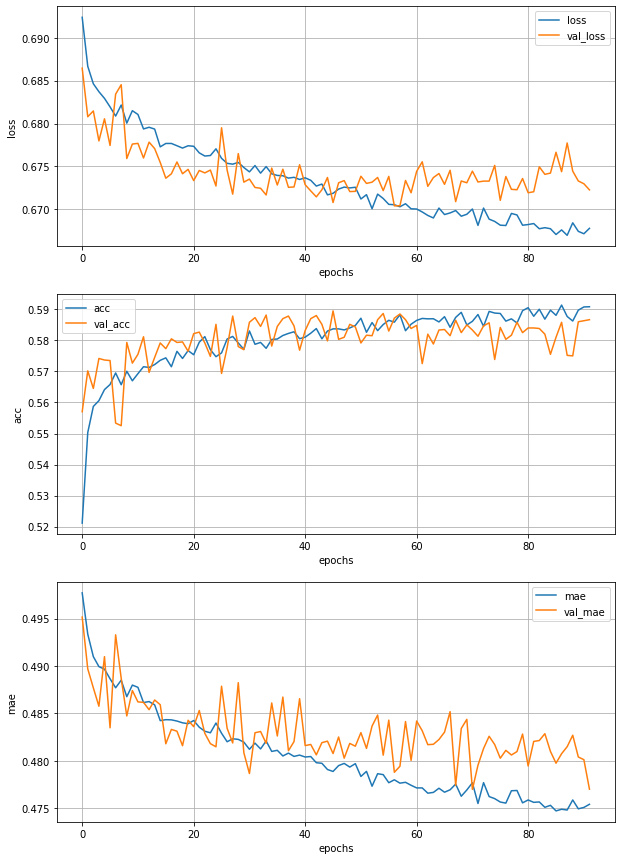

Epoch 93/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6683 - acc: 0.5819 - mae: 0.4748 - val_loss: 0.6738 - val_acc: 0.5877 - val_mae: 0.4834


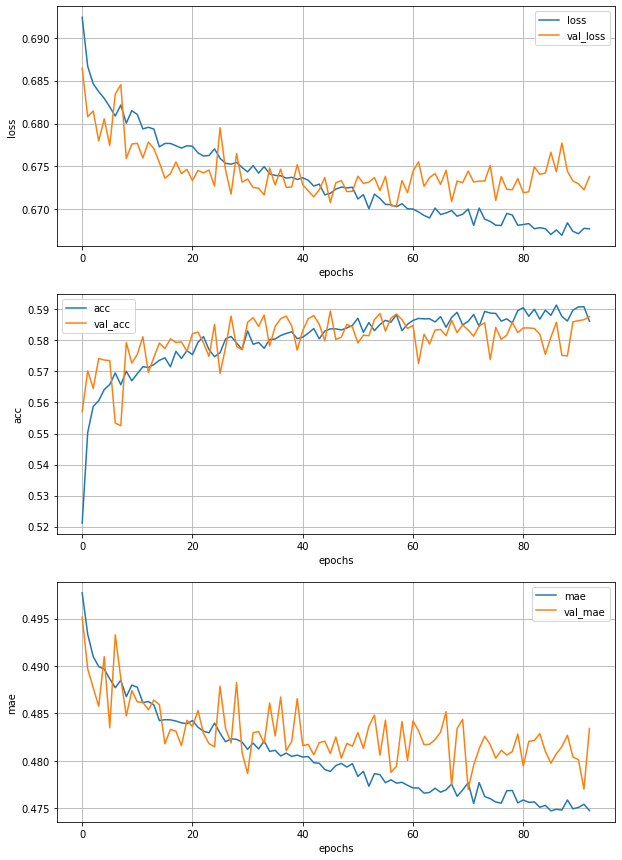

Epoch 94/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6660 - acc: 0.5892 - mae: 0.4747 - val_loss: 0.6760 - val_acc: 0.5824 - val_mae: 0.4837


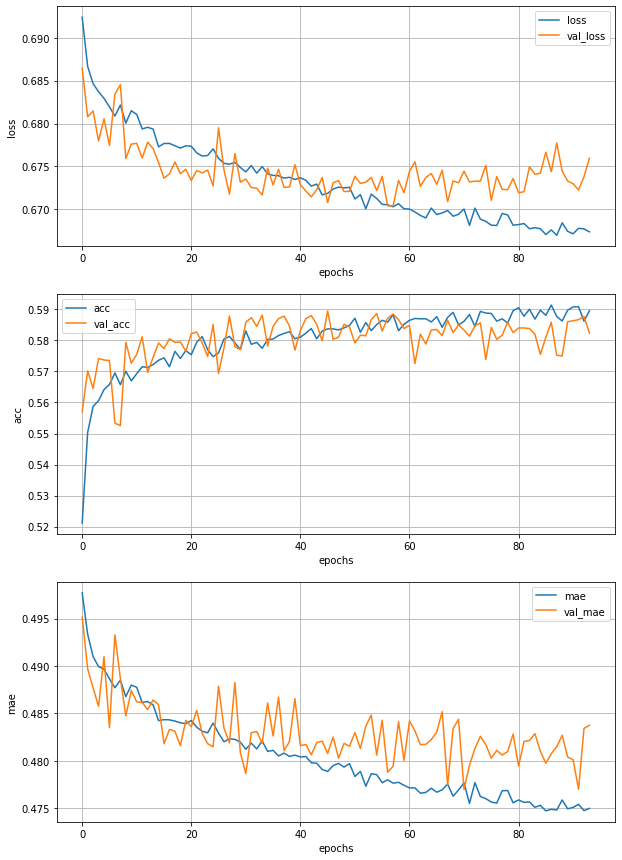

Epoch 95/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6671 - acc: 0.5874 - mae: 0.4755 - val_loss: 0.6730 - val_acc: 0.5820 - val_mae: 0.4806


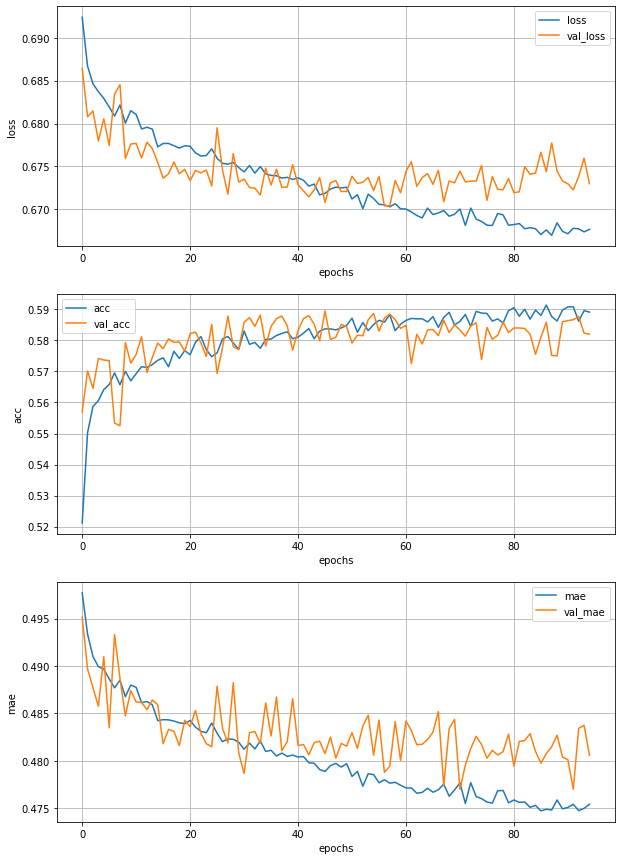

Epoch 96/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6684 - acc: 0.5839 - mae: 0.4764 - val_loss: 0.6756 - val_acc: 0.5755 - val_mae: 0.4804


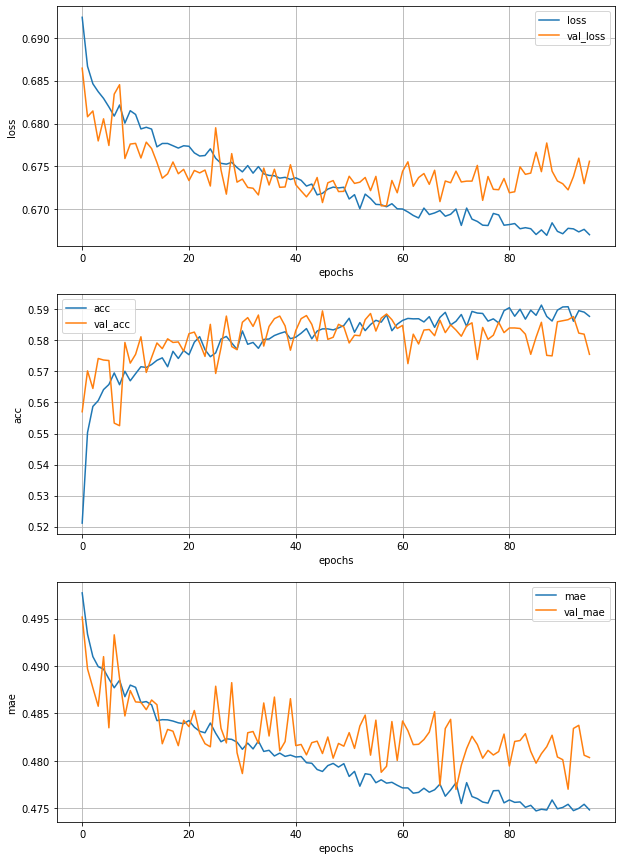

Epoch 97/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6695 - acc: 0.5846 - mae: 0.4763 - val_loss: 0.6810 - val_acc: 0.5749 - val_mae: 0.4769


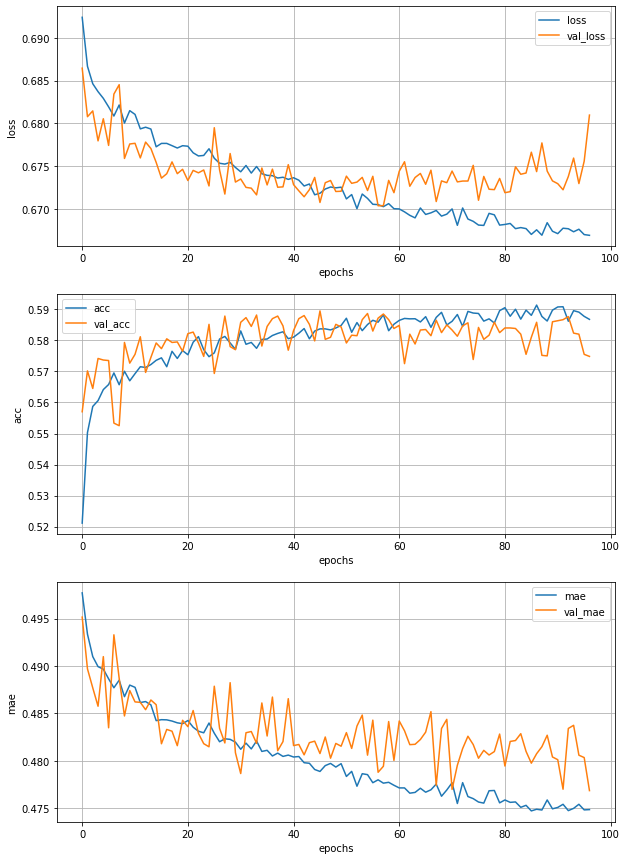

Epoch 98/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6706 - acc: 0.5880 - mae: 0.4760 - val_loss: 0.6762 - val_acc: 0.5845 - val_mae: 0.4772


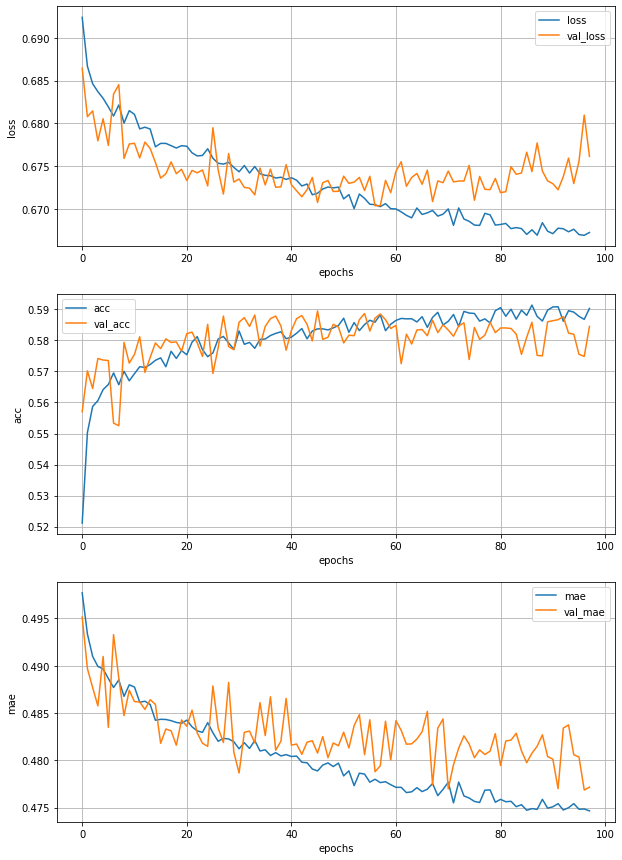

Epoch 99/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6671 - acc: 0.5867 - mae: 0.4743 - val_loss: 0.6724 - val_acc: 0.5832 - val_mae: 0.4784


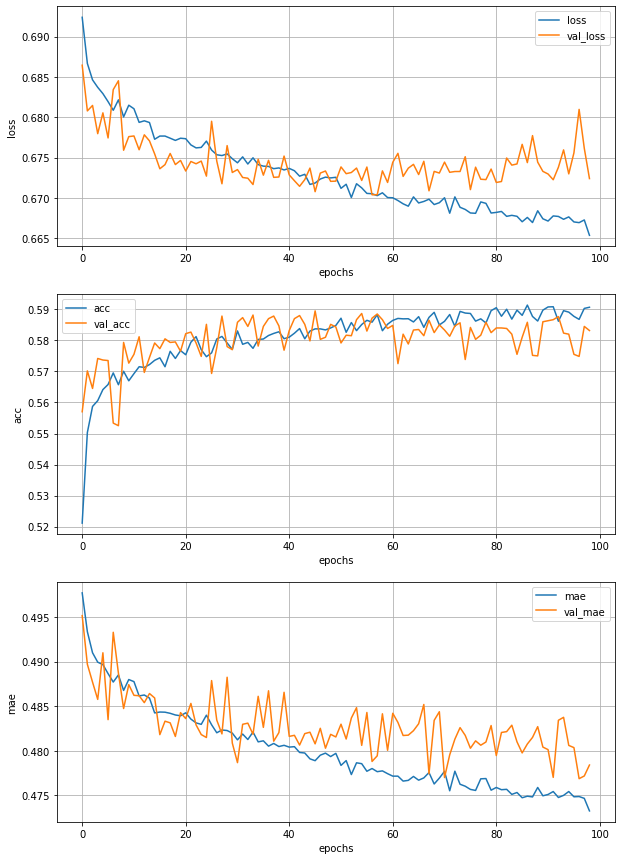

Epoch 100/150
938/938 [==============================] - 6s 6ms/step - loss: 0.6675 - acc: 0.5867 - mae: 0.4746 - val_loss: 0.6777 - val_acc: 0.5767 - val_mae: 0.4792


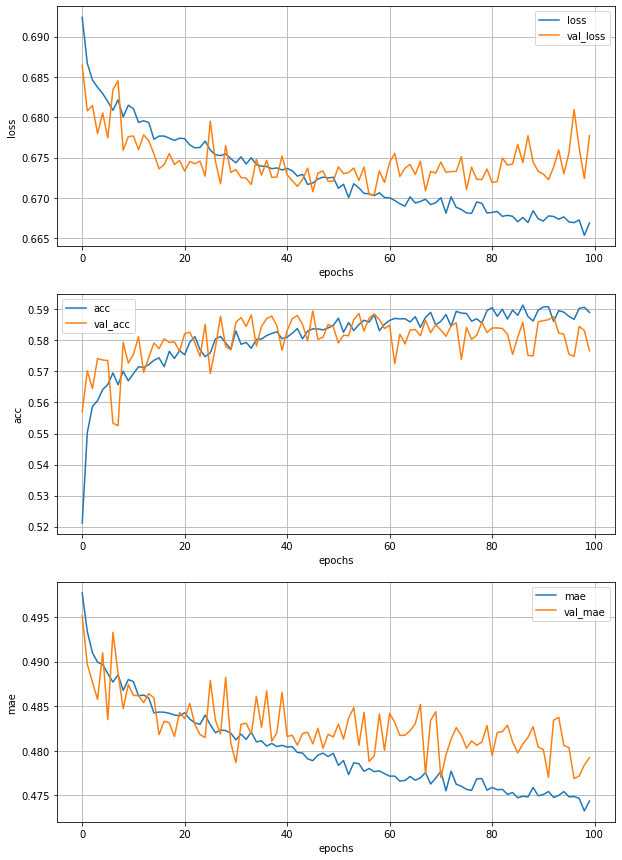

Epoch 101/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6651 - acc: 0.5932 - mae: 0.4725 - val_loss: 0.6760 - val_acc: 0.5842 - val_mae: 0.4803


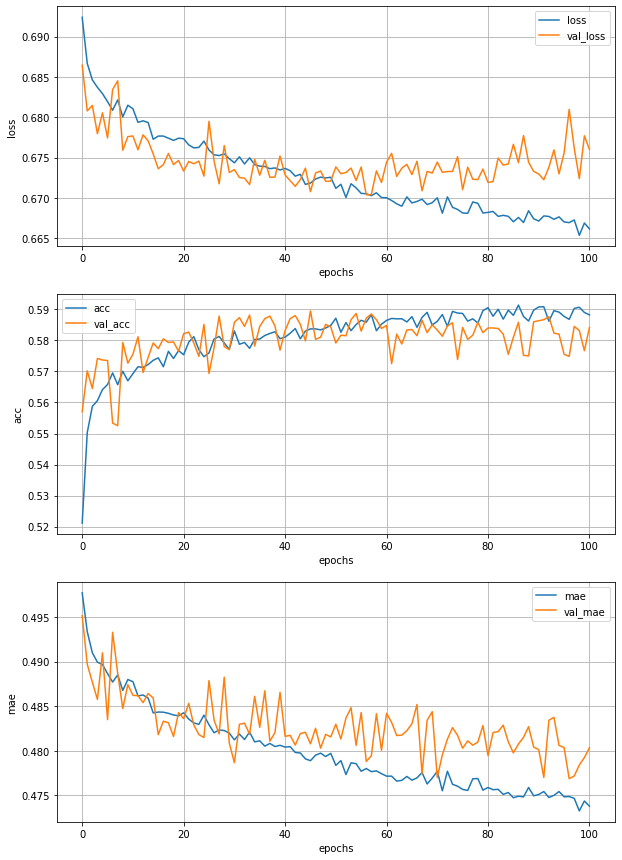

Epoch 102/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6641 - acc: 0.5911 - mae: 0.4723 - val_loss: 0.6731 - val_acc: 0.5815 - val_mae: 0.4794


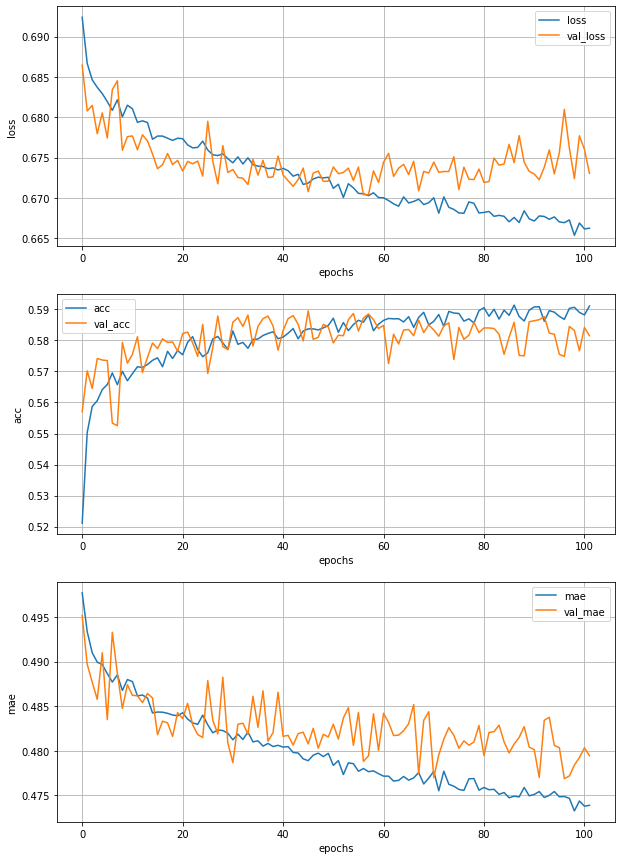

Epoch 103/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6667 - acc: 0.5900 - mae: 0.4746 - val_loss: 0.6748 - val_acc: 0.5857 - val_mae: 0.4831


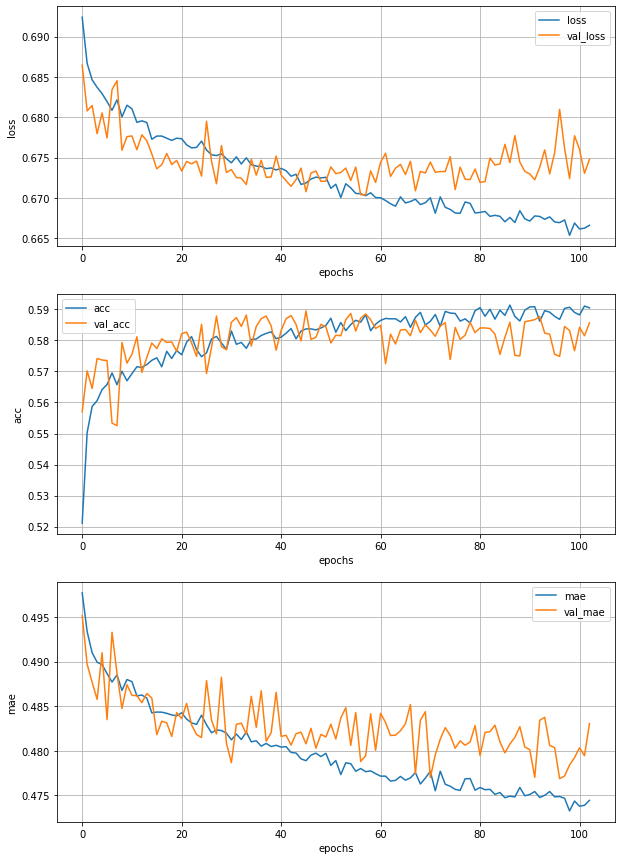

Epoch 104/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6645 - acc: 0.5930 - mae: 0.4729 - val_loss: 0.6734 - val_acc: 0.5875 - val_mae: 0.4818


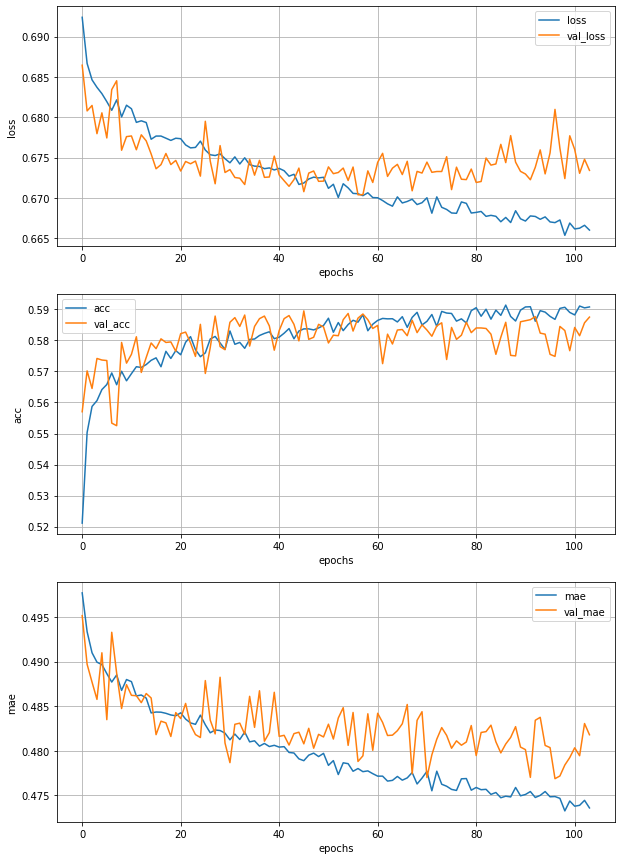

Epoch 105/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6672 - acc: 0.5836 - mae: 0.4753 - val_loss: 0.6724 - val_acc: 0.5895 - val_mae: 0.4779


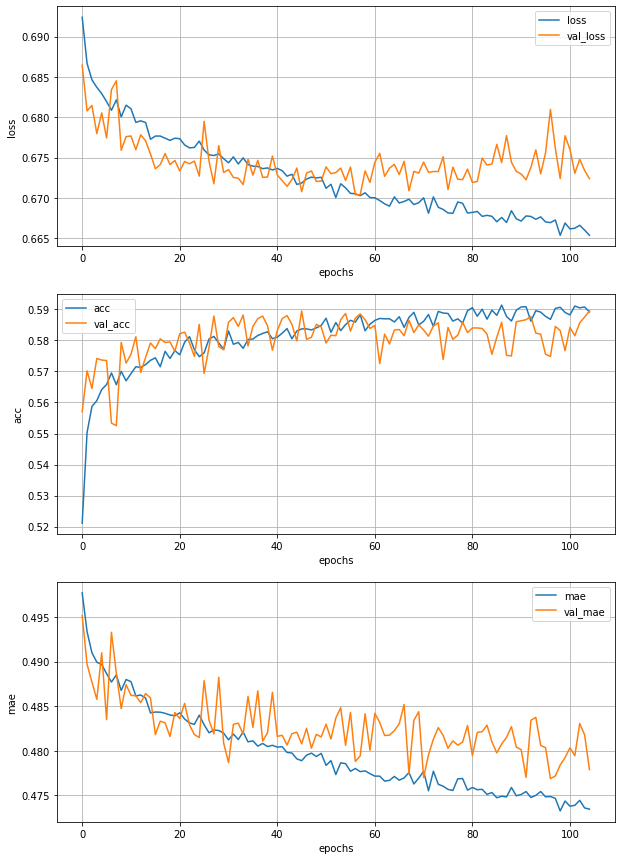

Epoch 106/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6648 - acc: 0.5935 - mae: 0.4719 - val_loss: 0.6752 - val_acc: 0.5802 - val_mae: 0.4833


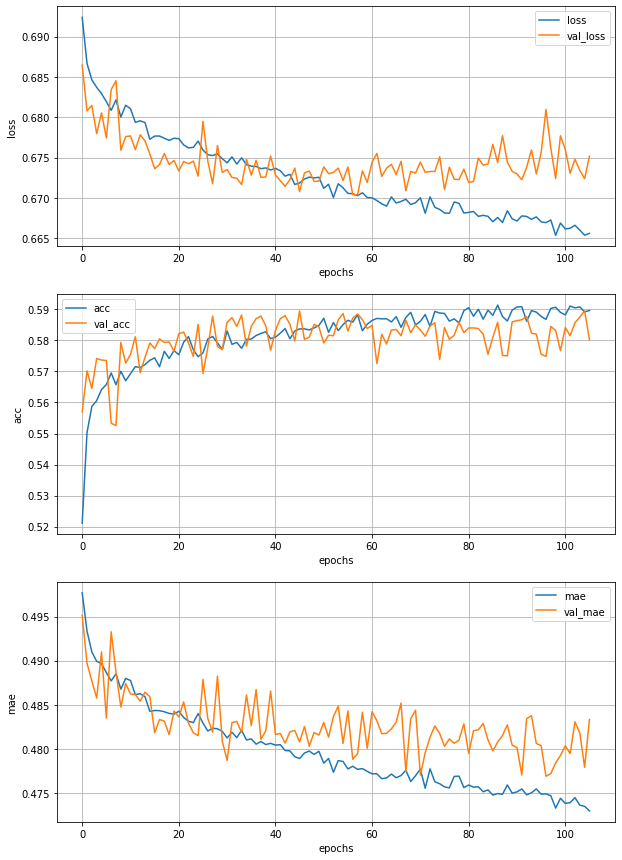

Epoch 107/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6630 - acc: 0.5957 - mae: 0.4721 - val_loss: 0.6762 - val_acc: 0.5795 - val_mae: 0.4787


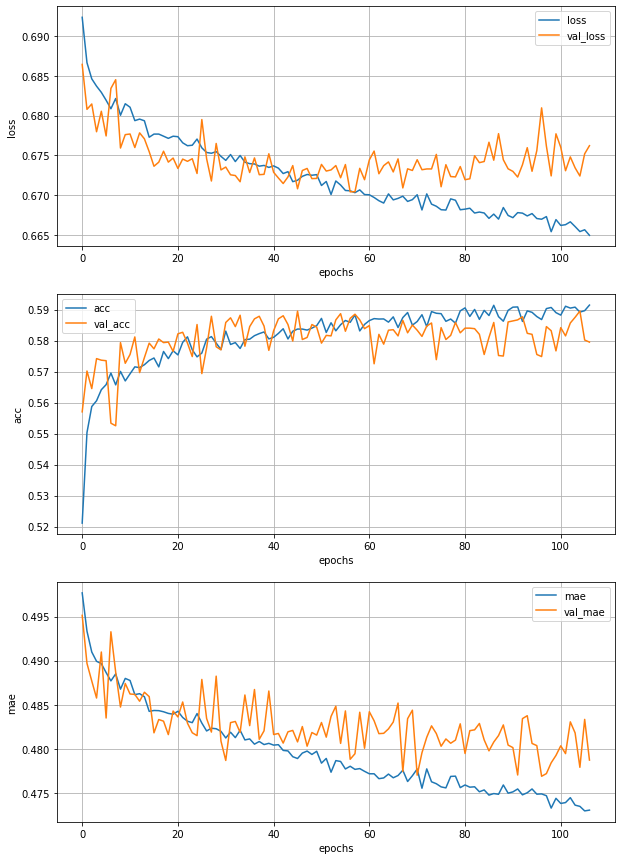

Epoch 108/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6684 - acc: 0.5811 - mae: 0.4759 - val_loss: 0.6728 - val_acc: 0.5849 - val_mae: 0.4794


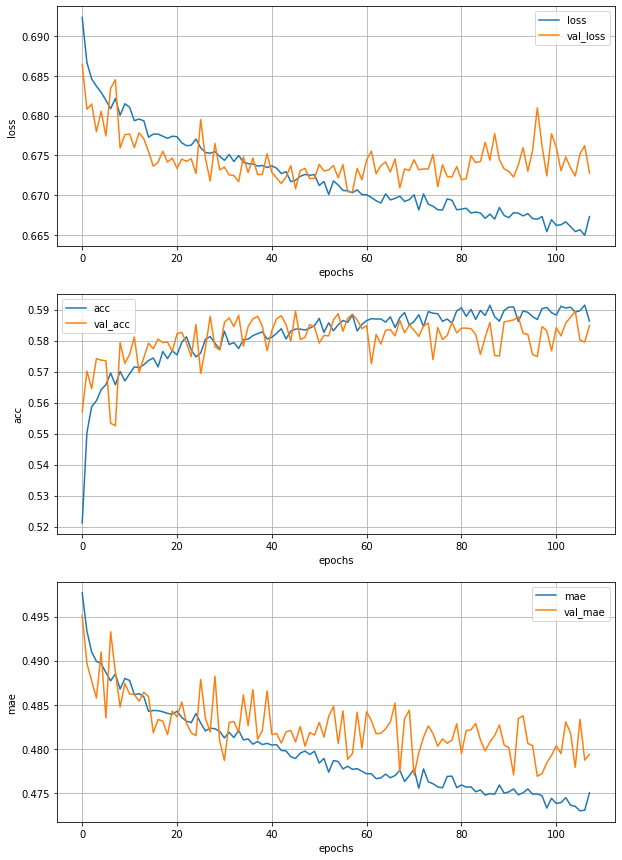

Epoch 109/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6649 - acc: 0.5978 - mae: 0.4725 - val_loss: 0.6743 - val_acc: 0.5849 - val_mae: 0.4811


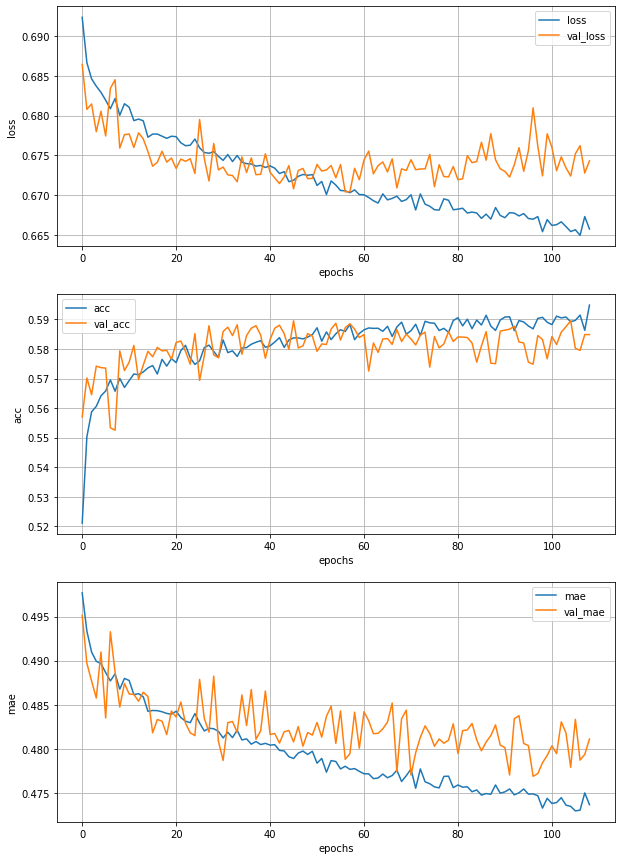

Epoch 110/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6664 - acc: 0.5924 - mae: 0.4745 - val_loss: 0.6753 - val_acc: 0.5810 - val_mae: 0.4833


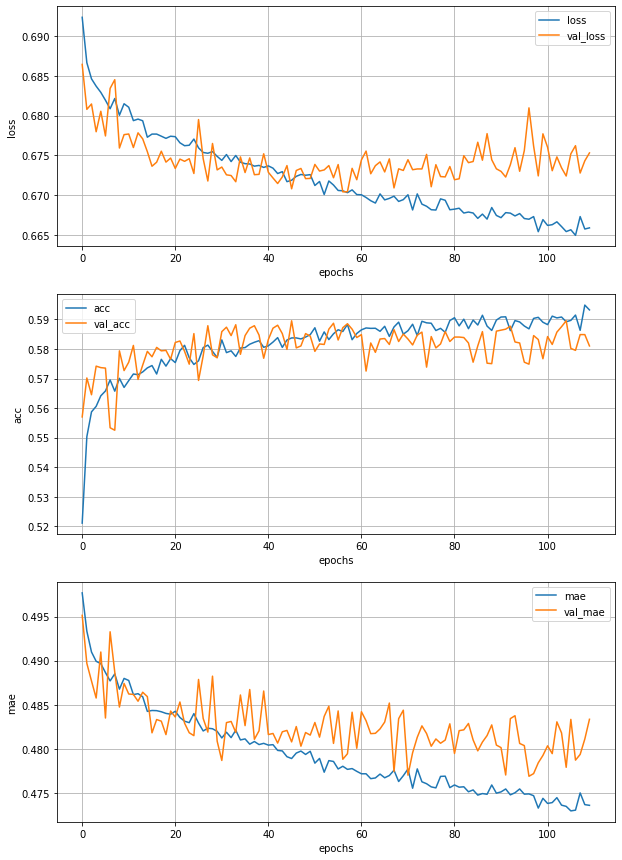

Epoch 111/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6633 - acc: 0.5956 - mae: 0.4720 - val_loss: 0.6758 - val_acc: 0.5817 - val_mae: 0.4825


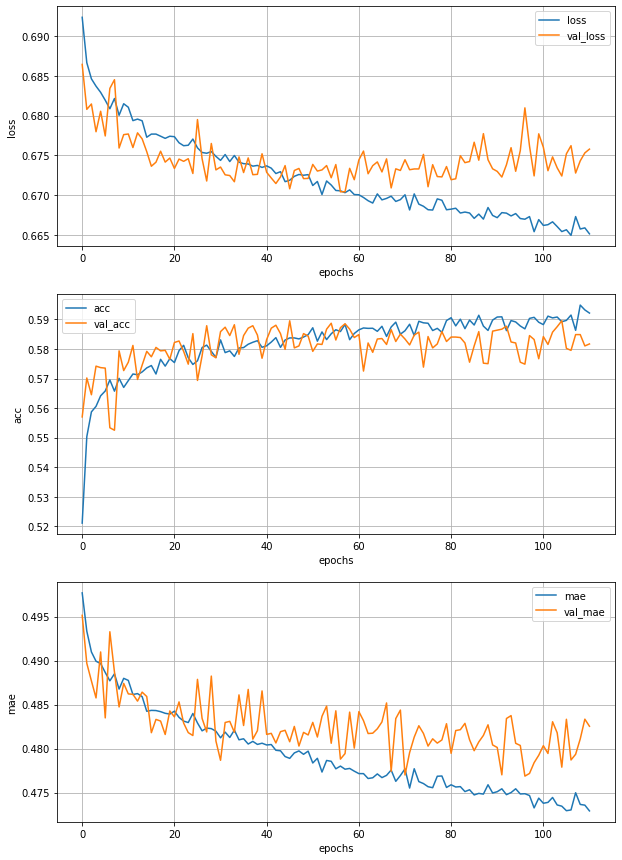

Epoch 112/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6651 - acc: 0.5896 - mae: 0.4735 - val_loss: 0.6754 - val_acc: 0.5845 - val_mae: 0.4806


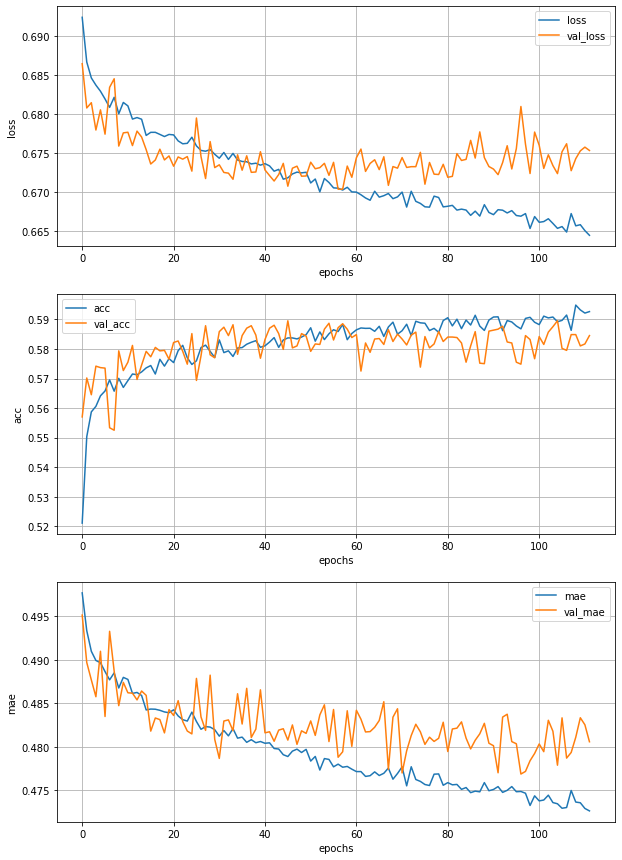

Epoch 113/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6646 - acc: 0.5902 - mae: 0.4729 - val_loss: 0.6756 - val_acc: 0.5857 - val_mae: 0.4782


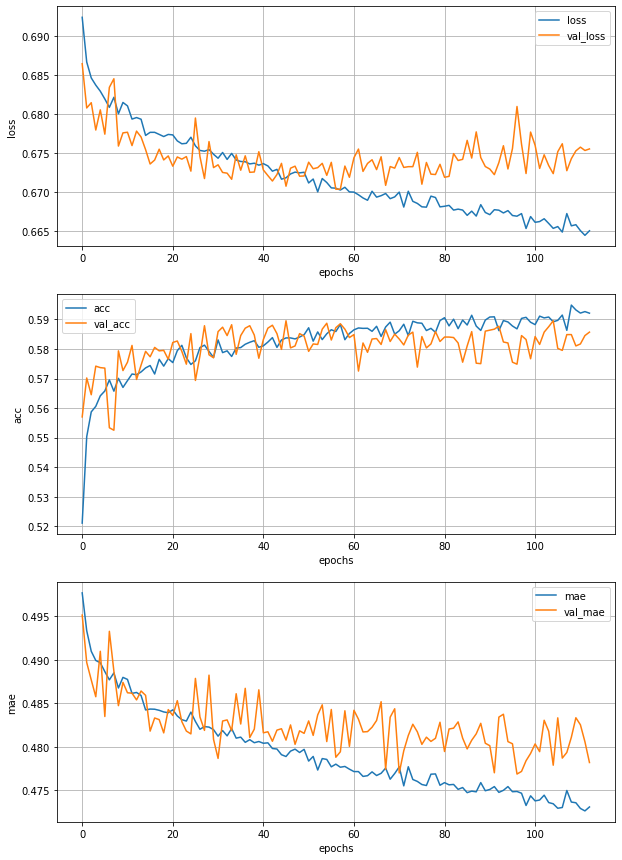

Epoch 114/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6636 - acc: 0.5948 - mae: 0.4715 - val_loss: 0.6742 - val_acc: 0.5870 - val_mae: 0.4803


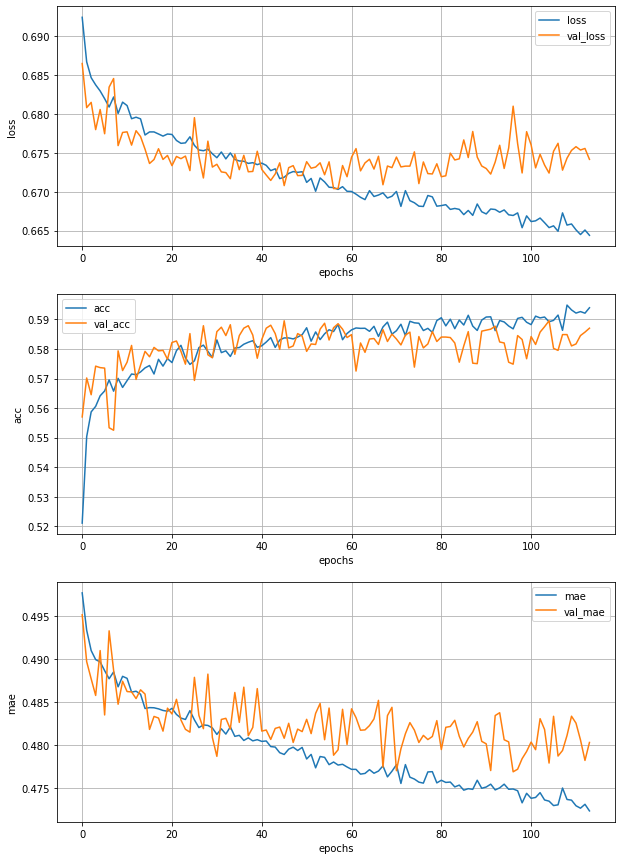

Epoch 115/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6674 - acc: 0.5874 - mae: 0.4749 - val_loss: 0.6736 - val_acc: 0.5875 - val_mae: 0.4798


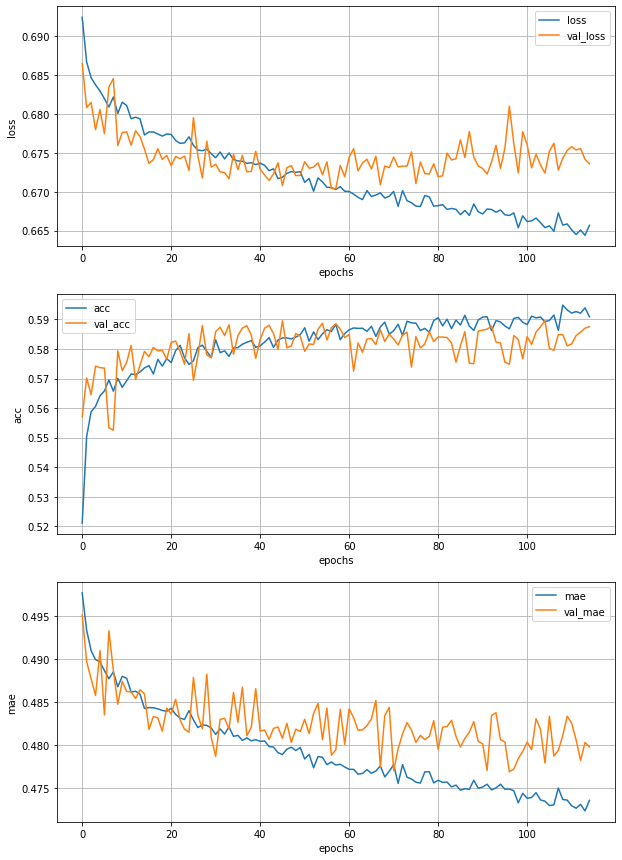

Epoch 116/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6628 - acc: 0.5943 - mae: 0.4712 - val_loss: 0.6778 - val_acc: 0.5887 - val_mae: 0.4784


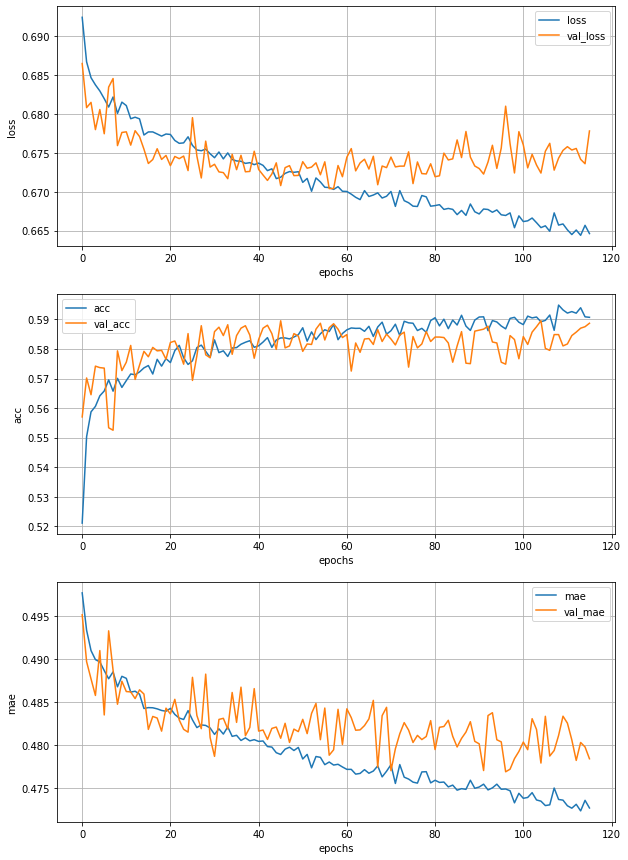

Epoch 117/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6655 - acc: 0.5944 - mae: 0.4728 - val_loss: 0.6776 - val_acc: 0.5767 - val_mae: 0.4816


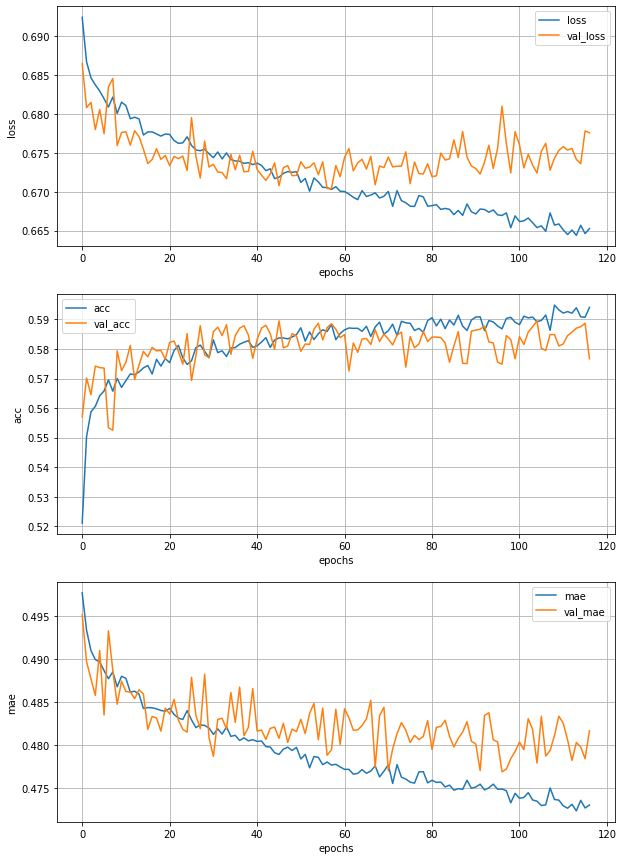

Epoch 118/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6668 - acc: 0.5899 - mae: 0.4745 - val_loss: 0.6753 - val_acc: 0.5824 - val_mae: 0.4800


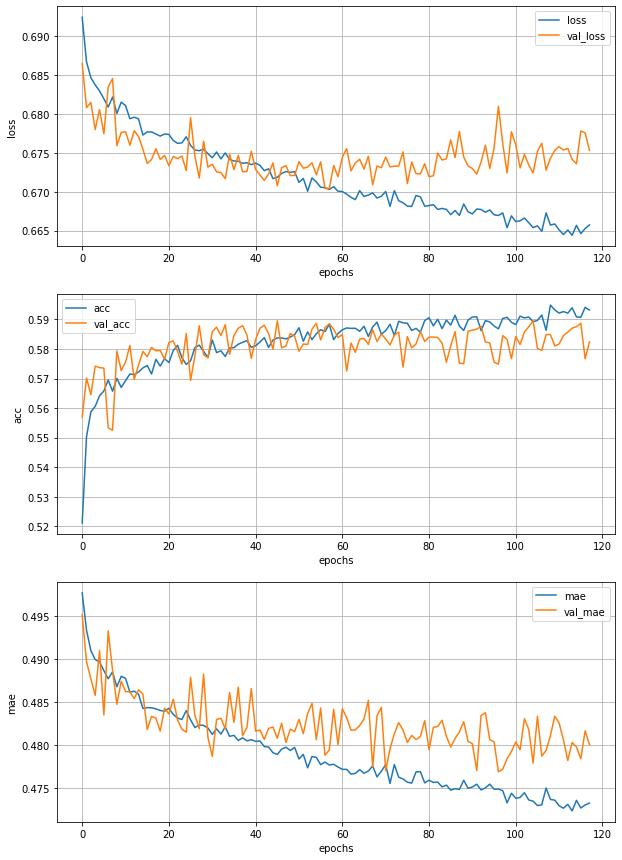

Epoch 119/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6648 - acc: 0.5883 - mae: 0.4726 - val_loss: 0.6791 - val_acc: 0.5727 - val_mae: 0.4836


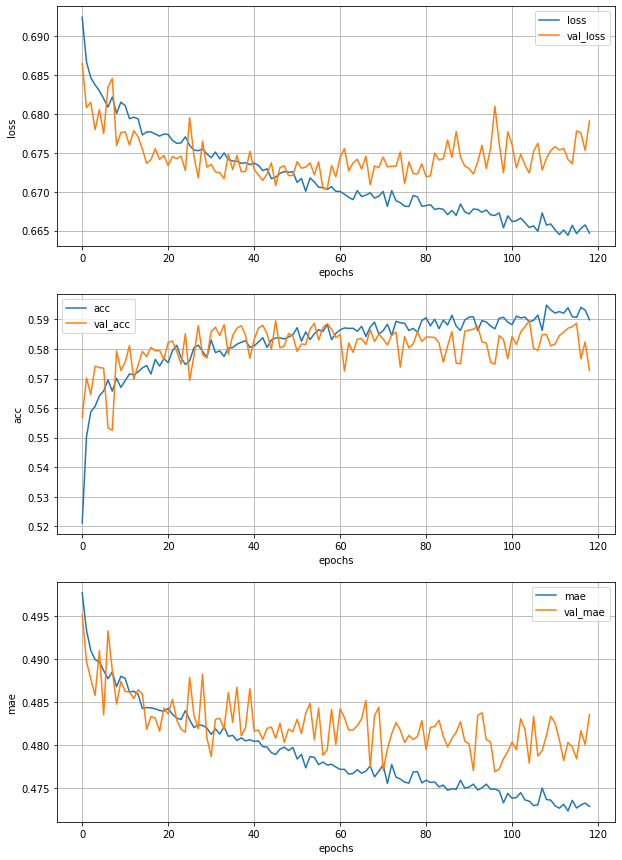

Epoch 120/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6653 - acc: 0.5893 - mae: 0.4731 - val_loss: 0.6734 - val_acc: 0.5857 - val_mae: 0.4794


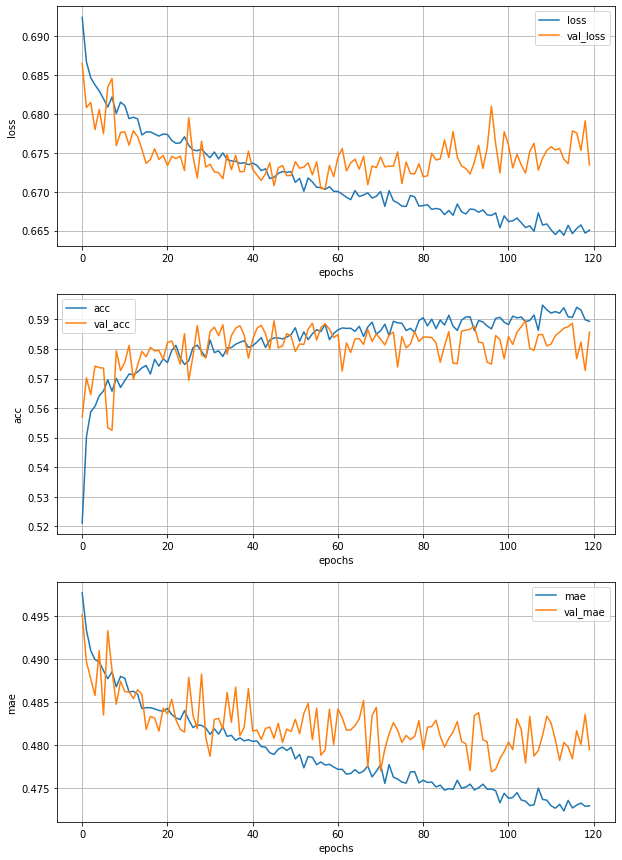

Epoch 121/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6637 - acc: 0.5948 - mae: 0.4722 - val_loss: 0.6773 - val_acc: 0.5792 - val_mae: 0.4800


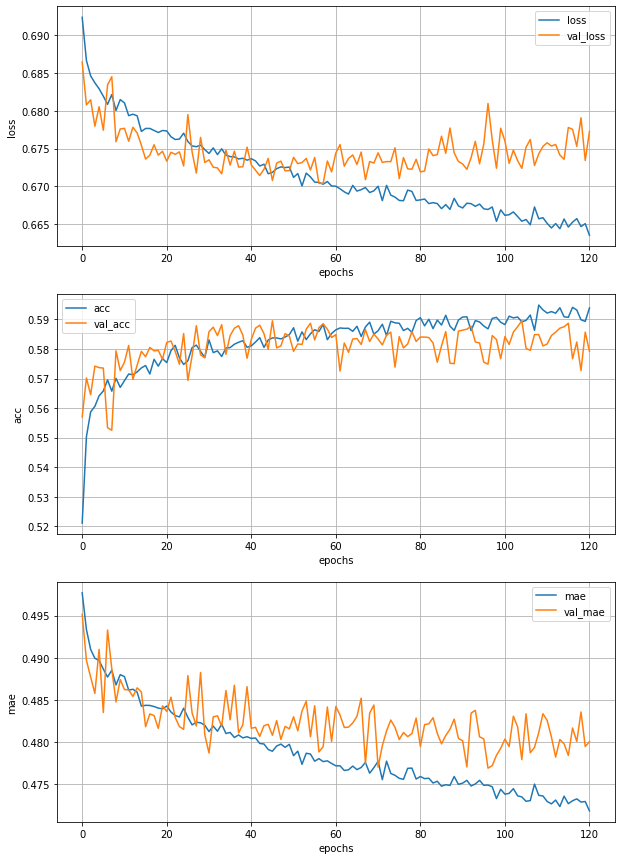

Epoch 122/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6634 - acc: 0.5958 - mae: 0.4714 - val_loss: 0.6750 - val_acc: 0.5799 - val_mae: 0.4808


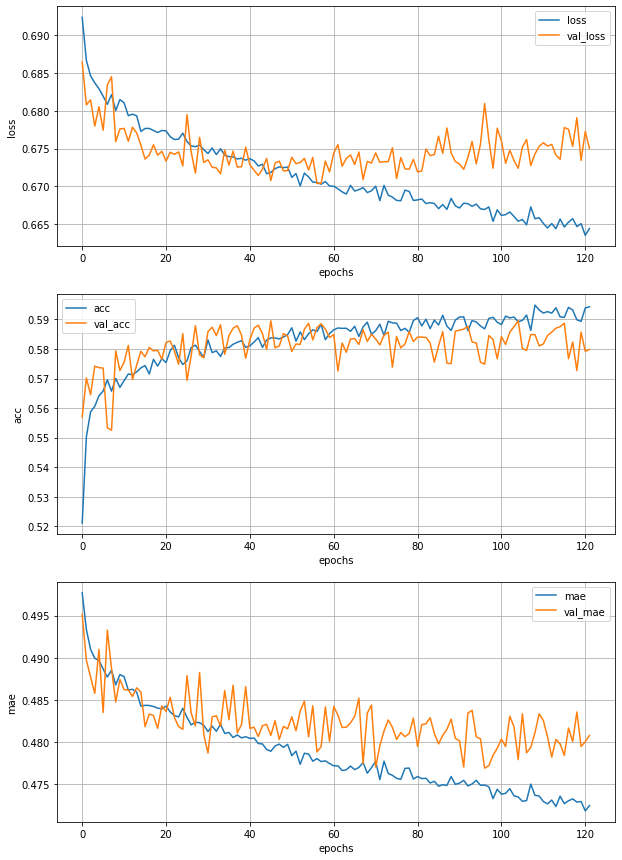

Epoch 123/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6594 - acc: 0.6011 - mae: 0.4685 - val_loss: 0.6788 - val_acc: 0.5792 - val_mae: 0.4838


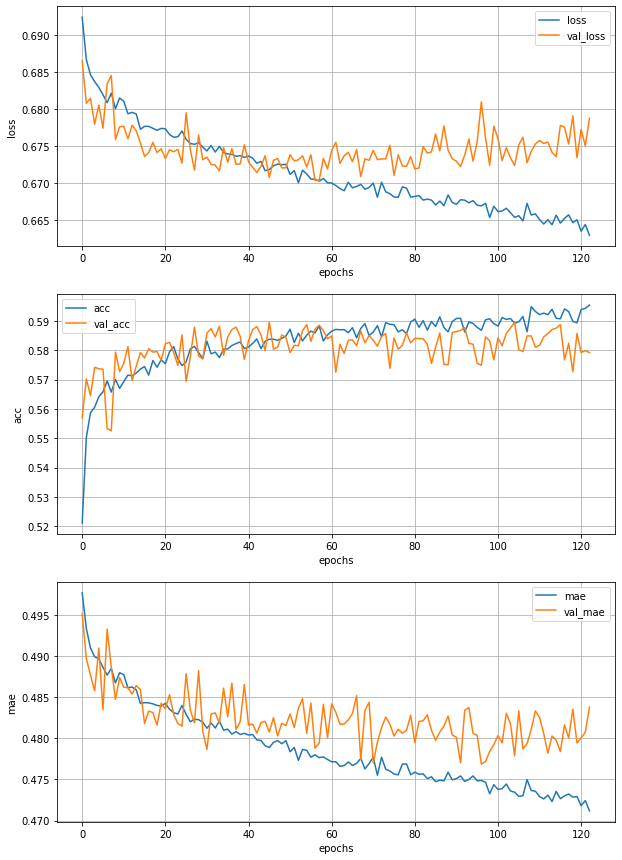

Epoch 124/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6649 - acc: 0.5914 - mae: 0.4731 - val_loss: 0.6745 - val_acc: 0.5847 - val_mae: 0.4787


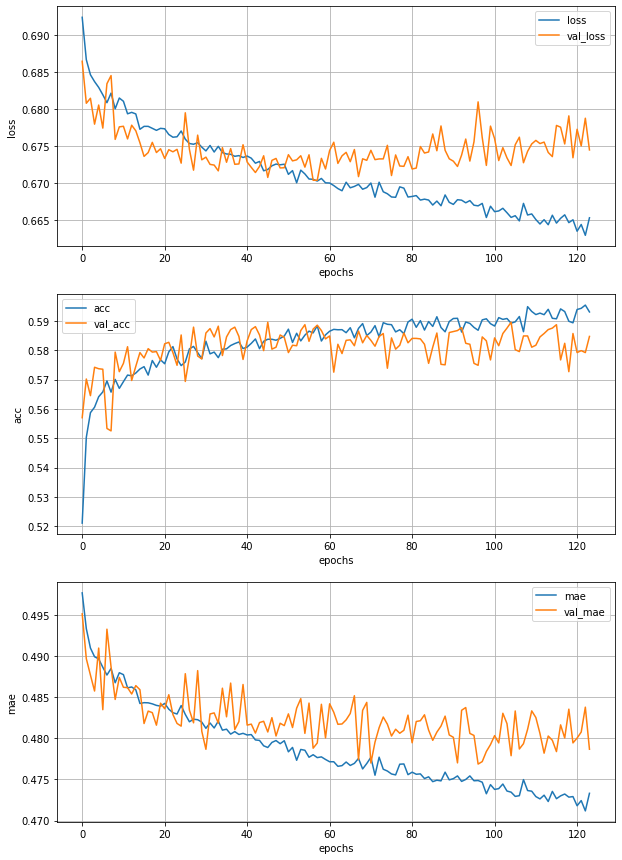

Epoch 125/150
938/938 [==============================] - 6s 6ms/step - loss: 0.6617 - acc: 0.5960 - mae: 0.4700 - val_loss: 0.6786 - val_acc: 0.5785 - val_mae: 0.4833


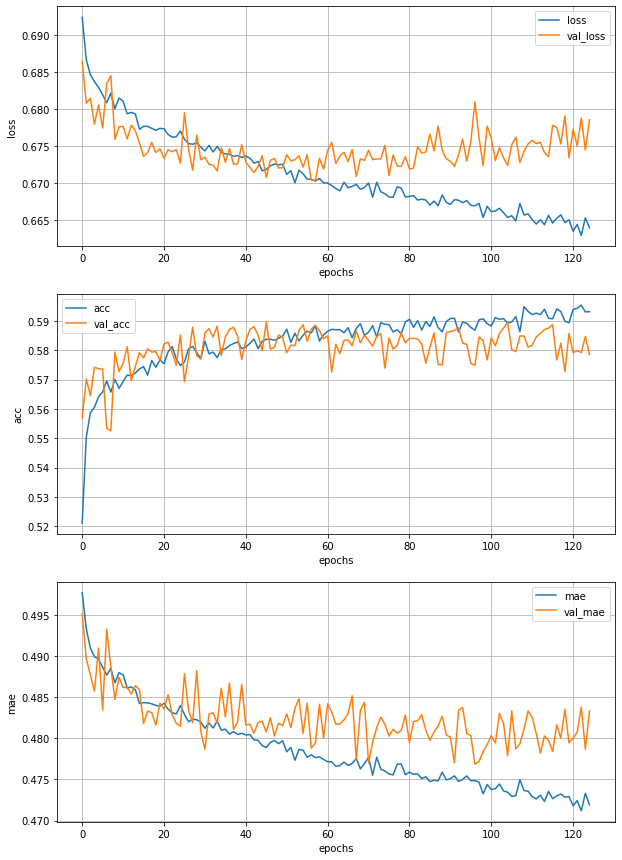

Epoch 126/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6621 - acc: 0.5917 - mae: 0.4710 - val_loss: 0.6761 - val_acc: 0.5847 - val_mae: 0.4823


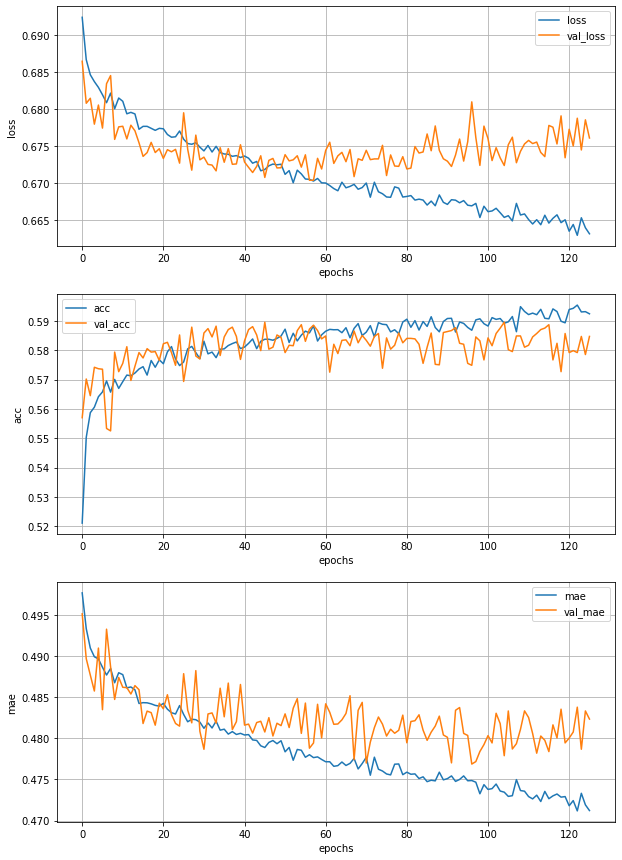

Epoch 127/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6638 - acc: 0.5911 - mae: 0.4724 - val_loss: 0.6758 - val_acc: 0.5795 - val_mae: 0.4783


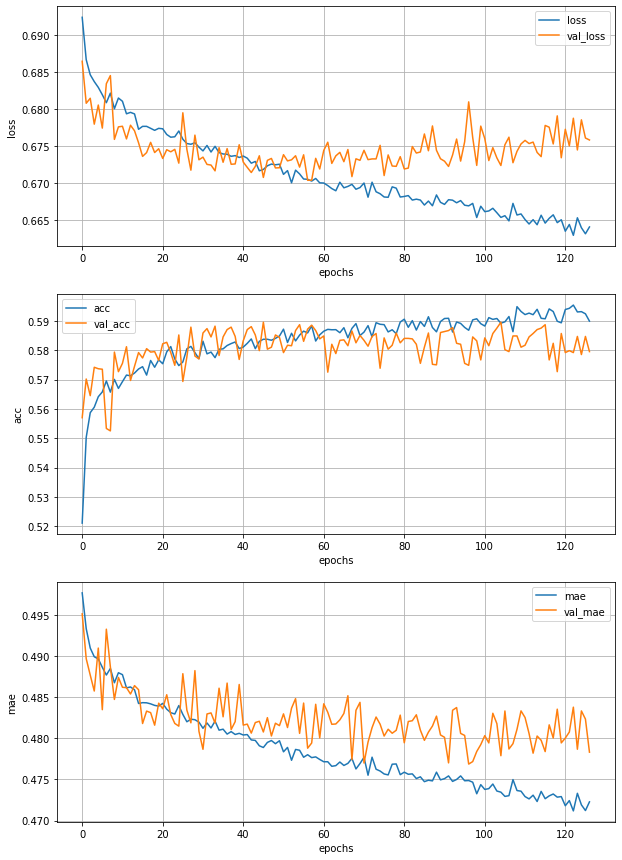

Epoch 128/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6644 - acc: 0.5925 - mae: 0.4726 - val_loss: 0.6759 - val_acc: 0.5815 - val_mae: 0.4795


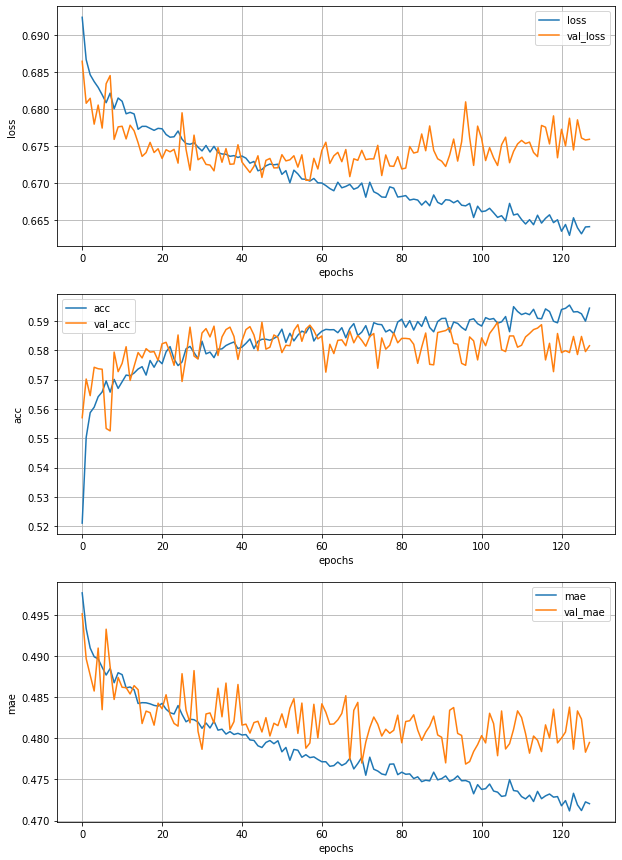

Epoch 129/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6623 - acc: 0.5928 - mae: 0.4706 - val_loss: 0.6755 - val_acc: 0.5882 - val_mae: 0.4783


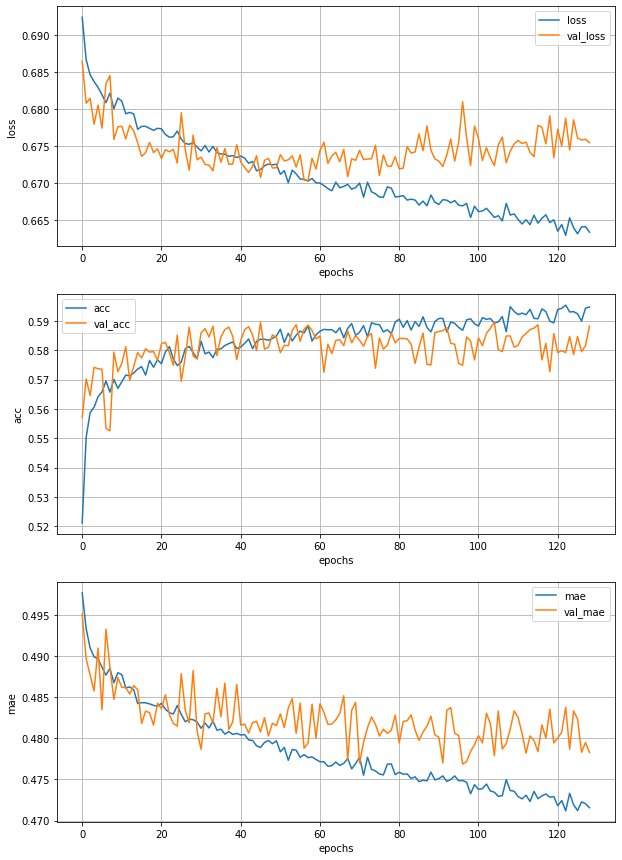

Epoch 130/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6640 - acc: 0.5933 - mae: 0.4722 - val_loss: 0.6764 - val_acc: 0.5775 - val_mae: 0.4805


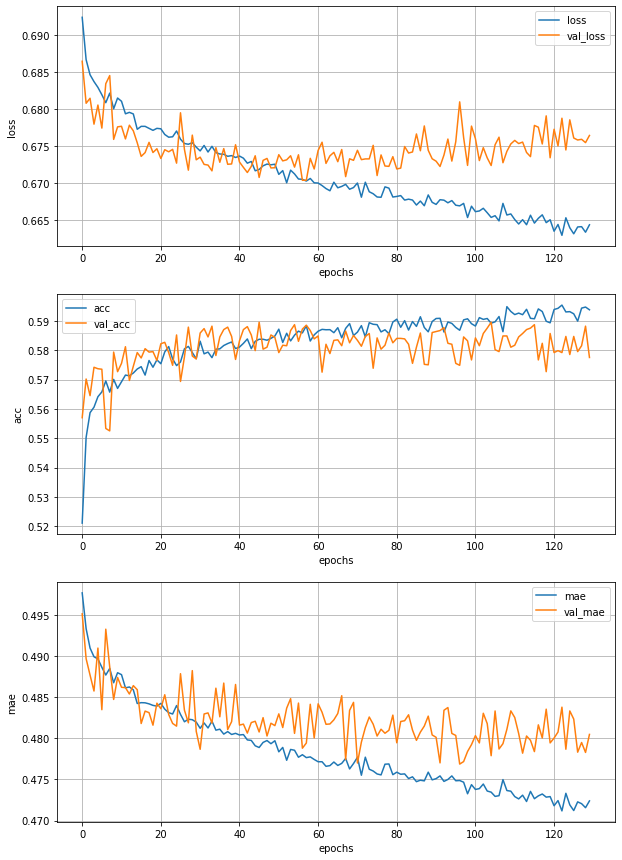

Epoch 131/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6641 - acc: 0.5913 - mae: 0.4719 - val_loss: 0.6762 - val_acc: 0.5810 - val_mae: 0.4810


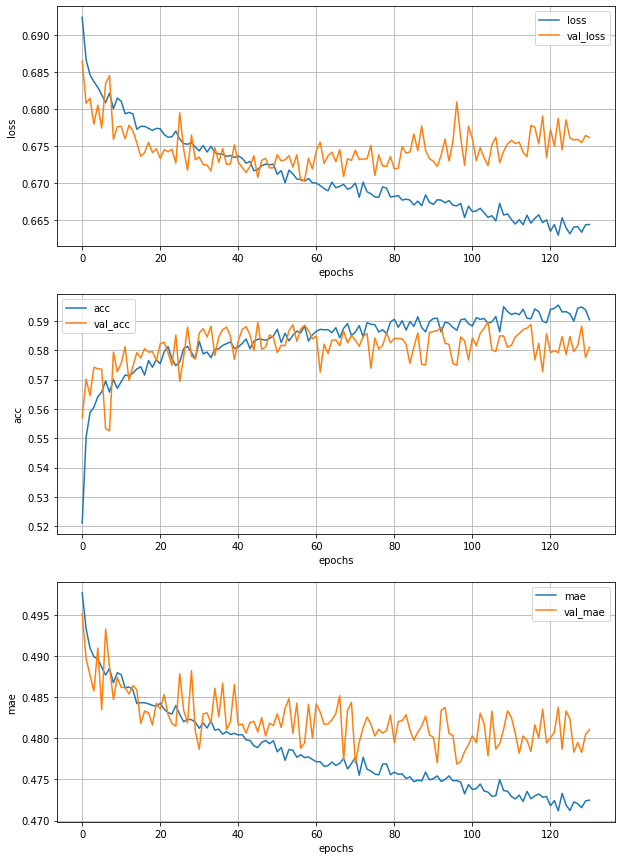

Epoch 132/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6643 - acc: 0.5905 - mae: 0.4723 - val_loss: 0.6778 - val_acc: 0.5817 - val_mae: 0.4813


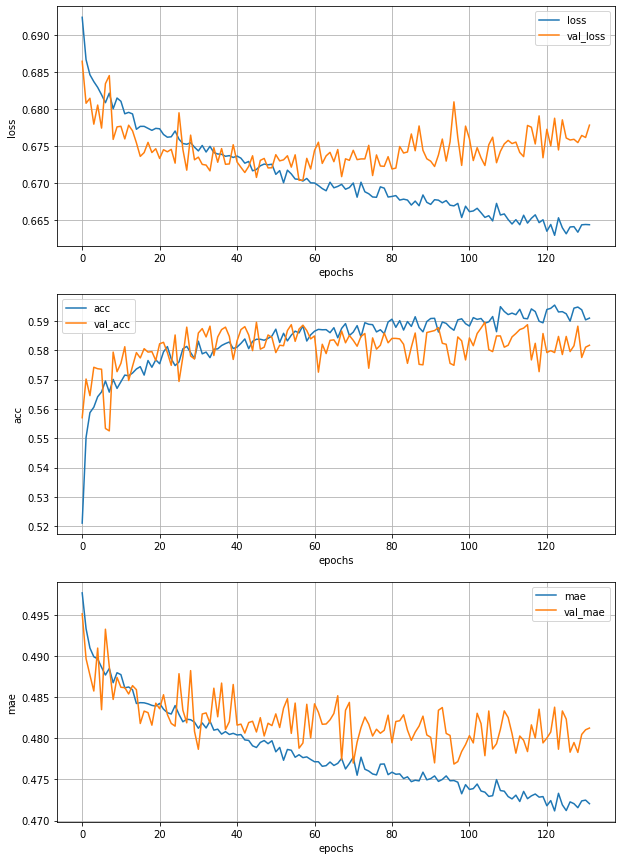

Epoch 133/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6665 - acc: 0.5881 - mae: 0.4747 - val_loss: 0.6756 - val_acc: 0.5854 - val_mae: 0.4812


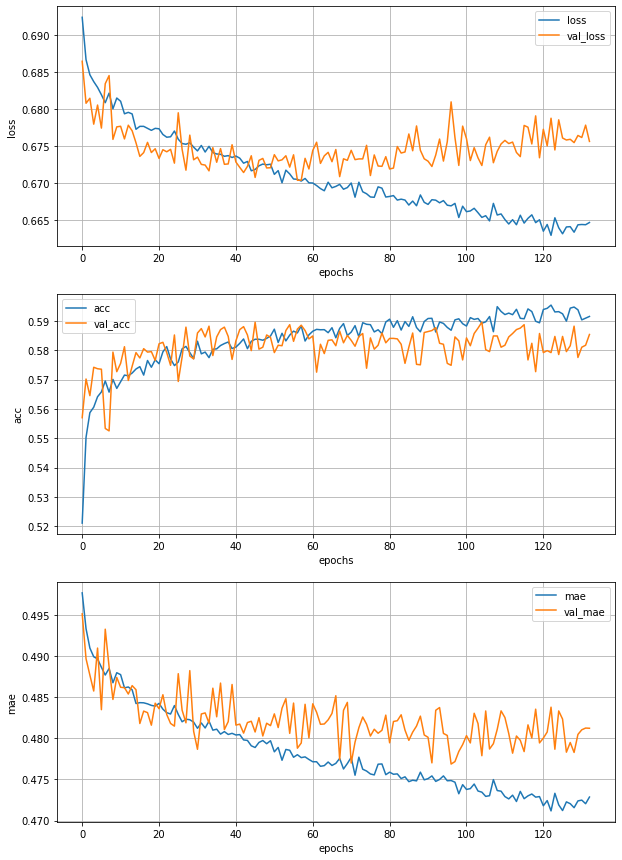

Epoch 134/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6648 - acc: 0.5928 - mae: 0.4728 - val_loss: 0.6765 - val_acc: 0.5834 - val_mae: 0.4813


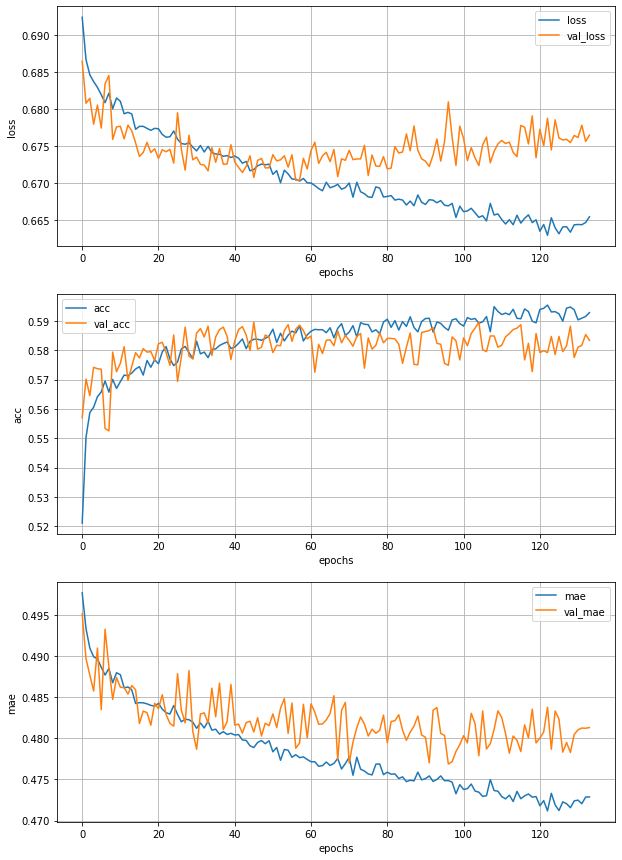

Epoch 135/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6631 - acc: 0.5919 - mae: 0.4716 - val_loss: 0.6790 - val_acc: 0.5827 - val_mae: 0.4816


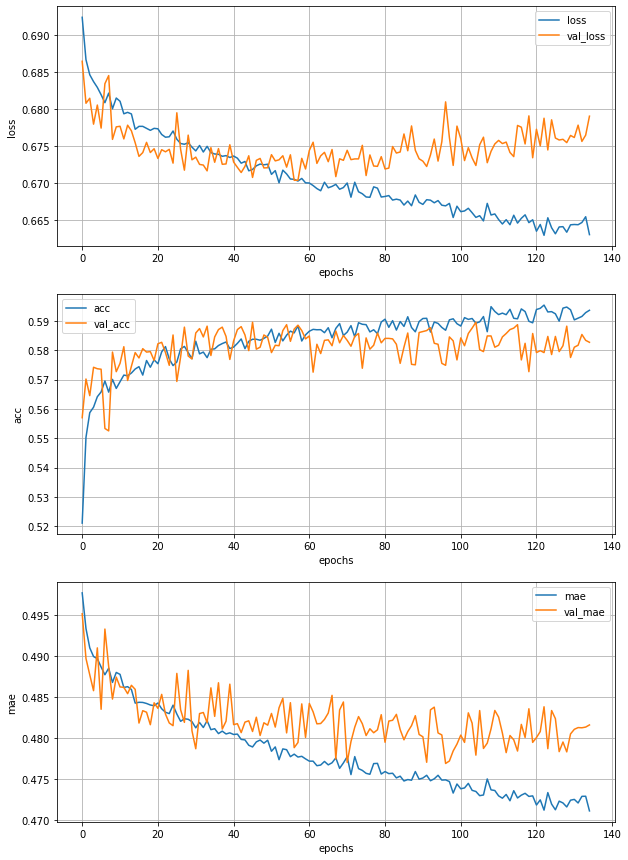

Epoch 136/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6656 - acc: 0.5947 - mae: 0.4736 - val_loss: 0.6765 - val_acc: 0.5789 - val_mae: 0.4789


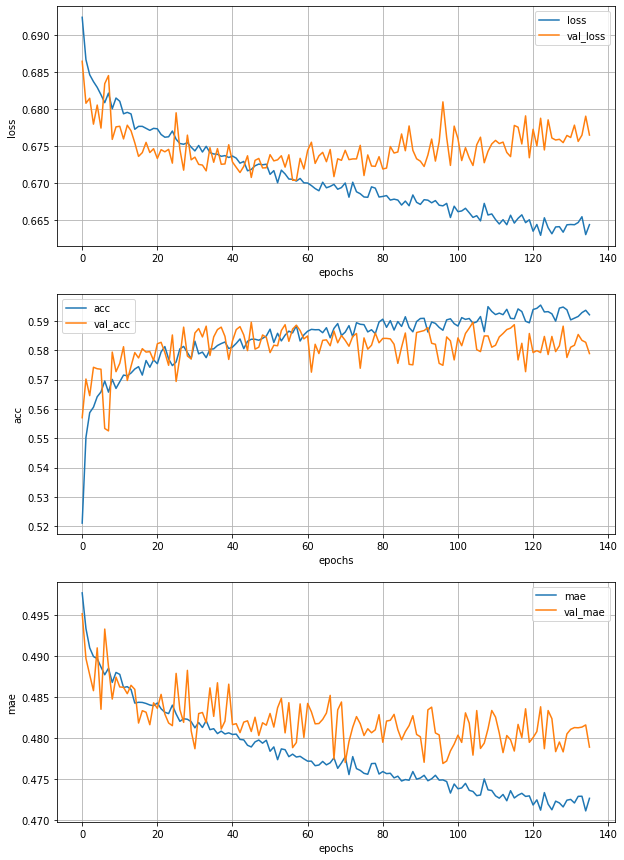

Epoch 137/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6669 - acc: 0.5822 - mae: 0.4742 - val_loss: 0.6775 - val_acc: 0.5734 - val_mae: 0.4799


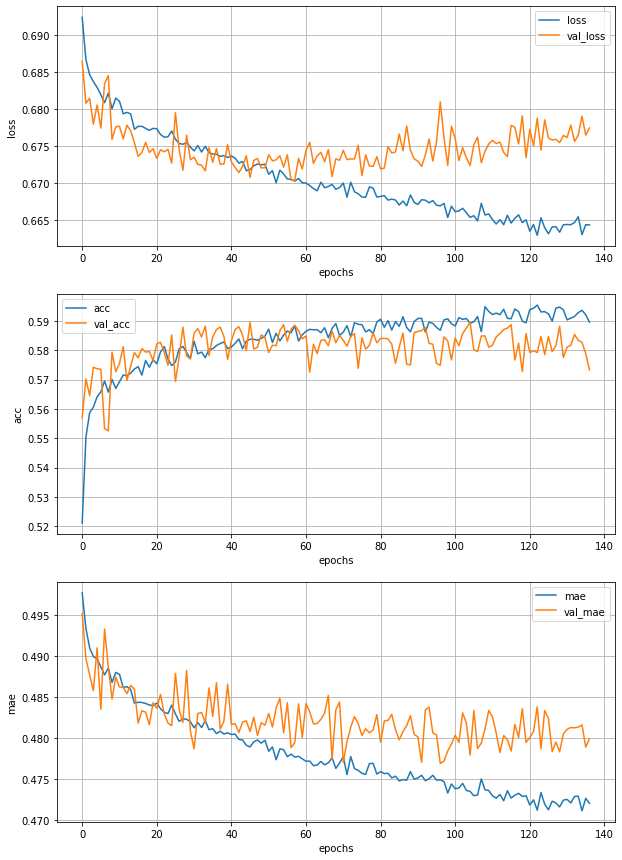

Epoch 138/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6644 - acc: 0.5911 - mae: 0.4728 - val_loss: 0.6767 - val_acc: 0.5874 - val_mae: 0.4783


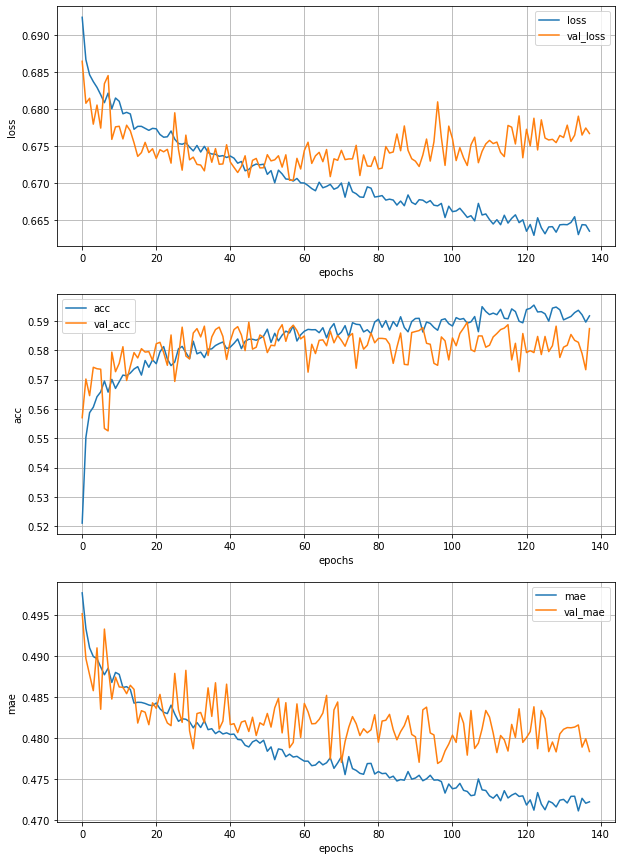

Epoch 139/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6618 - acc: 0.5947 - mae: 0.4701 - val_loss: 0.6759 - val_acc: 0.5830 - val_mae: 0.4820


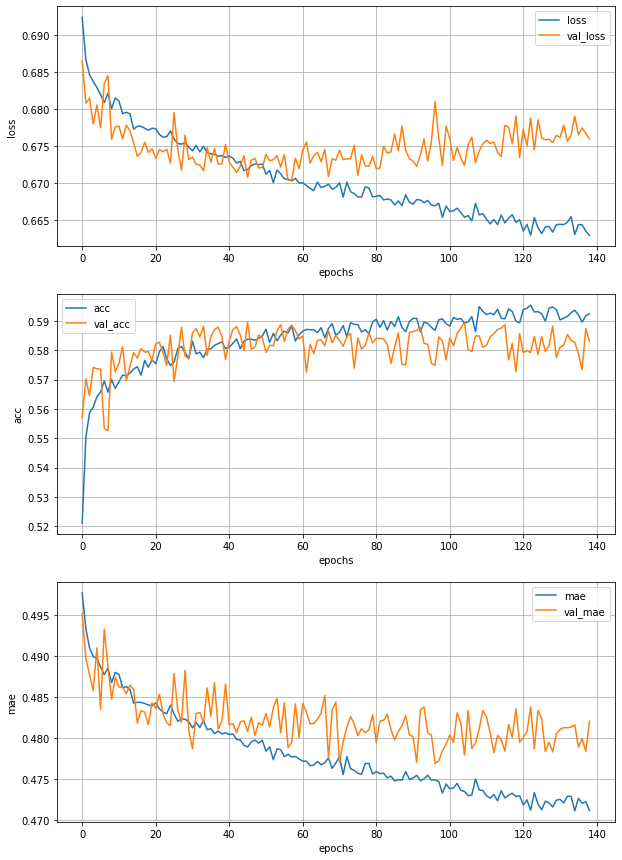

Epoch 140/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6627 - acc: 0.5932 - mae: 0.4710 - val_loss: 0.6743 - val_acc: 0.5879 - val_mae: 0.4811


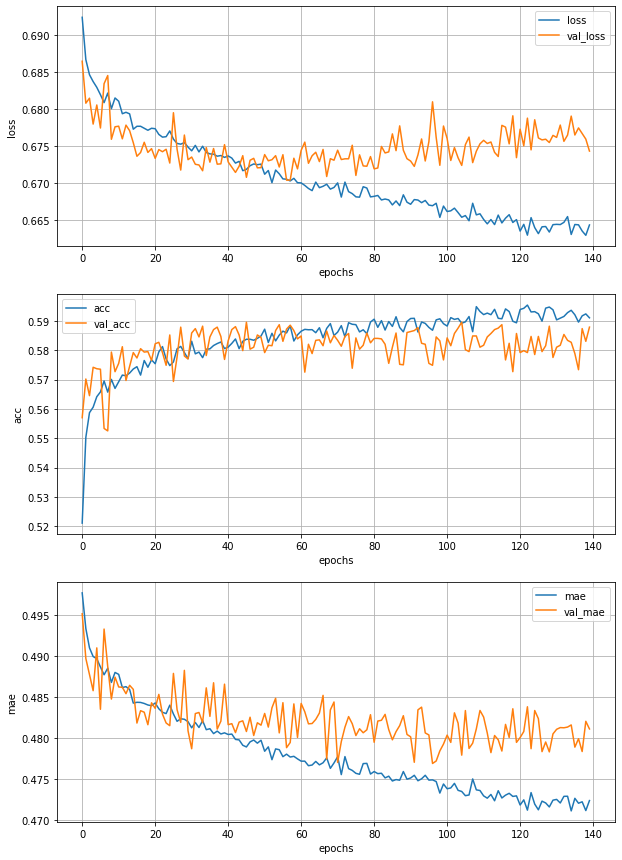

Epoch 141/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6645 - acc: 0.5913 - mae: 0.4728 - val_loss: 0.6756 - val_acc: 0.5800 - val_mae: 0.4802


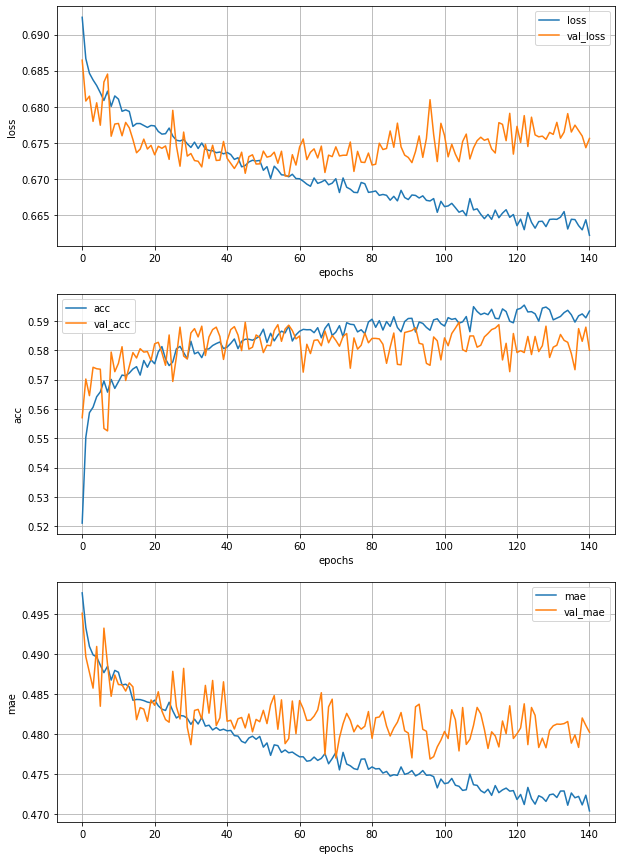

Epoch 142/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6612 - acc: 0.5956 - mae: 0.4703 - val_loss: 0.6815 - val_acc: 0.5815 - val_mae: 0.4828


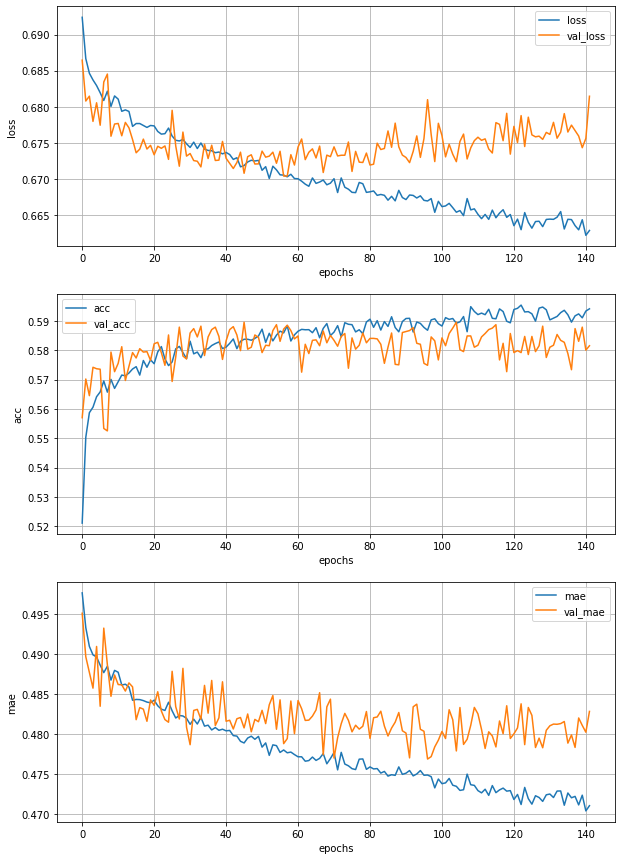

Epoch 143/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6610 - acc: 0.5992 - mae: 0.4702 - val_loss: 0.6754 - val_acc: 0.5859 - val_mae: 0.4797


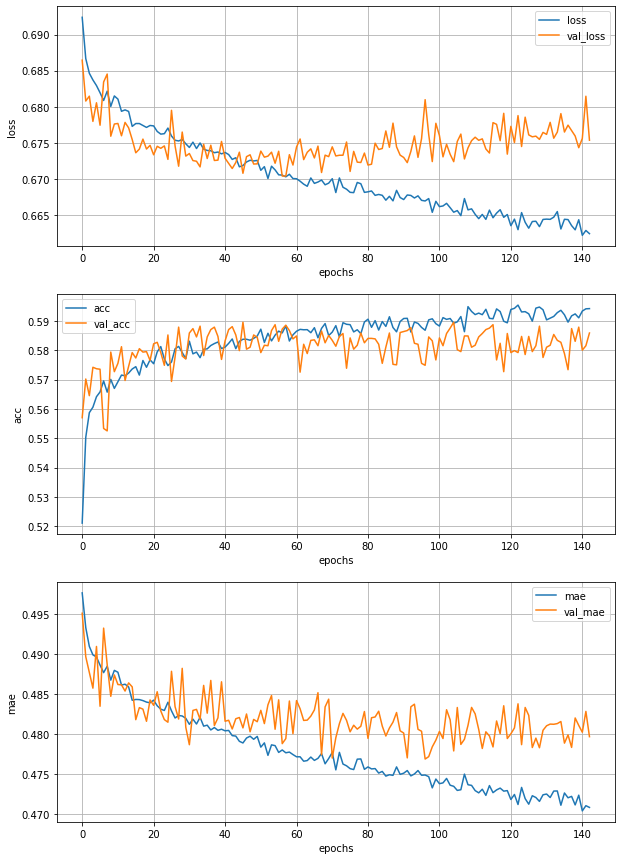

Epoch 144/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6648 - acc: 0.5893 - mae: 0.4728 - val_loss: 0.6777 - val_acc: 0.5825 - val_mae: 0.4789


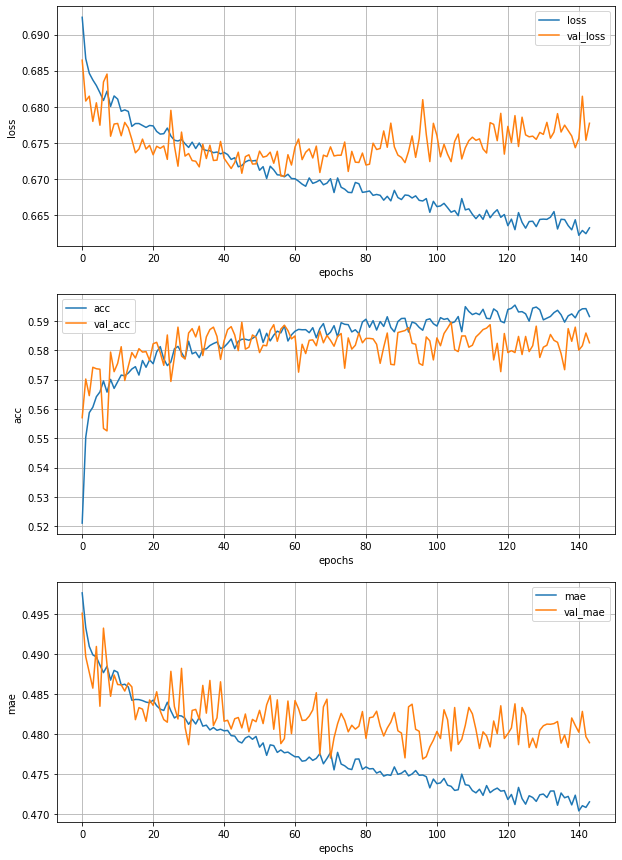

Epoch 145/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6646 - acc: 0.5921 - mae: 0.4717 - val_loss: 0.6807 - val_acc: 0.5810 - val_mae: 0.4828


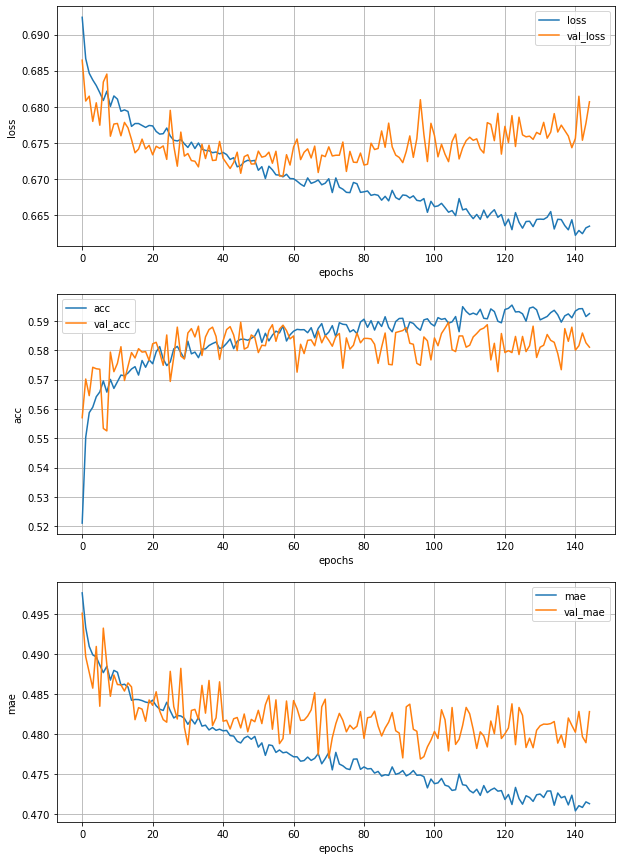

Epoch 146/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6632 - acc: 0.5954 - mae: 0.4714 - val_loss: 0.6787 - val_acc: 0.5819 - val_mae: 0.4818


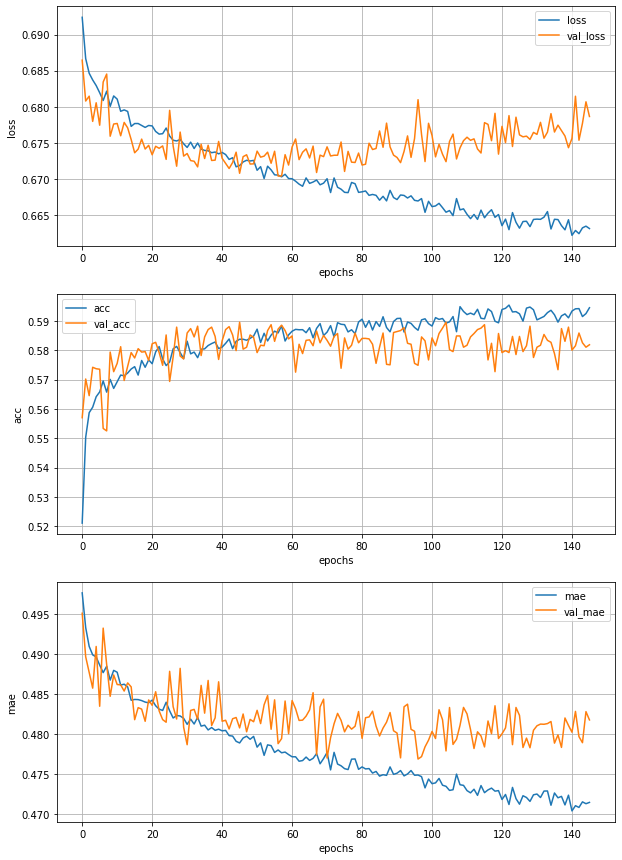

Epoch 147/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6645 - acc: 0.5973 - mae: 0.4725 - val_loss: 0.6782 - val_acc: 0.5834 - val_mae: 0.4794


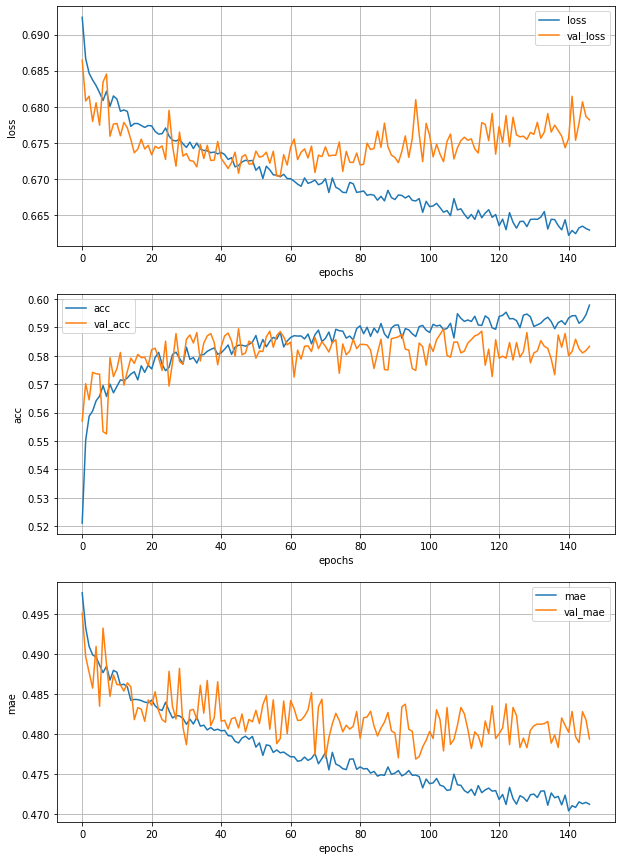

Epoch 148/150
938/938 [==============================] - 4s 5ms/step - loss: 0.6638 - acc: 0.5904 - mae: 0.4717 - val_loss: 0.6766 - val_acc: 0.5775 - val_mae: 0.4814


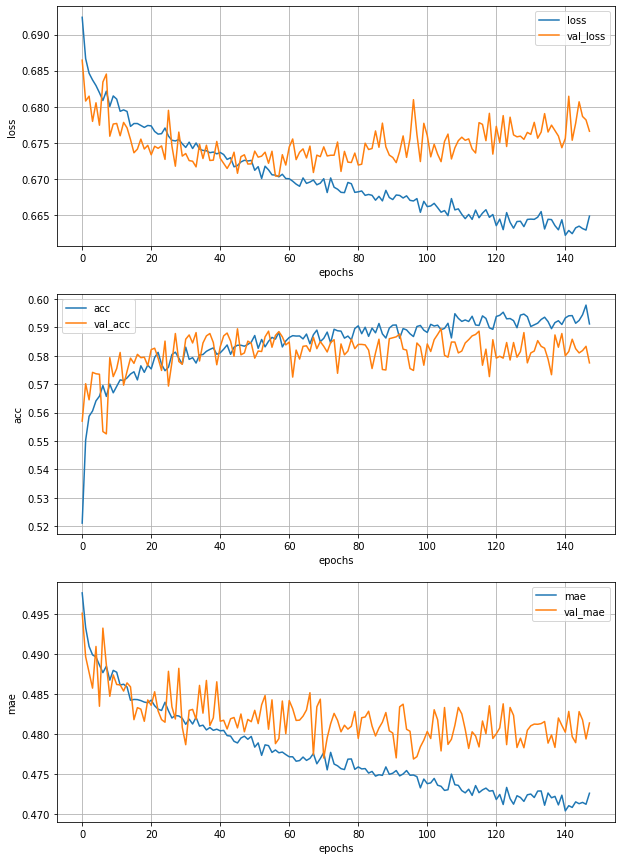

Epoch 149/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6649 - acc: 0.5967 - mae: 0.4727 - val_loss: 0.6795 - val_acc: 0.5837 - val_mae: 0.4777


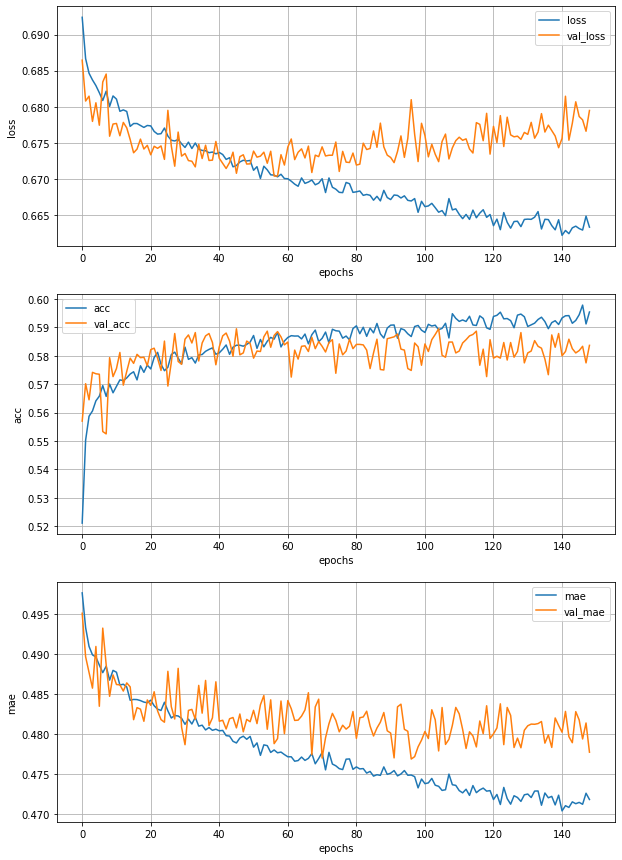

Epoch 150/150
938/938 [==============================] - 5s 5ms/step - loss: 0.6610 - acc: 0.5961 - mae: 0.4689 - val_loss: 0.6784 - val_acc: 0.5852 - val_mae: 0.4800


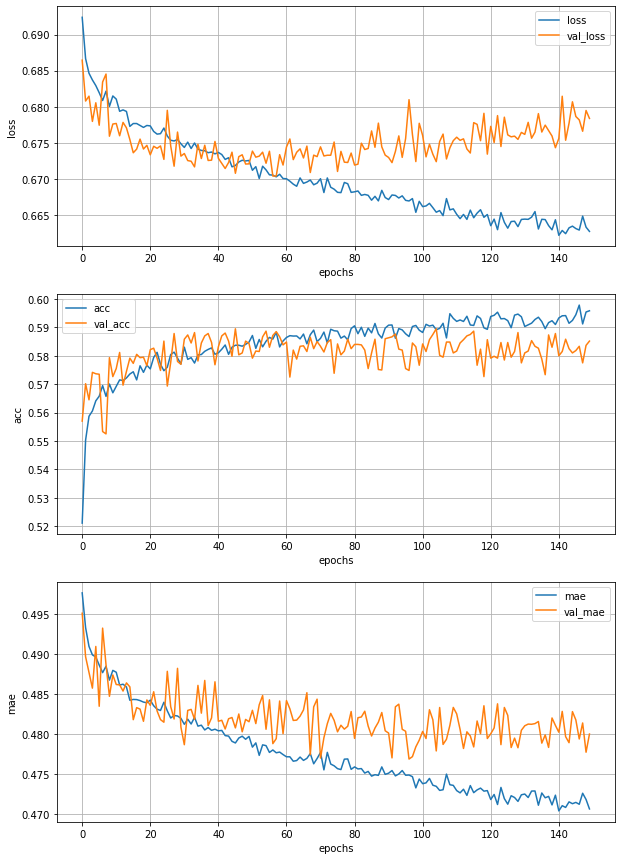

125/125 [==============================] - 0s 4ms/step - loss: 0.6740 - acc: 0.5941 - mae: 0.4774


[0.6739875078201294, 0.5941485166549683, 0.47736817598342896]

In [22]:
hist = Record()
decision.fit(
    training_x, training_y,
    epochs=150,
    validation_data=(val_x, val_y),
    callbacks=[hist]
)
decision.evaluate(testing_x, testing_y)

In [23]:
# data.encoder = None
# x, y = data.all()

In [24]:
# history=model.fit(
#     x, y,
#     epochs=20, 
#     validation_split=0.2
# )

In [25]:
# model.save_weights('./models/weight-sol1--bert-128-32-1--0%do--150epochs--idx2',overwrite=True)